In [1]:
import os
import re
import shutil

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tifffile
import shapely
from shapely import Polygon, Point, STRtree
from shapely.wkt import dumps, loads


In [2]:
%load_ext autoreload
%autoreload 2
from mip.utils import extract_ome_tiff, listfiles, display_region, make_pseudo

## HTAN

In [3]:
directory = '/diskmnt/Projects/Users/estorrs/multiplex_data/analysis/dcis_region_analysis/htan_v7'


In [4]:
fps = sorted(listfiles(directory, regex='/regions.npy$'))
fps

['/diskmnt/Projects/Users/estorrs/multiplex_data/analysis/dcis_region_analysis/htan_v7/HT206B1-H1/outputs/regions.npy',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/analysis/dcis_region_analysis/htan_v7/HT206B1_H1_06252022/outputs/regions.npy',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/analysis/dcis_region_analysis/htan_v7/HT323B1-H1A1/outputs/regions.npy',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/analysis/dcis_region_analysis/htan_v7/HT323B1-H1A4/outputs/regions.npy',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/analysis/dcis_region_analysis/htan_v7/HT323B1-H3/outputs/regions.npy',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/analysis/dcis_region_analysis/htan_v7/HT397B1-H2A2/outputs/regions.npy',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/analysis/dcis_region_analysis/htan_v7/HT397B1-H3A1/outputs/regions.npy']

In [5]:
sample_to_imgs = {}
for fp in fps:
    sample = fp.split('/')[-3]
    d = np.load(fp, allow_pickle=True)[()]
    sample_to_imgs[sample] = d
    

In [ ]:
fps = sorted(listfiles(directory, regex='/grid_regions.npy$'))
fps

In [ ]:
sample_to_grid_imgs = {}
for fp in fps:
    sample = fp.split('/')[-3]
    d = np.load(fp, allow_pickle=True)[()]
    sample_to_grid_imgs[sample] = d

In [ ]:
fps = sorted(listfiles(directory, regex='/grid_polygons.json$'))
fps

In [ ]:
sample_to_polys = {}
for fp in fps:
    sample = fp.split('/')[-3]
    d = json.load(open(fp))
    sample_to_polys[sample] = d

In [10]:
sample_to_imgs.keys()

dict_keys(['HT206B1-H1', 'HT206B1_H1_06252022', 'HT323B1-H1A1', 'HT323B1-H1A4', 'HT323B1-H3', 'HT397B1-H2A2', 'HT397B1-H3A1'])

In [6]:
fps = sorted(listfiles('/diskmnt/Projects/Users/estorrs/multiplex_data/codex/htan/brca/', regex='level_2.*ome.tiff$'))
fps = [fp for fp in fps if fp.split('/')[-1].replace('.ome.tiff', '') in sample_to_imgs]
fps

['/diskmnt/Projects/Users/estorrs/multiplex_data/codex/htan/brca/HT206B1-H1/level_2/HT206B1-H1.ome.tiff',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/codex/htan/brca/HT206B1_H1_06252022/level_2/HT206B1_H1_06252022.ome.tiff',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/codex/htan/brca/HT323B1-H1A1/level_2/HT323B1-H1A1.ome.tiff',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/codex/htan/brca/HT323B1-H1A4/level_2/HT323B1-H1A4.ome.tiff',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/codex/htan/brca/HT323B1-H3/level_2/HT323B1-H3.ome.tiff',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/codex/htan/brca/HT397B1-H2A2/level_2/HT397B1-H2A2.ome.tiff',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/codex/htan/brca/HT397B1-H3A1/level_2/HT397B1-H3A1.ome.tiff']

In [7]:
cmap = {
    'DAPI': (0., 0., 1.),
    'Pan-CK': (1., 0., 0.),
    'SMA': (0., 1., 0.),
    'Podoplanin': (1., 1., 1.)
}
sample_to_pseudo = {}
for fp in fps:
    sid = fp.split('/')[-1].replace('.ome.tiff', '')
    print(sid)
    channel_to_img = extract_ome_tiff(fp, channels=['SMA', 'DAPI', 'Pan-CK', 'Podoplanin'])
#     channel_to_img = {k:v[2000:4000, 2000:4000] for k, v in channel_to_img.items()}
    pseudo = make_pseudo(channel_to_img, cmap, contrast_pct=95.)
    sample_to_pseudo[sid] = pseudo

HT206B1-H1
HT206B1_H1_06252022
HT323B1-H1A1
HT323B1-H1A4
HT323B1-H3
HT397B1-H2A2
HT397B1-H3A1


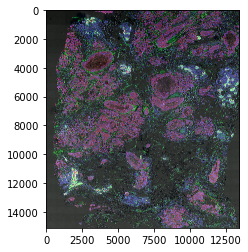

In [8]:
plt.imshow(next(iter(sample_to_pseudo.values())))

In [9]:
fps = sorted(listfiles(directory, regex='region_metrics.txt$'))
fps

['/diskmnt/Projects/Users/estorrs/multiplex_data/analysis/dcis_region_analysis/htan_v7/HT206B1-H1/outputs/region_metrics.txt',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/analysis/dcis_region_analysis/htan_v7/HT206B1_H1_06252022/outputs/region_metrics.txt',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/analysis/dcis_region_analysis/htan_v7/HT323B1-H1A1/outputs/region_metrics.txt',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/analysis/dcis_region_analysis/htan_v7/HT323B1-H1A4/outputs/region_metrics.txt',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/analysis/dcis_region_analysis/htan_v7/HT323B1-H3/outputs/region_metrics.txt',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/analysis/dcis_region_analysis/htan_v7/HT397B1-H2A2/outputs/region_metrics.txt',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/analysis/dcis_region_analysis/htan_v7/HT397B1-H3A1/outputs/region_metrics.txt']

In [10]:
sample_to_df = {}
for fp in fps:
    sample = fp.split('/')[-3]
    df = pd.read_csv(fp, sep='\t', index_col=0)
    df['sample'] = sample
    df.index = [f'{sample}_{i}' for i, s in zip(df.index, df['sample'])]
    
    sample_to_df[sample] = df
    
cols = sorted({c for df in sample_to_df.values() for c in df.columns})
combined = None
for s, df in sample_to_df.items():
    missing = set(cols) - set(df.columns)
    for c in missing:
        df[c] = np.nan
    df = df[cols]
    
    if combined is None:
        combined = df
    else:
        combined = pd.concat((combined, df), axis=0)
        
combined

,boundary_area,boundary_bbox-0,boundary_bbox-1,boundary_bbox-2,boundary_bbox-3,boundary_cell_type_CD4 T cell_cell_fraction,boundary_cell_type_CD8 T cell_cell_fraction,boundary_cell_type_Endothelial_cell_fraction,boundary_cell_type_Fibroblast_cell_fraction,boundary_cell_type_Macrophage - M1_cell_fraction,...,region_metacluster_T cell Enriched_cell_fraction,region_metacluster_Tumor Boundary - M2 Macrophage Enriched_cell_fraction,region_metacluster_Tumor Boundary - Mixed Immune Enriched_cell_fraction,region_metacluster_Tumor Boundary - Mixed_cell_fraction,region_metacluster_Tumor Boundary - Stroma Enriched 1_cell_fraction,region_metacluster_Tumor Boundary - Stroma Enriched 2_cell_fraction,region_metacluster_Tumor_cell_fraction,region_perimeter,region_voronoi_entropy,sample
HT206B1-H1_1,288848,0,3292,428,4858,0.000000,0.018519,0.018519,0.129630,0.018519,...,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.996296,2983.010460,1.422960,HT206B1-H1
HT206B1-H1_2,3584904,0,5869,3535,10328,0.044394,0.057562,0.096689,0.257336,0.118886,...,0.0,0.000621,0.0,0.006209,0.024992,0.013660,0.952189,41180.726733,1.544055,HT206B1-H1
HT206B1-H1_3,294295,0,10215,922,11262,0.042254,0.000000,0.103286,0.333333,0.140845,...,0.0,0.000000,0.0,0.000000,0.027778,0.009259,0.953704,3535.511252,1.452809,HT206B1-H1
HT206B1-H1_4,35898,0,11124,174,11449,0.000000,0.000000,0.052632,0.315789,0.210526,...,0.0,0.000000,0.0,0.000000,0.285714,0.428571,0.142857,318.509668,0.000000,HT206B1-H1
HT206B1-H1_5,646084,0,10536,1373,12334,0.044118,0.026961,0.068627,0.223039,0.122549,...,0.0,0.000000,0.0,0.000801,0.009608,0.011209,0.977582,7239.408327,1.538911,HT206B1-H1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HT397B1-H3A1_807,34432,19286,8942,19515,9160,0.428571,0.267857,0.000000,0.071429,0.053571,...,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,30.142136,NaN,HT397B1-H3A1
HT397B1-H3A1_808,100067,19336,11047,19698,11420,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,198.877200,NaN,HT397B1-H3A1
HT397B1-H3A1_809,78991,19796,2050,20113,2371,0.000000,0.000000,0.222222,0.222222,0.000000,...,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,56.769553,NaN,HT397B1-H3A1
HT397B1-H3A1_810,74758,19859,10591,20160,10903,0.000000,0.000000,0.200000,0.200000,0.000000,...,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,33.112698,NaN,HT397B1-H3A1


In [11]:
{x.split('_')[0] for x in combined.columns}

{'boundary', 'expanded', 'myoepi', 'region', 'sample'}

In [17]:
region_types = ['boundary', 'expanded', 'myoepi', 'region']
weighted_mean = lambda x: np.average(x, weights=df.loc[x.index, "area"])

ignore = ['area', 'bbox', 'centroid', 'perimeter', 'grid_metrics']
# reduce to slide level
reduced = None
for rt in region_types:
    weighted_mean = lambda x: np.average(x, weights=combined.loc[x.index, f"{rt}_area"])
    cols = [c for c in combined.columns if rt == c.split('_')[0]]
    cols = [c for c in cols if not any([x in c for x in ignore])]
    cols.append('sample')
    f = combined[cols]
    f = f.replace(np.nan, 0.) # bug fixed in pipeline soon
    f = f.groupby('sample').agg(weighted_mean)
    
    sums = combined[['sample', f'{rt}_area', f'{rt}_perimeter']]
    sums = sums.groupby('sample').sum()
    f = pd.concat((f, sums), axis=1)
    
    if rt == 'myoepi':
        cols = [c for c in combined.columns if 'grid_metrics' in c]
        cols.append('sample')
        grid = combined[cols]
        grid = grid.replace(np.nan, 0.)
        grid = grid.groupby('sample').agg(weighted_mean)
        f = pd.concat((f, grid), axis=1)

    if reduced is None:
        reduced = f
    else:
        reduced = pd.concat((reduced, f), axis=1)
reduced

,boundary_cell_type_CD4 T cell_cell_fraction,boundary_cell_type_CD8 T cell_cell_fraction,boundary_cell_type_Endothelial_cell_fraction,boundary_cell_type_Fibroblast_cell_fraction,boundary_cell_type_Macrophage - M1_cell_fraction,boundary_cell_type_Macrophage - M2_cell_fraction,boundary_cell_type_Myoepithelial_cell_fraction,boundary_cell_type_Noise_cell_fraction,boundary_cell_type_Tumor_cell_fraction,boundary_compactness,...,region_metacluster_T cell Enriched_cell_fraction,region_metacluster_Tumor Boundary - M2 Macrophage Enriched_cell_fraction,region_metacluster_Tumor Boundary - Mixed Immune Enriched_cell_fraction,region_metacluster_Tumor Boundary - Mixed_cell_fraction,region_metacluster_Tumor Boundary - Stroma Enriched 1_cell_fraction,region_metacluster_Tumor Boundary - Stroma Enriched 2_cell_fraction,region_metacluster_Tumor_cell_fraction,region_voronoi_entropy,region_area,region_perimeter
sample,,,,,,,,,,,,,,,,,,,,,
HT206B1-H1,0.068343,0.080336,0.067290,0.244312,0.103629,0.024461,0.049314,0.023977,0.326834,0.207715,...,0.000039,0.002084,0.002031,0.003606,0.015104,0.007210,0.949426,1.493894,52138253,386636.701230
HT206B1_H1_06252022,0.045403,0.069668,0.078255,0.205834,0.071845,0.023360,0.054080,0.010185,0.422534,0.255642,...,0.000034,0.001053,0.001175,0.000406,0.014299,0.005669,0.950583,1.473112,48708470,460259.382722
HT323B1-H1A1,0.029135,0.060320,0.047968,0.280371,0.056371,0.018925,0.070828,0.020527,0.199915,0.389631,...,0.000954,0.034905,0.032514,0.065311,0.032581,0.238620,0.203015,0.974526,18366729,609787.333642
HT323B1-H1A4,0.036551,0.050737,0.054239,0.340616,0.047041,0.031084,0.159835,0.005580,0.240833,0.385337,...,0.000101,0.013156,0.002397,0.006325,0.007177,0.215677,0.307323,1.376539,23199601,588268.594629
HT323B1-H3,0.050407,0.083973,0.054044,0.271671,0.108022,0.008767,0.139338,0.002872,0.260570,0.351745,...,0.000952,0.079490,0.021208,0.010910,0.016712,0.199135,0.436448,1.304646,26364660,896451.587682
HT397B1-H2A2,0.012752,0.031837,0.138968,0.265196,0.068892,0.034601,0.124135,0.000000,0.284344,0.231394,...,0.000511,0.006754,0.002069,0.001888,0.008128,0.028761,0.765516,1.468990,57421868,524720.767622
HT397B1-H3A1,0.070189,0.067068,0.079538,0.334343,0.094993,0.023806,0.065202,0.000000,0.238318,0.216735,...,0.004556,0.003356,0.000264,0.013217,0.019355,0.069872,0.772009,1.497154,82264563,834418.970617


In [18]:
list(reduced.columns)

['boundary_cell_type_CD4 T cell_cell_fraction',
 'boundary_cell_type_CD8 T cell_cell_fraction',
 'boundary_cell_type_Endothelial_cell_fraction',
 'boundary_cell_type_Fibroblast_cell_fraction',
 'boundary_cell_type_Macrophage - M1_cell_fraction',
 'boundary_cell_type_Macrophage - M2_cell_fraction',
 'boundary_cell_type_Myoepithelial_cell_fraction',
 'boundary_cell_type_Noise_cell_fraction',
 'boundary_cell_type_Tumor_cell_fraction',
 'boundary_compactness',
 'boundary_eccentricity',
 'boundary_extent',
 'boundary_intensity_overlap_E-cadherin_Ki67',
 'boundary_intensity_overlap_E-cadherin_MGP',
 'boundary_intensity_overlap_E-cadherin_Pan-CK',
 'boundary_intensity_overlap_E-cadherin_Podoplanin',
 'boundary_intensity_overlap_E-cadherin_SMA',
 'boundary_intensity_overlap_Ki67_MGP',
 'boundary_intensity_overlap_Ki67_Pan-CK',
 'boundary_intensity_overlap_Ki67_Podoplanin',
 'boundary_intensity_overlap_Ki67_SMA',
 'boundary_intensity_overlap_MGP_Pan-CK',
 'boundary_intensity_overlap_MGP_Podopla

In [19]:
morphological = [
    'region_compactness',
    'region_area',
    'region_perimeter'
]
df = reduced[morphological]
df

,region_compactness,region_area,region_perimeter
sample,,,
HT206B1-H1,0.195480,52138253,386636.701230
HT206B1_H1_06252022,0.198644,48708470,460259.382722
HT323B1-H1A1,0.263649,18366729,609787.333642
HT323B1-H1A4,0.217839,23199601,588268.594629
HT323B1-H3,0.245842,26364660,896451.587682
HT397B1-H2A2,0.310534,57421868,524720.767622
HT397B1-H3A1,0.272350,82264563,834418.970617


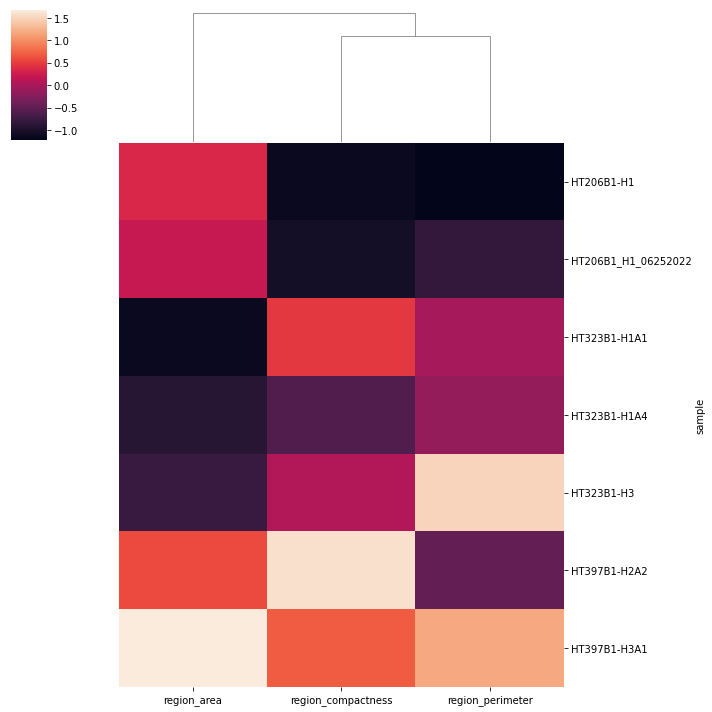

In [20]:
import seaborn as sns
sns.clustermap(df, row_cluster=False, z_score=True)

In [21]:
# for s, img in sample_to_img.items():
#     plt.imshow(img)
#     plt.title(s)
#     plt.show()

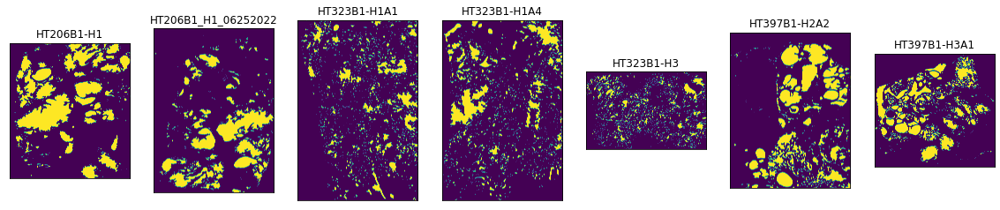

In [22]:
fig, axs = plt.subplots(nrows=1, ncols=len(sample_to_imgs), figsize=(20, 10))
for (s, d), ax in zip(sample_to_imgs.items(), axs):
    img = d['region']['mask']
    ax.imshow(img)
    ax.set_title(s)
    ax.set_xticks([])
    ax.set_yticks([])

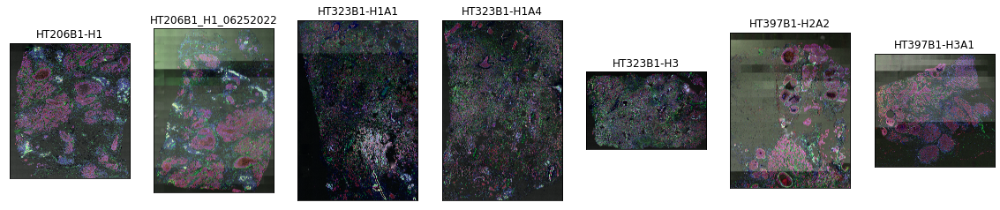

In [23]:
fig, axs = plt.subplots(nrows=1, ncols=len(sample_to_imgs), figsize=(20, 10))
for (s, d), ax in zip(sample_to_pseudo.items(), axs):
    ax.imshow(d)
    ax.set_title(s)
    ax.set_xticks([])
    ax.set_yticks([])

In [24]:
list(reduced.columns)

['boundary_cell_type_CD4 T cell_cell_fraction',
 'boundary_cell_type_CD8 T cell_cell_fraction',
 'boundary_cell_type_Endothelial_cell_fraction',
 'boundary_cell_type_Fibroblast_cell_fraction',
 'boundary_cell_type_Macrophage - M1_cell_fraction',
 'boundary_cell_type_Macrophage - M2_cell_fraction',
 'boundary_cell_type_Myoepithelial_cell_fraction',
 'boundary_cell_type_Noise_cell_fraction',
 'boundary_cell_type_Tumor_cell_fraction',
 'boundary_compactness',
 'boundary_eccentricity',
 'boundary_extent',
 'boundary_intensity_overlap_E-cadherin_Ki67',
 'boundary_intensity_overlap_E-cadherin_MGP',
 'boundary_intensity_overlap_E-cadherin_Pan-CK',
 'boundary_intensity_overlap_E-cadherin_Podoplanin',
 'boundary_intensity_overlap_E-cadherin_SMA',
 'boundary_intensity_overlap_Ki67_MGP',
 'boundary_intensity_overlap_Ki67_Pan-CK',
 'boundary_intensity_overlap_Ki67_Podoplanin',
 'boundary_intensity_overlap_Ki67_SMA',
 'boundary_intensity_overlap_MGP_Pan-CK',
 'boundary_intensity_overlap_MGP_Podopla

In [25]:
myoepi = [
    'region_grid_metrics_Podoplanin_integrity',
    'region_grid_metrics_Podoplanin_mean_thickness_nonbreaks',
    'region_grid_metrics_SMA_integrity',
    'region_grid_metrics_SMA_mean_thickness_nonbreaks',
    'myoepi_intensity_overlap_Pan-CK_SMA',
    'myoepi_intensity_overlap_Podoplanin_SMA',
    'myoepi_intensity_overlap_E-cadherin_SMA'
]
df = reduced[myoepi]
df

,region_grid_metrics_Podoplanin_integrity,region_grid_metrics_Podoplanin_mean_thickness_nonbreaks,region_grid_metrics_SMA_integrity,region_grid_metrics_SMA_mean_thickness_nonbreaks,myoepi_intensity_overlap_Pan-CK_SMA,myoepi_intensity_overlap_Podoplanin_SMA,myoepi_intensity_overlap_E-cadherin_SMA
sample,,,,,,,
HT206B1-H1,0.265894,2.480677,0.604108,3.479979,0.026715,0.060197,0.015008
HT206B1_H1_06252022,0.805402,5.876529,0.508932,3.082285,0.016344,0.101481,0.040927
HT323B1-H1A1,0.172860,1.268315,0.492996,2.291495,0.018523,0.026085,0.025692
HT323B1-H1A4,0.164215,1.195330,0.560537,2.462346,0.019401,0.028863,0.021014
HT323B1-H3,0.251204,1.545614,0.642086,3.098374,0.022890,0.050695,0.049215
HT397B1-H2A2,0.216920,1.923245,0.526359,3.383060,0.064697,0.044179,0.028784
HT397B1-H3A1,0.182541,1.332640,0.345863,1.773610,0.022509,0.019439,0.012997


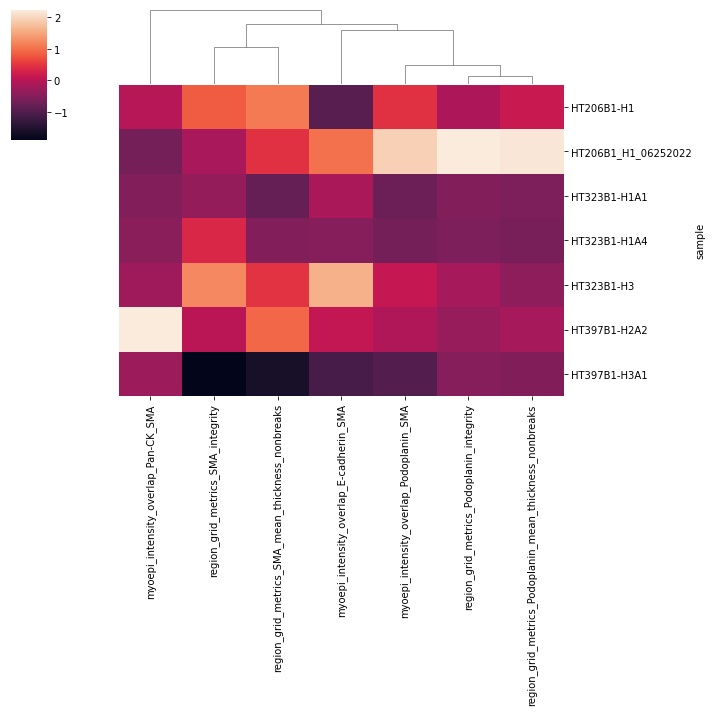

In [26]:
sns.clustermap(df, row_cluster=False, z_score=True)

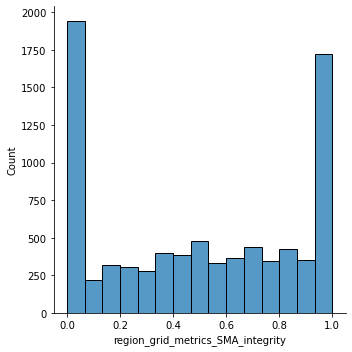

In [27]:
sns.displot(combined['region_grid_metrics_SMA_integrity'])

In [20]:
region_to_bbox = {reg:(r1, c1, r2, c2) for reg, r1, c1, r2, c2 in zip(
                    combined.index.to_list(),
                    combined['boundary_bbox-0'], combined['boundary_bbox-1'],
                    combined['boundary_bbox-2'], combined['boundary_bbox-3'])}

In [29]:
sample_to_imgs.keys()

dict_keys(['HT206B1-H1', 'HT206B1_H1_06252022', 'HT323B1-H1A1', 'HT323B1-H1A4', 'HT323B1-H3', 'HT397B1-H2A2', 'HT397B1-H3A1'])

In [231]:
def get_display_image(s, labeled, region_to_bbox,
                      color='region_grid_metrics_SMA_integrity', cmap='viridis', df=None):
    if df is None:
        df = combined

    f = df[df['sample']==s]
    f.index = [x.split('_')[-1] for x in f.index]
    rbbox = {reg.split('_')[-1]:tup for reg, tup in region_to_bbox.items() if s in reg}
    region_to_val = {reg:v
                     for reg, v in zip(f.index, f[color])}
    if region_to_val:
        rgba = display_region(labeled, region_to_val, rbbox, cmap=cmap)
    else:
        rgba = np.ones((labeled.shape[0], labeled.shape[1], 4))
    return rgba

###### sanity checking

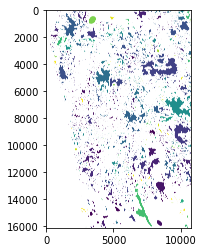

In [33]:
s = 'HT323B1-H1A1'
labeled = sample_to_imgs[s]['region']['labeled']
rgba = get_display_image(s, labeled)
plt.imshow(rgba)

In [34]:
plt.imsave('/diskmnt/Projects/Users/estorrs/sandbox/ht323b1_h1a1_reg.png', rgba)

In [35]:
tifffile.imsave('/diskmnt/Projects/Users/estorrs/sandbox/ht323b1_h1a1_myo.tif', sample_to_imgs[s]['myoepi']['mask'])

In [ ]:
'/diskmnt/Projects/Users/estorrs/multiplex_data/analysis/brca_dcis_v1/preprocessing/htan/region_mask_filled/HT323B1-H1A1.tif'


In [213]:
sample_to_grid_imgs[s][1].keys()

dict_keys(['grid_binary_positive_regions', 'grid_labeled_regions_filtered', 'grid_labeled_regions_unfiltered'])

In [214]:
f = combined[combined['sample']==s]
tups = list(zip(f.index, f['region_area']))
tups = sorted(tups, key=lambda x: x[1], reverse=True)
tups

[('HT206B1-H1_253', 13827903),
 ('HT206B1-H1_2', 6265285),
 ('HT206B1-H1_81', 5730764),
 ('HT206B1-H1_202', 5395314),
 ('HT206B1-H1_79', 2837125),
 ('HT206B1-H1_208', 2623824),
 ('HT206B1-H1_137', 2117212),
 ('HT206B1-H1_529', 2099040),
 ('HT206B1-H1_584', 1872288),
 ('HT206B1-H1_7', 1247888),
 ('HT206B1-H1_55', 1227749),
 ('HT206B1-H1_437', 1095701),
 ('HT206B1-H1_344', 1062479),
 ('HT206B1-H1_496', 768382),
 ('HT206B1-H1_465', 712820),
 ('HT206B1-H1_386', 652111),
 ('HT206B1-H1_364', 649423),
 ('HT206B1-H1_147', 520079),
 ('HT206B1-H1_321', 458314),
 ('HT206B1-H1_468', 443032),
 ('HT206B1-H1_243', 407651),
 ('HT206B1-H1_111', 389332),
 ('HT206B1-H1_490', 360083),
 ('HT206B1-H1_82', 326673),
 ('HT206B1-H1_431', 280261),
 ('HT206B1-H1_5', 219237),
 ('HT206B1-H1_1', 215297),
 ('HT206B1-H1_163', 197387),
 ('HT206B1-H1_378', 176795),
 ('HT206B1-H1_366', 155952),
 ('HT206B1-H1_38', 125831),
 ('HT206B1-H1_326', 116538),
 ('HT206B1-H1_467', 105593),
 ('HT206B1-H1_60', 103366),
 ('HT206B1-H1_

In [228]:
r = 526
r = 253

In [216]:
combined.loc[f'{s}_{r}']

boundary_area                                                              3300563
boundary_bbox-0                                                               5373
boundary_bbox-1                                                                325
boundary_bbox-2                                                              10115
boundary_bbox-3                                                               7016
                                                                          ...     
region_metacluster_Tumor Boundary - Stroma Enriched 1_cell_fraction       0.025555
region_metacluster_Tumor Boundary - Stroma Enriched 2_cell_fraction        0.00834
region_metacluster_Tumor_cell_fraction                                    0.955442
region_perimeter                                                       44199.95718
sample                                                                  HT206B1-H1
Name: HT206B1-H1_253, Length: 271, dtype: object

In [217]:
list(zip(combined.columns, combined.loc[f'{s}_{r}']))

[('boundary_area', 3300563),
 ('boundary_bbox-0', 5373),
 ('boundary_bbox-1', 325),
 ('boundary_bbox-2', 10115),
 ('boundary_bbox-3', 7016),
 ('boundary_cell_type_CD4 T cell_cell_fraction', 0.0356321839080459),
 ('boundary_cell_type_CD8 T cell_cell_fraction', 0.0528735632183908),
 ('boundary_cell_type_Endothelial_cell_fraction', 0.1413793103448276),
 ('boundary_cell_type_Fibroblast_cell_fraction', 0.3488505747126437),
 ('boundary_cell_type_Macrophage - M1_cell_fraction', 0.1241379310344827),
 ('boundary_cell_type_Macrophage - M2_cell_fraction', 0.0310344827586206),
 ('boundary_cell_type_Myoepithelial_cell_fraction', 0.0241379310344827),
 ('boundary_cell_type_Noise_cell_fraction', 0.0212643678160919),
 ('boundary_cell_type_Tumor_cell_fraction', 0.2201149425287356),
 ('boundary_centroid-0', 7940.742398796811),
 ('boundary_centroid-1', 4109.774951121975),
 ('boundary_compactness', 0.0075753400499138),
 ('boundary_eccentricity', 0.8316635759197438),
 ('boundary_extent', 0.1040244545620211)

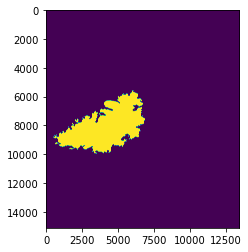

In [218]:
plt.imshow(sample_to_imgs[s]['region']['labeled']==r)

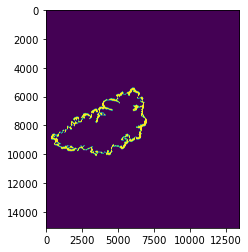

In [219]:
plt.imshow(sample_to_imgs[s]['boundary']['labeled']==r)

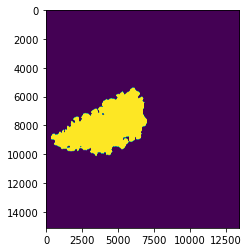

In [220]:
plt.imshow(sample_to_imgs[s]['expanded']['labeled']==r)

In [221]:
sample_to_imgs[s]['expanded']['labeled']==r

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

In [222]:
from skimage.measure import regionprops
from skimage.morphology import label
regions = regionprops(label(sample_to_imgs[s]['expanded']['labeled']==r))

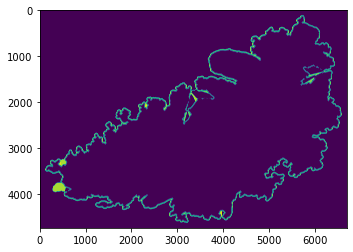

In [223]:
d = sample_to_grid_imgs[s][r]
plt.imshow(d['grid_labeled_regions_filtered'])

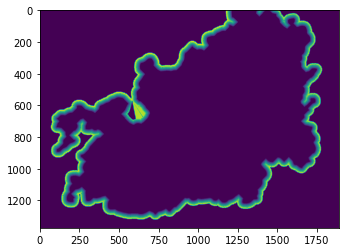

In [224]:
d = sample_to_grid_imgs[s][7]
plt.imshow(d['grid_labeled_regions_filtered'])

In [225]:
tups = []
for r, d in sample_to_polys[s].items():
    rings = d['polygons_filtered']['rings']
    rings = [p for p in loads(rings) if p.is_valid]
    tups.append((r, rings[0].length))
sorted(tups, key=lambda x: x[1], reverse=True)
    

[('81', 62018.0),
 ('2', 56214.0),
 ('253', 55338.0),
 ('202', 26708.0),
 ('79', 25130.0),
 ('208', 21002.0),
 ('529', 20740.0),
 ('55', 15862.0),
 ('584', 12134.0),
 ('344', 11842.0),
 ('7', 10274.0),
 ('468', 8246.0),
 ('137', 7446.0),
 ('147', 7446.0),
 ('490', 7422.0),
 ('386', 7376.0),
 ('437', 6988.0),
 ('465', 5970.0),
 ('243', 5814.0),
 ('496', 5812.0),
 ('5', 4846.0),
 ('111', 4836.0),
 ('364', 4734.0),
 ('82', 4168.0),
 ('60', 4140.0),
 ('321', 4138.0),
 ('38', 3734.0),
 ('431', 3650.0),
 ('163', 3600.0),
 ('1', 3578.0),
 ('218', 3416.0),
 ('583', 3320.0),
 ('59', 2422.0),
 ('188', 2386.0),
 ('366', 2204.0),
 ('581', 2182.0),
 ('378', 2098.0),
 ('198', 2064.0),
 ('579', 2060.0),
 ('467', 2030.0),
 ('544', 2004.0),
 ('181', 1920.0),
 ('560', 1916.0),
 ('326', 1846.0),
 ('571', 1790.0),
 ('512', 1750.0),
 ('328', 1728.0),
 ('141', 1652.0),
 ('123', 1616.0),
 ('289', 1604.0),
 ('167', 1592.0),
 ('435', 1584.0),
 ('238', 1526.0),
 ('191', 1510.0),
 ('203', 1506.0),
 ('173', 1474.

In [229]:
d = sample_to_polys[s][str(r)]['polygons_filtered']
d.keys()

dict_keys(['polys', 'group_lines', 'rings'])

In [ ]:
from shapely.wkt import dumps, loads
polys = [p for p in loads(d['polys']) if p.is_valid]
shapely.GeometryCollection(polys)

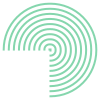

In [141]:
polys = [p for p in loads(d['rings']) if p.is_valid]
shapely.GeometryCollection(polys)

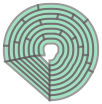

In [125]:
shapely.GeometryCollection(polys)

###### analysis

In [217]:
from skimage.transform import rescale, resize

In [222]:
# make thumbnails so it doesn't take so long to plot
for s in sample_to_imgs.keys():
    print(s)
    for name in sample_to_imgs[s].keys():
        for k in list(sample_to_imgs[s][name].keys()):
            if name=='region':
                img = sample_to_imgs[s][name][k]
                rescaled = rescale(img, .1, preserve_range=True).round().astype(np.int32)
                sample_to_imgs[s][name][f'{k}_thumbnail'] = rescaled


HT206B1-H1
HT206B1_H1_06252022
HT323B1-H1A1
HT323B1-H1A4
HT323B1-H3
HT397B1-H2A2
HT397B1-H3A1


In [223]:
sample_to_imgs['HT206B1-H1']['region'].keys()

dict_keys(['labeled', 'mask', 'labeled_thumbnail', 'mask_thumbnail'])

In [224]:
region_to_bbox_thumbnail = {k:(int(r1 * .1), int(c1 * .1), int(r2 * .1), int(c2 * .1))
                           for k, (r1, c1, r2, c2) in region_to_bbox.items()}

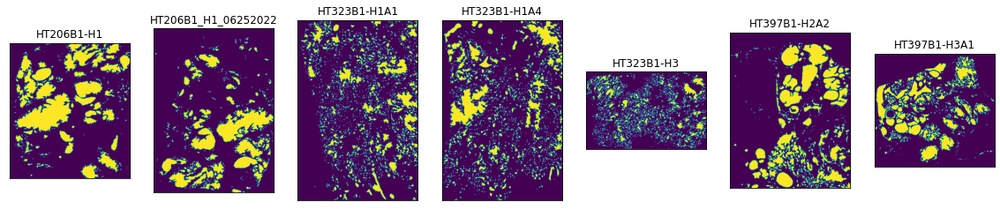

In [34]:
fig, axs = plt.subplots(nrows=1, ncols=len(sample_to_imgs), figsize=(20, 10))
for (s, d), ax in zip(sample_to_imgs.items(), axs):
    labeled = sample_to_imgs[s]['region']['labeled_thumbnail']
    ax.imshow(labeled>0)
    ax.set_title(s)
    ax.set_xticks([])
    ax.set_yticks([])

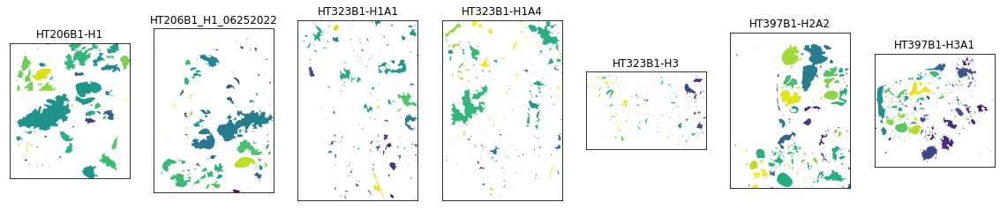

In [35]:
fig, axs = plt.subplots(nrows=1, ncols=len(sample_to_imgs), figsize=(20, 10))
for (s, d), ax in zip(sample_to_imgs.items(), axs):
    labeled = sample_to_imgs[s]['region']['labeled_thumbnail']
    img = get_display_image(s, labeled, region_to_bbox_thumbnail, color='region_grid_metrics_SMA_integrity')
    ax.imshow(img)
    ax.set_title(s)
    ax.set_xticks([])
    ax.set_yticks([])

(array([0, 1, 2, 3, 4, 5, 6]),
 [Text(0, 0, 'HT206B1-H1'),
  Text(1, 0, 'HT206B1_H1_06252022'),
  Text(2, 0, 'HT323B1-H1A1'),
  Text(3, 0, 'HT323B1-H1A4'),
  Text(4, 0, 'HT323B1-H3'),
  Text(5, 0, 'HT397B1-H2A2'),
  Text(6, 0, 'HT397B1-H3A1')])

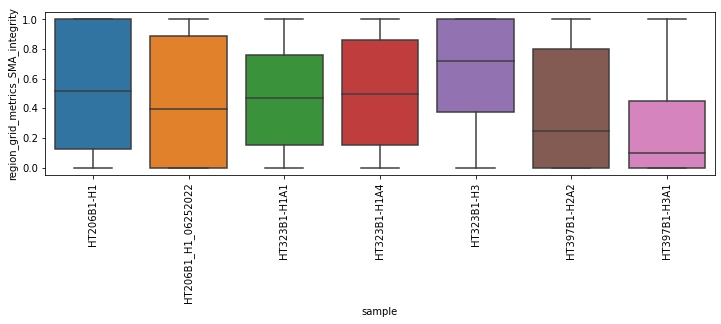

In [36]:
fig, axs = plt.subplots(figsize=(12, 3))
sns.boxplot(data=combined, x='sample', y='region_grid_metrics_SMA_integrity')
plt.xticks(rotation=90)

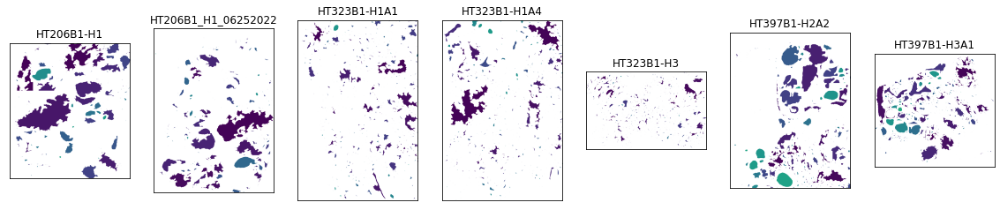

In [37]:
fig, axs = plt.subplots(nrows=1, ncols=len(sample_to_imgs), figsize=(20, 10))
for (s, d), ax in zip(sample_to_imgs.items(), axs):
    labeled = sample_to_imgs[s]['region']['labeled_thumbnail']
    img = get_display_image(s, labeled, region_to_bbox_thumbnail, color='region_compactness')
    ax.imshow(img)
    ax.set_title(s)
    ax.set_xticks([])
    ax.set_yticks([])

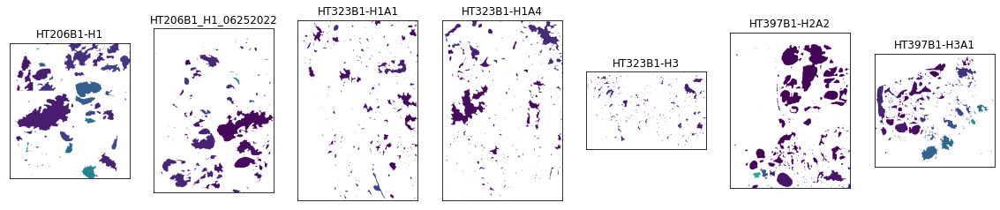

In [38]:
fig, axs = plt.subplots(nrows=1, ncols=len(sample_to_imgs), figsize=(20, 10))
for (s, d), ax in zip(sample_to_imgs.items(), axs):
    labeled = sample_to_imgs[s]['region']['labeled_thumbnail']
    img = get_display_image(s, labeled, region_to_bbox_thumbnail, color='boundary_cell_type_CD4 T cell_cell_fraction')
    ax.imshow(img)
    ax.set_title(s)
    ax.set_xticks([])
    ax.set_yticks([])

In [40]:
combined.shape

(8353, 271)

In [41]:
f = combined[combined['region_area']>50000]
f.shape

(515, 271)

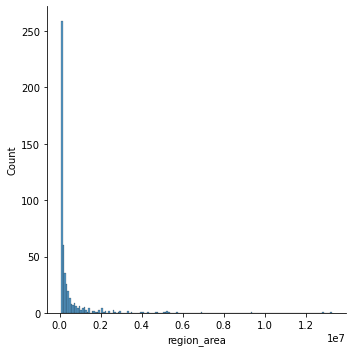

In [42]:
sns.displot(f['region_area'])

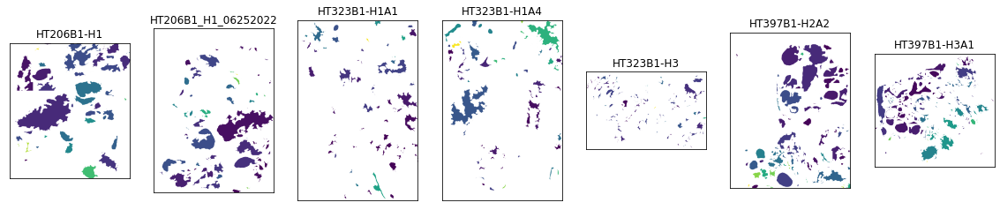

In [43]:
fig, axs = plt.subplots(nrows=1, ncols=len(sample_to_imgs), figsize=(20, 10))
for (s, d), ax in zip(sample_to_imgs.items(), axs):
    labeled = sample_to_imgs[s]['region']['labeled_thumbnail']
    img = get_display_image(s, labeled, region_to_bbox_thumbnail,
                            color='boundary_cell_type_CD8 T cell_cell_fraction', df=f)
    ax.imshow(img)
    ax.set_title(s)
    ax.set_xticks([])
    ax.set_yticks([])

(array([0, 1, 2, 3, 4, 5, 6]),
 [Text(0, 0, 'HT206B1-H1'),
  Text(1, 0, 'HT206B1_H1_06252022'),
  Text(2, 0, 'HT323B1-H1A1'),
  Text(3, 0, 'HT323B1-H1A4'),
  Text(4, 0, 'HT323B1-H3'),
  Text(5, 0, 'HT397B1-H2A2'),
  Text(6, 0, 'HT397B1-H3A1')])

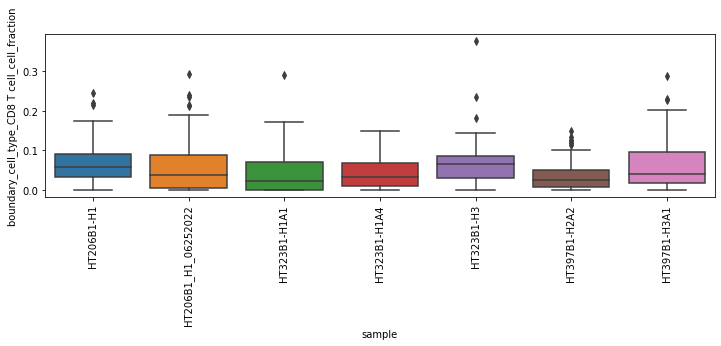

In [44]:
fig, axs = plt.subplots(figsize=(12, 3))
sns.boxplot(data=f, x='sample', y='boundary_cell_type_CD8 T cell_cell_fraction')
plt.xticks(rotation=90)

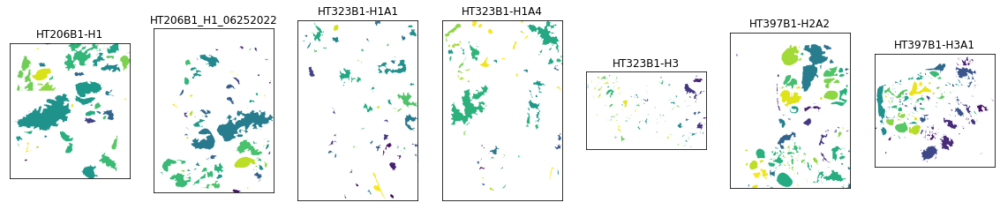

In [45]:
fig, axs = plt.subplots(nrows=1, ncols=len(sample_to_imgs), figsize=(20, 10))
for (s, d), ax in zip(sample_to_imgs.items(), axs):
    labeled = sample_to_imgs[s]['region']['labeled_thumbnail']
    img = get_display_image(s, labeled, region_to_bbox_thumbnail,
                            color='region_grid_metrics_SMA_integrity', df=f)
    ax.imshow(img)
    ax.set_title(s)
    ax.set_xticks([])
    ax.set_yticks([])

(array([0, 1, 2, 3, 4, 5, 6]),
 [Text(0, 0, 'HT206B1-H1'),
  Text(1, 0, 'HT206B1_H1_06252022'),
  Text(2, 0, 'HT323B1-H1A1'),
  Text(3, 0, 'HT323B1-H1A4'),
  Text(4, 0, 'HT323B1-H3'),
  Text(5, 0, 'HT397B1-H2A2'),
  Text(6, 0, 'HT397B1-H3A1')])

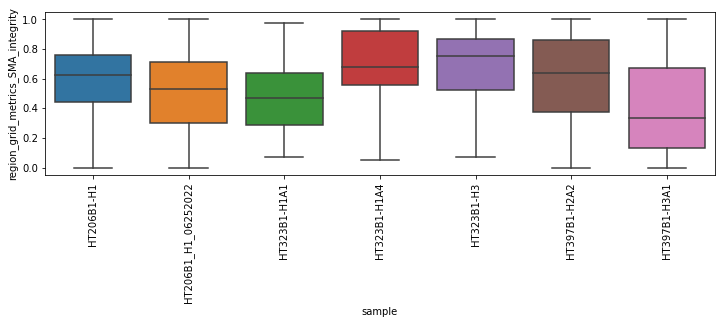

In [46]:
fig, axs = plt.subplots(figsize=(12, 3))
sns.boxplot(data=f, x='sample', y='region_grid_metrics_SMA_integrity')
plt.xticks(rotation=90)

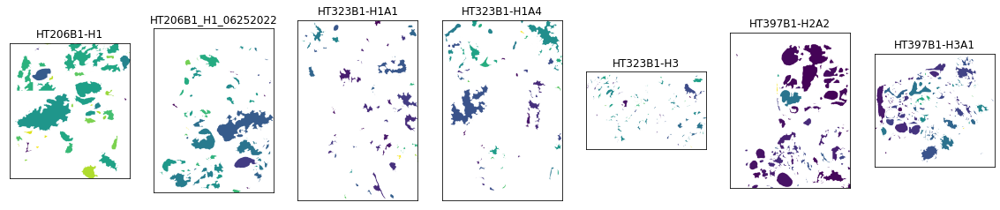

In [47]:
fig, axs = plt.subplots(nrows=1, ncols=len(sample_to_imgs), figsize=(20, 10))
for (s, d), ax in zip(sample_to_imgs.items(), axs):
    labeled = sample_to_imgs[s]['region']['labeled_thumbnail']
    img = get_display_image(s, labeled, region_to_bbox_thumbnail,
                            color='region_intensity_positive_fraction_Ki67', df=f)
    ax.imshow(img)
    ax.set_title(s)
    ax.set_xticks([])
    ax.set_yticks([])

(array([0, 1, 2, 3, 4, 5, 6]),
 [Text(0, 0, 'HT206B1-H1'),
  Text(1, 0, 'HT206B1_H1_06252022'),
  Text(2, 0, 'HT323B1-H1A1'),
  Text(3, 0, 'HT323B1-H1A4'),
  Text(4, 0, 'HT323B1-H3'),
  Text(5, 0, 'HT397B1-H2A2'),
  Text(6, 0, 'HT397B1-H3A1')])

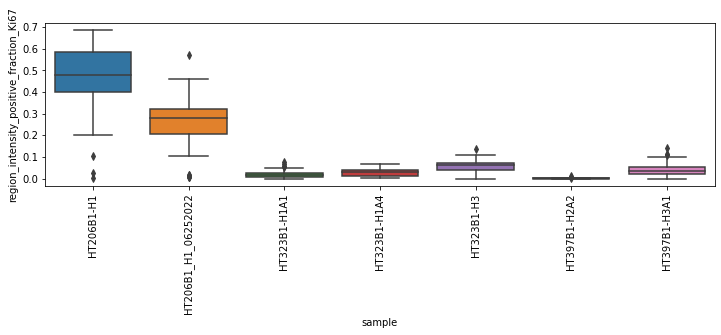

In [48]:
fig, axs = plt.subplots(figsize=(12, 3))
sns.boxplot(data=f, x='sample', y='region_intensity_positive_fraction_Ki67')
plt.xticks(rotation=90)

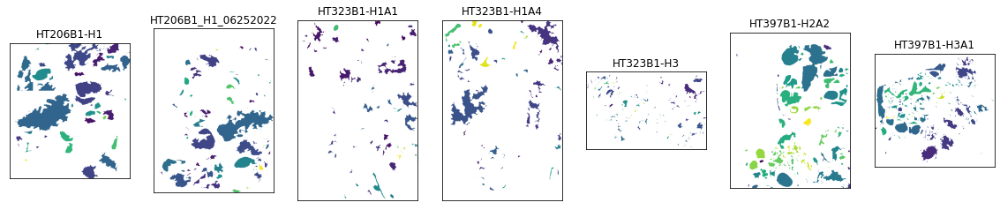

In [49]:
fig, axs = plt.subplots(nrows=1, ncols=len(sample_to_imgs), figsize=(20, 10))
for (s, d), ax in zip(sample_to_imgs.items(), axs):
    labeled = sample_to_imgs[s]['region']['labeled_thumbnail']
    img = get_display_image(s, labeled, region_to_bbox_thumbnail,
                            color='region_intensity_positive_fraction_MGP', df=f)
    ax.imshow(img)
    ax.set_title(s)
    ax.set_xticks([])
    ax.set_yticks([])

(array([0, 1, 2, 3, 4, 5, 6]),
 [Text(0, 0, 'HT206B1-H1'),
  Text(1, 0, 'HT206B1_H1_06252022'),
  Text(2, 0, 'HT323B1-H1A1'),
  Text(3, 0, 'HT323B1-H1A4'),
  Text(4, 0, 'HT323B1-H3'),
  Text(5, 0, 'HT397B1-H2A2'),
  Text(6, 0, 'HT397B1-H3A1')])

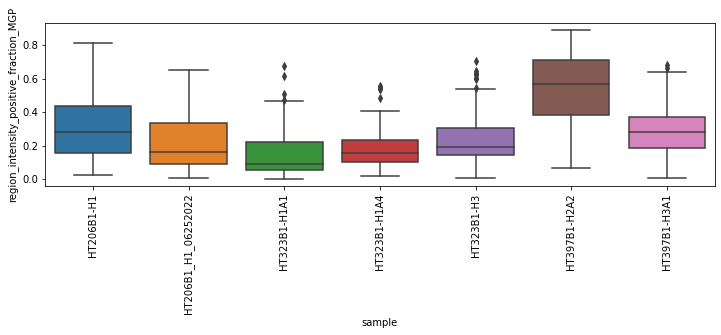

In [50]:
fig, axs = plt.subplots(figsize=(12, 3))
sns.boxplot(data=f, x='sample', y='region_intensity_positive_fraction_MGP')
plt.xticks(rotation=90)

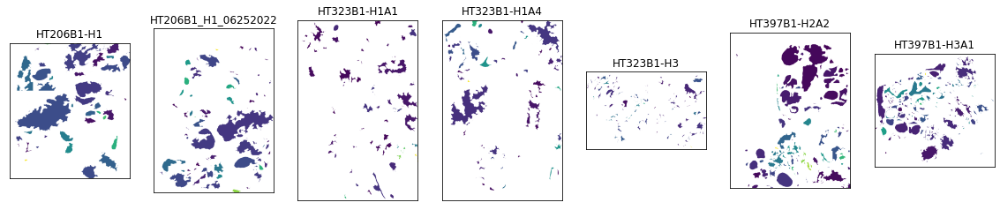

In [51]:
fig, axs = plt.subplots(nrows=1, ncols=len(sample_to_imgs), figsize=(20, 10))
for (s, d), ax in zip(sample_to_imgs.items(), axs):
    labeled = sample_to_imgs[s]['region']['labeled_thumbnail']
    img = get_display_image(s, labeled, region_to_bbox_thumbnail,
                            color='region_intensity_overlap_Ki67_MGP', df=f)
    ax.imshow(img)
    ax.set_title(s)
    ax.set_xticks([])
    ax.set_yticks([])

(array([0, 1, 2, 3, 4, 5, 6]),
 [Text(0, 0, 'HT206B1-H1'),
  Text(1, 0, 'HT206B1_H1_06252022'),
  Text(2, 0, 'HT323B1-H1A1'),
  Text(3, 0, 'HT323B1-H1A4'),
  Text(4, 0, 'HT323B1-H3'),
  Text(5, 0, 'HT397B1-H2A2'),
  Text(6, 0, 'HT397B1-H3A1')])

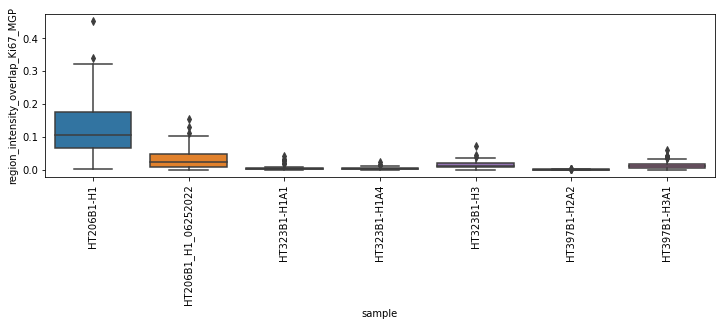

In [52]:
fig, axs = plt.subplots(figsize=(12, 3))
sns.boxplot(data=f, x='sample', y='region_intensity_overlap_Ki67_MGP')
plt.xticks(rotation=90)

<AxesSubplot:xlabel='region_intensity_positive_fraction_MGP', ylabel='region_grid_metrics_SMA_integrity'>

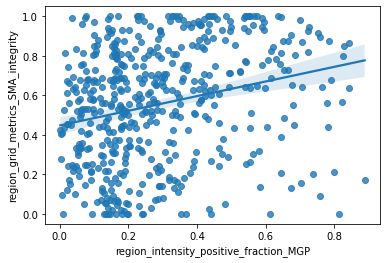

In [53]:
sns.regplot(data=f, x='region_intensity_positive_fraction_MGP', y='region_grid_metrics_SMA_integrity')

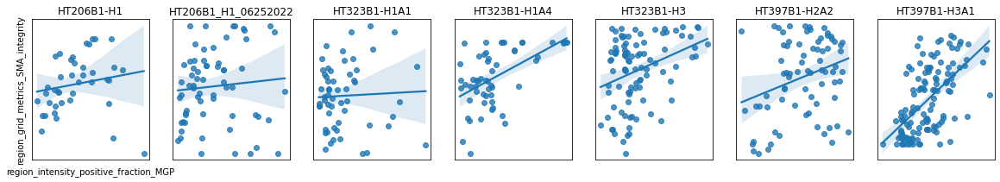

In [54]:
fig, axs = plt.subplots(nrows=1, ncols=len(sample_to_imgs), figsize=(20, 3))
for i, (s, ax) in enumerate(zip(sample_to_imgs, axs)):
    fs = f[f['sample']==s]
    sns.regplot(data=fs, x='region_intensity_positive_fraction_MGP', y='region_grid_metrics_SMA_integrity', ax=ax)
    ax.set_title(s)
    
    ax.set_xticks([])
    ax.set_yticks([])
    if i != 0:
        ax.set_ylabel('')
        ax.set_xlabel('')

<AxesSubplot:xlabel='region_intensity_positive_fraction_MGP', ylabel='region_compactness'>

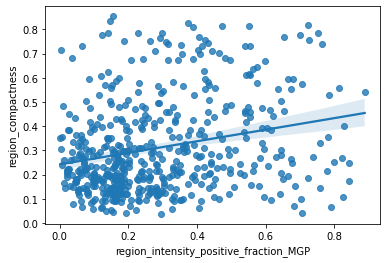

In [55]:
sns.regplot(data=f, x='region_intensity_positive_fraction_MGP', y='region_compactness')

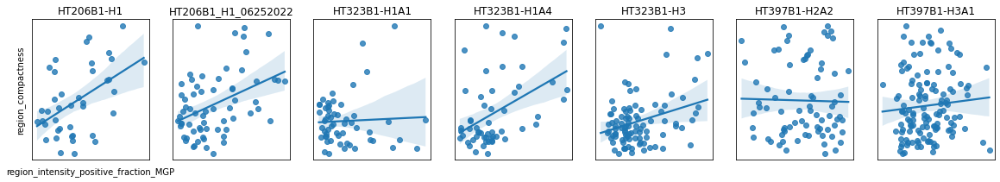

In [56]:
fig, axs = plt.subplots(nrows=1, ncols=len(sample_to_imgs), figsize=(20, 3))
for i, (s, ax) in enumerate(zip(sample_to_imgs, axs)):
    fs = f[f['sample']==s]
    sns.regplot(data=fs, x='region_intensity_positive_fraction_MGP', y='region_compactness', ax=ax)
    ax.set_title(s)
    
    ax.set_xticks([])
    ax.set_yticks([])
    if i != 0:
        ax.set_ylabel('')
        ax.set_xlabel('')

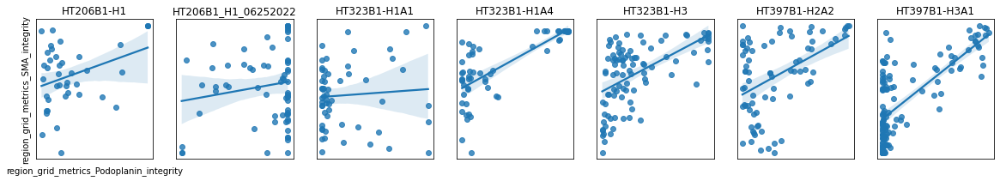

In [57]:
fig, axs = plt.subplots(nrows=1, ncols=len(sample_to_imgs), figsize=(20, 3))
for i, (s, ax) in enumerate(zip(sample_to_imgs, axs)):
    fs = f[f['sample']==s]
    sns.regplot(data=fs, x='region_grid_metrics_Podoplanin_integrity', y='region_grid_metrics_SMA_integrity', ax=ax)
    ax.set_title(s)
    
    ax.set_xticks([])
    ax.set_yticks([])
    if i != 0:
        ax.set_ylabel('')
        ax.set_xlabel('')

###### region vis

In [57]:
sample_to_imgs.keys()

dict_keys(['HT206B1-H1', 'HT206B1_H1_06252022', 'HT323B1-H1A1', 'HT323B1-H1A4', 'HT323B1-H3', 'HT397B1-H2A2', 'HT397B1-H3A1'])

In [58]:
sid = 'HT323B1-H1A1'

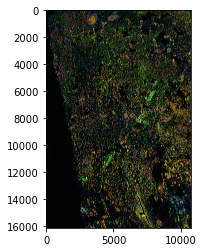

In [59]:
plt.imshow(sample_to_pseudo[sid])

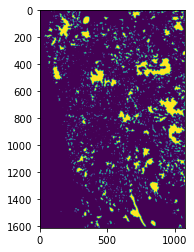

In [60]:
plt.imshow(sample_to_imgs[sid]['region']['mask_thumbnail'])

In [61]:
f = combined[combined['sample']==sid]
f

,boundary_area,boundary_bbox-0,boundary_bbox-1,boundary_bbox-2,boundary_bbox-3,boundary_cell_type_CD4 T cell_cell_fraction,boundary_cell_type_CD8 T cell_cell_fraction,boundary_cell_type_Endothelial_cell_fraction,boundary_cell_type_Fibroblast_cell_fraction,boundary_cell_type_Macrophage - M1_cell_fraction,...,region_metacluster_Stroma_cell_fraction,region_metacluster_T cell Enriched_cell_fraction,region_metacluster_Tumor Boundary - M2 Macrophage Enriched_cell_fraction,region_metacluster_Tumor Boundary - Mixed Immune Enriched_cell_fraction,region_metacluster_Tumor Boundary - Mixed_cell_fraction,region_metacluster_Tumor Boundary - Stroma Enriched 1_cell_fraction,region_metacluster_Tumor Boundary - Stroma Enriched 2_cell_fraction,region_metacluster_Tumor_cell_fraction,region_perimeter,sample
HT323B1-H1A1_1,27292,0,911,135,1234,0.057143,0.485714,0.057143,0.200000,0.085714,...,0.0,0.0,0.0,0.833333,0.00,0.0,0.0,0.0,204.752309,HT323B1-H1A1
HT323B1-H1A1_2,40833,0,1652,200,1949,0.000000,0.057143,0.085714,0.400000,0.114286,...,0.0,0.0,0.0,0.000000,0.40,0.0,0.0,0.4,226.575685,HT323B1-H1A1
HT323B1-H1A1_3,5204,0,1881,78,2009,0.000000,0.166667,0.000000,0.166667,0.000000,...,0.0,0.0,0.0,0.000000,0.00,0.0,0.0,0.0,55.698485,HT323B1-H1A1
HT323B1-H1A1_4,19147,0,2243,136,2529,0.000000,0.333333,0.000000,0.380952,0.047619,...,0.0,0.0,0.0,0.000000,0.75,0.0,0.0,0.0,336.090404,HT323B1-H1A1
HT323B1-H1A1_5,18648,0,6382,98,6609,0.000000,0.142857,0.000000,0.071429,0.500000,...,0.0,0.0,0.5,0.000000,0.00,0.0,0.0,0.0,205.823376,HT323B1-H1A1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HT323B1-H1A1_1943,105757,15698,3391,16128,3725,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.000000,0.00,0.0,0.0,0.0,540.825469,HT323B1-H1A1
HT323B1-H1A1_1944,140798,15716,10137,16128,10645,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.000000,0.00,0.0,0.0,0.0,1054.756493,HT323B1-H1A1
HT323B1-H1A1_1945,23782,15815,3876,16040,4080,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.000000,0.00,0.0,0.0,0.0,32.627417,HT323B1-H1A1
HT323B1-H1A1_1946,41058,15891,3925,16128,4213,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.000000,0.00,0.0,0.0,0.0,267.622366,HT323B1-H1A1


In [62]:
f = f[f['region_area']>100000]
f

,boundary_area,boundary_bbox-0,boundary_bbox-1,boundary_bbox-2,boundary_bbox-3,boundary_cell_type_CD4 T cell_cell_fraction,boundary_cell_type_CD8 T cell_cell_fraction,boundary_cell_type_Endothelial_cell_fraction,boundary_cell_type_Fibroblast_cell_fraction,boundary_cell_type_Macrophage - M1_cell_fraction,...,region_metacluster_Stroma_cell_fraction,region_metacluster_T cell Enriched_cell_fraction,region_metacluster_Tumor Boundary - M2 Macrophage Enriched_cell_fraction,region_metacluster_Tumor Boundary - Mixed Immune Enriched_cell_fraction,region_metacluster_Tumor Boundary - Mixed_cell_fraction,region_metacluster_Tumor Boundary - Stroma Enriched 1_cell_fraction,region_metacluster_Tumor Boundary - Stroma Enriched 2_cell_fraction,region_metacluster_Tumor_cell_fraction,region_perimeter,sample
HT323B1-H1A1_26,265152,0,6650,713,7575,0.000000,0.145455,0.036364,0.400000,0.090909,...,0.142857,0.000000,0.071429,0.214286,0.000000,0.000000,0.071429,0.285714,2502.321210,HT323B1-H1A1
HT323B1-H1A1_47,860109,91,1008,2275,2622,0.014184,0.102837,0.040780,0.340426,0.054965,...,0.000000,0.000000,0.089226,0.013468,0.149832,0.062290,0.287879,0.351852,10943.169542,HT323B1-H1A1
HT323B1-H1A1_75,271345,308,3097,1179,3846,0.071090,0.071090,0.037915,0.213270,0.227488,...,0.000000,0.000000,0.066225,0.006623,0.000000,0.000000,0.000000,0.748344,1822.427632,HT323B1-H1A1
HT323B1-H1A1_77,125057,382,9663,865,10376,0.000000,0.058824,0.094118,0.282353,0.011765,...,0.000000,0.000000,0.000000,0.000000,0.092308,0.015385,0.261538,0.615385,1844.123159,HT323B1-H1A1
HT323B1-H1A1_105,310005,747,9728,1650,10752,0.000000,0.017143,0.034286,0.388571,0.074286,...,0.000000,0.000000,0.000000,0.000000,0.111732,0.033520,0.541899,0.217877,3465.878785,HT323B1-H1A1
HT323B1-H1A1_163,367471,1253,2880,2178,3894,0.022472,0.078652,0.022472,0.370787,0.089888,...,0.000000,0.000000,0.062500,0.015625,0.046875,0.039062,0.156250,0.367188,3314.013778,HT323B1-H1A1
HT323B1-H1A1_177,223942,1279,8983,1999,9809,0.016949,0.169492,0.033898,0.288136,0.220339,...,0.000000,0.000000,0.363636,0.136364,0.045455,0.000000,0.272727,0.136364,2254.005410,HT323B1-H1A1
HT323B1-H1A1_254,207595,1856,663,2759,1300,0.000000,0.020548,0.075342,0.438356,0.034247,...,0.000000,0.000000,0.000000,0.000000,0.063830,0.117021,0.148936,0.531915,2640.502018,HT323B1-H1A1
HT323B1-H1A1_526,1376175,3405,6835,5194,9941,0.044444,0.058730,0.030159,0.363492,0.057143,...,0.012009,0.004367,0.055677,0.004367,0.213974,0.030568,0.407205,0.215066,17323.893491,HT323B1-H1A1
HT323B1-H1A1_529,155026,3437,8170,4060,8938,0.035294,0.094118,0.023529,0.211765,0.058824,...,0.014286,0.057143,0.100000,0.014286,0.300000,0.000000,0.257143,0.157143,2040.438959,HT323B1-H1A1


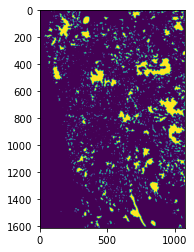

In [63]:
plt.imshow(sample_to_imgs[sid]['region']['mask_thumbnail'])

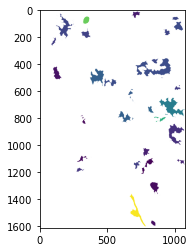

In [64]:
labeled = sample_to_imgs[sid]['region']['labeled_thumbnail']
img = get_display_image(sid, labeled, region_to_bbox_thumbnail,
                        color='region_grid_metrics_SMA_integrity', df=f)
plt.imshow(img)


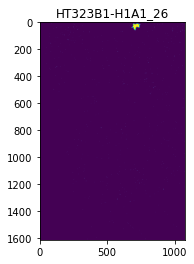

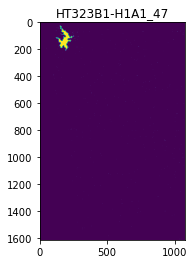

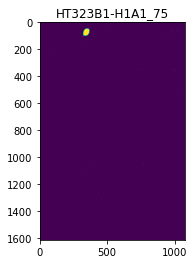

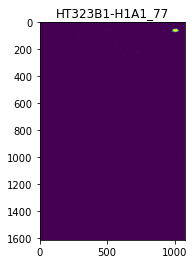

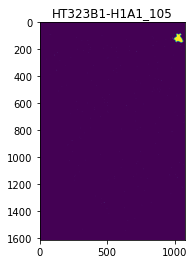

...

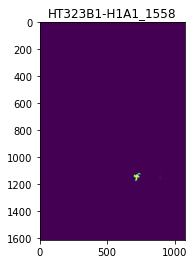

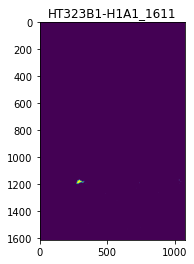

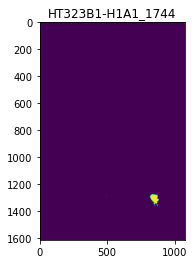

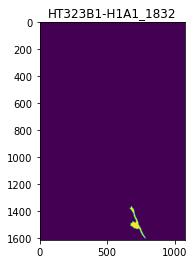

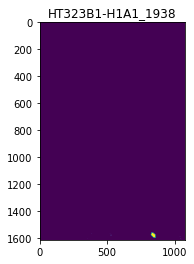

In [65]:
for rid in f.index:
    idx = int(rid.split('_')[-1])
    plt.imshow(labeled==idx)
    plt.title(rid)
    plt.show()

In [215]:
# fp = '/diskmnt/Projects/Users/estorrs/multiplex_data/codex/htan/brca/HT323B1-H1A1/level_2/HT323B1-H1A1.ome.tiff'
# channel_to_img = extract_ome_tiff(fp, channels=['SMA', 'DAPI', 'Pan-CK', 'MGP'])
# pseudo = make_pseudo(channel_to_img, cmap, contrast_pct=95.)
# sample_to_pseudo[sid] = pseudo

In [66]:
ridx = 75
rid = f'{sid}_{ridx}'
r1, c1, r2, c2 = region_to_bbox[rid]


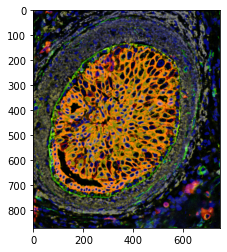

In [67]:
cropped_pseudo = sample_to_pseudo[sid][r1:r2, c1:c2]
plt.imshow(cropped_pseudo)

In [68]:
sample_to_grid_imgs[sid][ridx].keys()

dict_keys(['grid_binary_positive_regions', 'grid_labeled_regions_filtered', 'grid_labeled_regions_unfiltered'])

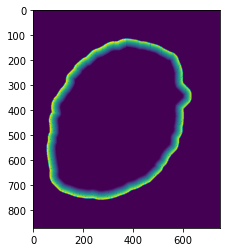

In [69]:
plt.imshow(sample_to_grid_imgs[sid][ridx]['grid_labeled_regions_filtered'])

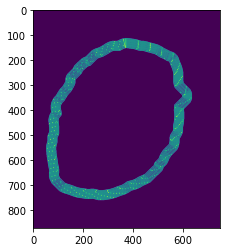

In [70]:
from skimage.segmentation import find_boundaries
plt.imshow(find_boundaries(sample_to_grid_imgs[sid][ridx]['grid_labeled_regions_filtered']))

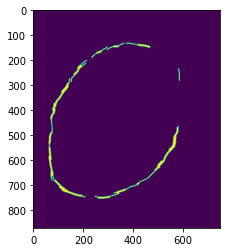

In [71]:
plt.imshow(sample_to_grid_imgs[sid][ridx]['grid_binary_positive_regions']['SMA']>0)

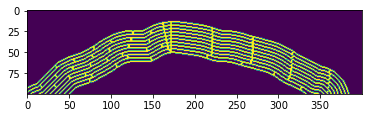

In [72]:
rb1, rb2, cb1, cb2 = 100, 200, 200, 600
plt.imshow(find_boundaries(sample_to_grid_imgs[sid][ridx]['grid_labeled_regions_filtered'][rb1:rb2, cb1:cb2]))

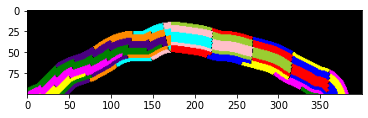

In [73]:
from skimage.color import label2rgb
plt.imshow(label2rgb(sample_to_grid_imgs[sid][ridx]['grid_labeled_regions_filtered'][rb1:rb2, cb1:cb2]))

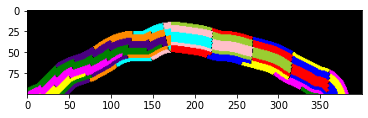

In [74]:
from skimage.color import label2rgb
plt.imshow(label2rgb(sample_to_grid_imgs[sid][ridx]['grid_labeled_regions_filtered'][rb1:rb2, cb1:cb2]))

In [75]:
d = sample_to_polys[sid][str(ridx)]['polygons_filtered']
d.keys()

dict_keys(['polys', 'group_lines', 'rings'])

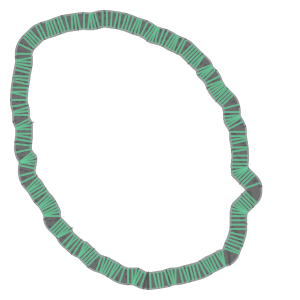

In [76]:
polys = loads(d['polys'])
polys = [p for p in polys if p.is_valid]
polys += [p for p in loads(d['group_lines']) if p.is_valid]
shapely.GeometryCollection(polys)

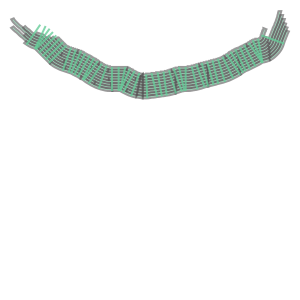

In [77]:
box = shapely.box(cb1, rb1, cb2, rb2)
from shapely import affinity
# box = affinity.scale(box, 1.)
affinity.scale(shapely.GeometryCollection([p for p in polys if box.intersects(p)]), 3., 3.)

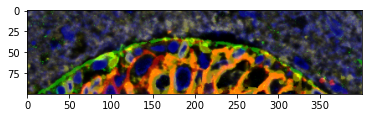

In [78]:
img = sample_to_pseudo[sid][r1:r2, c1:c2][rb1:rb2, cb1:cb2]
plt.imshow(img)

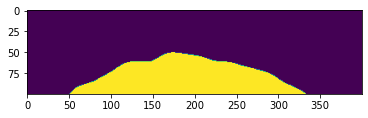

In [79]:
m = sample_to_imgs[sid]['region']['mask'][r1:r2, c1:c2][rb1:rb2, cb1:cb2]
plt.imshow(m)

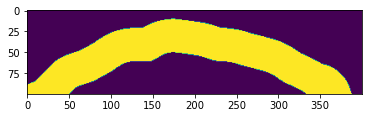

In [80]:
m = sample_to_imgs[sid]['myoepi']['mask'][r1:r2, c1:c2][rb1:rb2, cb1:cb2]
plt.imshow(m)

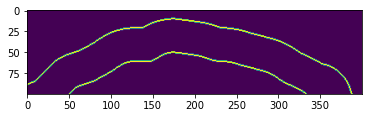

In [81]:
plt.imshow(find_boundaries(m))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


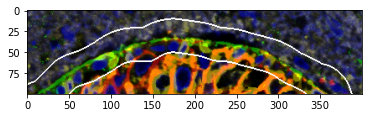

In [82]:
new = img.copy()
new[find_boundaries(m)] = [255., 255., 255.]
plt.imshow(new)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


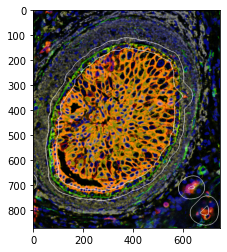

In [83]:
bounds = find_boundaries(sample_to_imgs[sid]['myoepi']['mask'][r1:r2, c1:c2])
new = cropped_pseudo.copy()
new[bounds] = [255., 255., 255.]
plt.imshow(new)

###### umap

In [130]:
import umap
from sklearn.preprocessing import StandardScaler

In [ ]:
X = 

In [152]:
exclude = ['bbox', 'sample']
feats = f[[c for c in f.columns if not any([True if val in c else False for val in exclude])]]
X = feats.values
X[pd.isnull(X)] = 0.
X = StandardScaler().fit_transform(X)
emb = umap.UMAP().fit_transform(X)

In [153]:
umap_df = pd.DataFrame(data=emb, columns=['UMAP1', 'UMAP2'], index=f.index)
umap_df = pd.concat((umap_df, f), axis=1)
umap_df

,UMAP1,UMAP2,boundary_area,boundary_bbox-0,boundary_bbox-1,boundary_bbox-2,boundary_bbox-3,boundary_cell_type_CD4 T cell_cell_fraction,boundary_cell_type_CD8 T cell_cell_fraction,boundary_cell_type_Endothelial_cell_fraction,...,region_metacluster_Stroma_cell_fraction,region_metacluster_T cell Enriched_cell_fraction,region_metacluster_Tumor Boundary - M2 Macrophage Enriched_cell_fraction,region_metacluster_Tumor Boundary - Mixed Immune Enriched_cell_fraction,region_metacluster_Tumor Boundary - Mixed_cell_fraction,region_metacluster_Tumor Boundary - Stroma Enriched 1_cell_fraction,region_metacluster_Tumor Boundary - Stroma Enriched 2_cell_fraction,region_metacluster_Tumor_cell_fraction,region_perimeter,sample
HT206B1-H1_1,11.727728,6.025928,258941,0,3350,443,4802,0.000000,0.030303,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.996599,3110.642928,HT206B1-H1
HT206B1-H1_2,11.662226,4.961284,3071313,0,5816,3550,10311,0.063045,0.077909,0.130702,...,0.000280,0.000140,0.001401,0.000000,0.008264,0.032638,0.017509,0.935565,45228.261654,HT206B1-H1
HT206B1-H1_5,11.845536,5.528145,252262,0,10213,906,11243,0.041176,0.000000,0.141176,...,0.007663,0.000000,0.000000,0.000000,0.000000,0.045977,0.007663,0.923372,3891.268612,HT206B1-H1
HT206B1-H1_7,11.910096,5.554358,488668,0,10461,1373,12349,0.062222,0.026667,0.120000,...,0.000000,0.000000,0.000000,0.000000,0.001449,0.016667,0.015942,0.965217,8228.912945,HT206B1-H1
HT206B1-H1_38,-0.388732,7.174646,417295,357,2617,1110,3583,0.200378,0.279773,0.043478,...,0.000000,0.000000,0.145946,0.151351,0.000000,0.000000,0.010811,0.021622,3011.825827,HT206B1-H1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HT397B1-H3A1_1029,-0.362228,3.331077,448238,14432,2159,15797,3162,0.177778,0.213333,0.093333,...,0.000000,0.134615,0.050000,0.007692,0.026923,0.046154,0.073077,0.438462,4739.422074,HT397B1-H3A1
HT397B1-H3A1_1133,1.624700,2.587837,1681921,16176,7991,19480,11548,0.203631,0.163378,0.089187,...,0.000000,0.001675,0.002094,0.000000,0.006910,0.032245,0.021985,0.933417,22213.881656,HT397B1-H3A1
HT397B1-H3A1_1208,-0.735126,0.634384,313644,17283,1642,17999,2598,0.000000,0.037037,0.296296,...,0.000000,0.000000,0.000000,0.000000,0.028571,0.028571,0.114286,0.771429,2311.953678,HT397B1-H3A1
HT397B1-H3A1_1220,2.305332,1.646118,323165,17446,18563,18128,19631,0.000000,0.000000,0.052632,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.990099,2809.742566,HT397B1-H3A1


<AxesSubplot:xlabel='UMAP1', ylabel='UMAP2'>

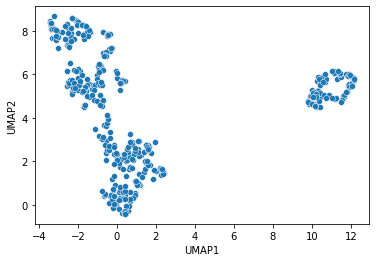

In [154]:
sns.scatterplot(data=umap_df, x='UMAP1', y='UMAP2')

<AxesSubplot:xlabel='UMAP1', ylabel='UMAP2'>

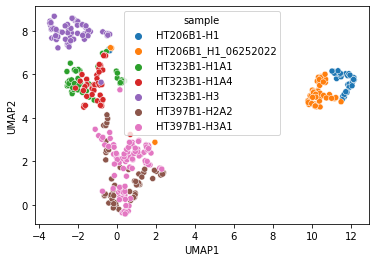

In [168]:
sns.scatterplot(data=umap_df, x='UMAP1', y='UMAP2', hue='sample')

<AxesSubplot:xlabel='UMAP1', ylabel='UMAP2'>

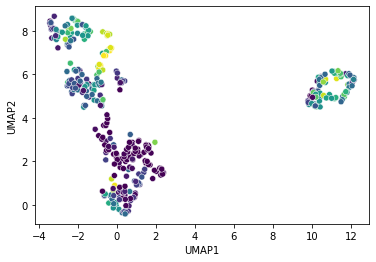

In [156]:
sns.scatterplot(data=umap_df, x='UMAP1', y='UMAP2', hue='region_grid_metrics_SMA_integrity',
                palette='viridis', legend=False)

<AxesSubplot:xlabel='UMAP1', ylabel='UMAP2'>

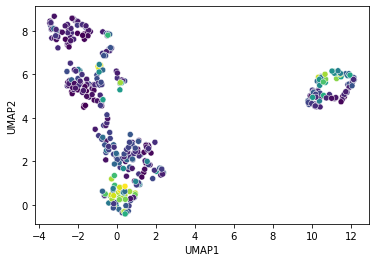

In [167]:
sns.scatterplot(data=umap_df, x='UMAP1', y='UMAP2', hue='region_compactness',
                palette='viridis', legend=False)

<AxesSubplot:xlabel='UMAP1', ylabel='UMAP2'>

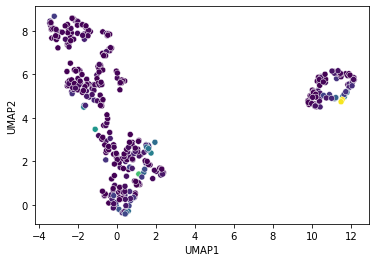

In [165]:
sns.scatterplot(data=umap_df, x='UMAP1', y='UMAP2', hue='region_area', vmax=1.,
                palette='viridis', legend=False)

In [166]:
umap_df

,UMAP1,UMAP2,boundary_area,boundary_bbox-0,boundary_bbox-1,boundary_bbox-2,boundary_bbox-3,boundary_cell_type_CD4 T cell_cell_fraction,boundary_cell_type_CD8 T cell_cell_fraction,boundary_cell_type_Endothelial_cell_fraction,...,region_metacluster_Stroma_cell_fraction,region_metacluster_T cell Enriched_cell_fraction,region_metacluster_Tumor Boundary - M2 Macrophage Enriched_cell_fraction,region_metacluster_Tumor Boundary - Mixed Immune Enriched_cell_fraction,region_metacluster_Tumor Boundary - Mixed_cell_fraction,region_metacluster_Tumor Boundary - Stroma Enriched 1_cell_fraction,region_metacluster_Tumor Boundary - Stroma Enriched 2_cell_fraction,region_metacluster_Tumor_cell_fraction,region_perimeter,sample
HT206B1-H1_1,11.727728,6.025928,258941,0,3350,443,4802,0.000000,0.030303,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.996599,3110.642928,HT206B1-H1
HT206B1-H1_2,11.662226,4.961284,3071313,0,5816,3550,10311,0.063045,0.077909,0.130702,...,0.000280,0.000140,0.001401,0.000000,0.008264,0.032638,0.017509,0.935565,45228.261654,HT206B1-H1
HT206B1-H1_5,11.845536,5.528145,252262,0,10213,906,11243,0.041176,0.000000,0.141176,...,0.007663,0.000000,0.000000,0.000000,0.000000,0.045977,0.007663,0.923372,3891.268612,HT206B1-H1
HT206B1-H1_7,11.910096,5.554358,488668,0,10461,1373,12349,0.062222,0.026667,0.120000,...,0.000000,0.000000,0.000000,0.000000,0.001449,0.016667,0.015942,0.965217,8228.912945,HT206B1-H1
HT206B1-H1_38,-0.388732,7.174646,417295,357,2617,1110,3583,0.200378,0.279773,0.043478,...,0.000000,0.000000,0.145946,0.151351,0.000000,0.000000,0.010811,0.021622,3011.825827,HT206B1-H1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HT397B1-H3A1_1029,-0.362228,3.331077,448238,14432,2159,15797,3162,0.177778,0.213333,0.093333,...,0.000000,0.134615,0.050000,0.007692,0.026923,0.046154,0.073077,0.438462,4739.422074,HT397B1-H3A1
HT397B1-H3A1_1133,1.624700,2.587837,1681921,16176,7991,19480,11548,0.203631,0.163378,0.089187,...,0.000000,0.001675,0.002094,0.000000,0.006910,0.032245,0.021985,0.933417,22213.881656,HT397B1-H3A1
HT397B1-H3A1_1208,-0.735126,0.634384,313644,17283,1642,17999,2598,0.000000,0.037037,0.296296,...,0.000000,0.000000,0.000000,0.000000,0.028571,0.028571,0.114286,0.771429,2311.953678,HT397B1-H3A1
HT397B1-H3A1_1220,2.305332,1.646118,323165,17446,18563,18128,19631,0.000000,0.000000,0.052632,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.990099,2809.742566,HT397B1-H3A1


In [144]:
umap_df['region_grid_metrics_SMA_integrity']

HT206B1-H1_1         0.109244
HT206B1-H1_2         0.715517
HT206B1-H1_5         0.810185
HT206B1-H1_7         0.389418
HT206B1-H1_38        1.000000
                       ...   
HT397B1-H3A1_1029    0.000000
HT397B1-H3A1_1133    0.006768
HT397B1-H3A1_1208    0.000000
HT397B1-H3A1_1220    0.000000
HT397B1-H3A1_1260    0.000000
Name: region_grid_metrics_SMA_integrity, Length: 382, dtype: float64

In [86]:
list(combined.columns)

['boundary_area',
 'boundary_bbox-0',
 'boundary_bbox-1',
 'boundary_bbox-2',
 'boundary_bbox-3',
 'boundary_cell_type_CD4 T cell_cell_fraction',
 'boundary_cell_type_CD8 T cell_cell_fraction',
 'boundary_cell_type_Endothelial_cell_fraction',
 'boundary_cell_type_Fibroblast_cell_fraction',
 'boundary_cell_type_Macrophage - M1_cell_fraction',
 'boundary_cell_type_Macrophage - M2_cell_fraction',
 'boundary_cell_type_Myoepithelial_cell_fraction',
 'boundary_cell_type_Noise_cell_fraction',
 'boundary_cell_type_Tumor_cell_fraction',
 'boundary_centroid-0',
 'boundary_centroid-1',
 'boundary_compactness',
 'boundary_eccentricity',
 'boundary_extent',
 'boundary_intensity_overlap_E-cadherin_Ki67',
 'boundary_intensity_overlap_E-cadherin_MGP',
 'boundary_intensity_overlap_E-cadherin_Pan-CK',
 'boundary_intensity_overlap_E-cadherin_Podoplanin',
 'boundary_intensity_overlap_E-cadherin_SMA',
 'boundary_intensity_overlap_Ki67_MGP',
 'boundary_intensity_overlap_Ki67_Pan-CK',
 'boundary_intensity_ov

###### only confident regions test

In [39]:
combined

,boundary_area,boundary_bbox-0,boundary_bbox-1,boundary_bbox-2,boundary_bbox-3,boundary_cell_type_CD4 T cell_cell_fraction,boundary_cell_type_CD8 T cell_cell_fraction,boundary_cell_type_Endothelial_cell_fraction,boundary_cell_type_Fibroblast_cell_fraction,boundary_cell_type_Macrophage - M1_cell_fraction,...,region_metacluster_T cell Enriched_cell_fraction,region_metacluster_Tumor Boundary - M2 Macrophage Enriched_cell_fraction,region_metacluster_Tumor Boundary - Mixed Immune Enriched_cell_fraction,region_metacluster_Tumor Boundary - Mixed_cell_fraction,region_metacluster_Tumor Boundary - Stroma Enriched 1_cell_fraction,region_metacluster_Tumor Boundary - Stroma Enriched 2_cell_fraction,region_metacluster_Tumor_cell_fraction,region_perimeter,region_voronoi_entropy,sample
HT206B1-H1_1,288848,0,3292,428,4858,0.000000,0.018519,0.018519,0.129630,0.018519,...,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.996296,2983.010460,1.422960,HT206B1-H1
HT206B1-H1_2,3584904,0,5869,3535,10328,0.044394,0.057562,0.096689,0.257336,0.118886,...,0.0,0.000621,0.0,0.006209,0.024992,0.013660,0.952189,41180.726733,1.544055,HT206B1-H1
HT206B1-H1_3,294295,0,10215,922,11262,0.042254,0.000000,0.103286,0.333333,0.140845,...,0.0,0.000000,0.0,0.000000,0.027778,0.009259,0.953704,3535.511252,1.452809,HT206B1-H1
HT206B1-H1_4,35898,0,11124,174,11449,0.000000,0.000000,0.052632,0.315789,0.210526,...,0.0,0.000000,0.0,0.000000,0.285714,0.428571,0.142857,318.509668,0.000000,HT206B1-H1
HT206B1-H1_5,646084,0,10536,1373,12334,0.044118,0.026961,0.068627,0.223039,0.122549,...,0.0,0.000000,0.0,0.000801,0.009608,0.011209,0.977582,7239.408327,1.538911,HT206B1-H1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HT397B1-H3A1_807,34432,19286,8942,19515,9160,0.428571,0.267857,0.000000,0.071429,0.053571,...,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,30.142136,NaN,HT397B1-H3A1
HT397B1-H3A1_808,100067,19336,11047,19698,11420,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,198.877200,NaN,HT397B1-H3A1
HT397B1-H3A1_809,78991,19796,2050,20113,2371,0.000000,0.000000,0.222222,0.222222,0.000000,...,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,56.769553,NaN,HT397B1-H3A1
HT397B1-H3A1_810,74758,19859,10591,20160,10903,0.000000,0.000000,0.200000,0.200000,0.000000,...,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,33.112698,NaN,HT397B1-H3A1


picking out dcis

In [41]:
f = combined[combined['region_area']>50000].copy()
f.shape

(515, 275)

In [27]:
def show_regions(df, feat, cmap=None):
    fig, axs = plt.subplots(nrows=1, ncols=len(sample_to_imgs), figsize=(20, 10))
    for (s, d), ax in zip(sample_to_imgs.items(), axs):
        labeled = sample_to_imgs[s]['region']['labeled_thumbnail']
        
        if feat is not None:
            img = get_display_image(s, labeled, region_to_bbox_thumbnail, color=feat, df=df, cmap=cmap)
        else:
            img = get_display_image(s, labeled, region_to_bbox_thumbnail, color='region_area', df=df, cmap=cmap)
            img = img[:, :, -1] > 0
        ax.imshow(img)
        ax.set_title(s)
        ax.set_xticks([])
        ax.set_yticks([])

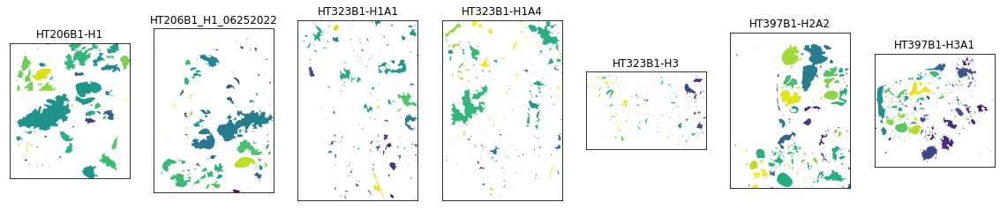

In [43]:
show_regions(combined, 'region_grid_metrics_SMA_integrity')

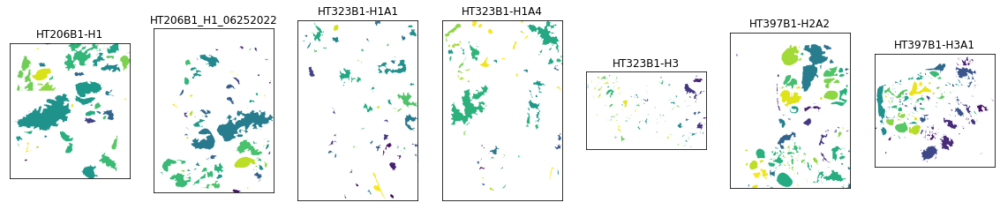

In [44]:
show_regions(f, 'region_grid_metrics_SMA_integrity')

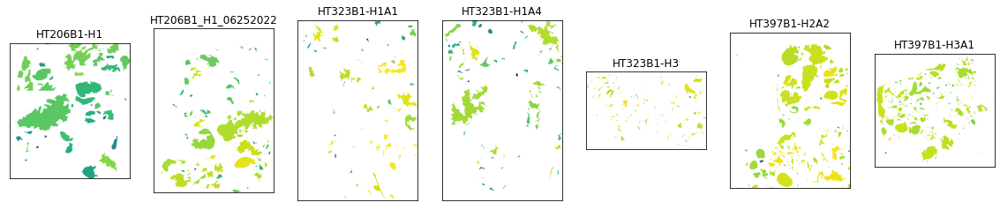

In [46]:
show_regions(f, 'region_voronoi_entropy')

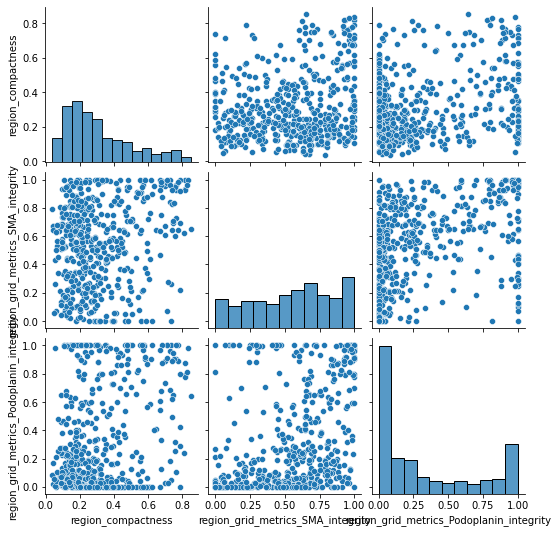

In [62]:
sns.pairplot(
    data=f,
    vars=['region_compactness', 'region_grid_metrics_SMA_integrity', 'region_grid_metrics_Podoplanin_integrity'])

<AxesSubplot:xlabel='region_grid_metrics_SMA_integrity', ylabel='region_grid_metrics_Podoplanin_integrity'>

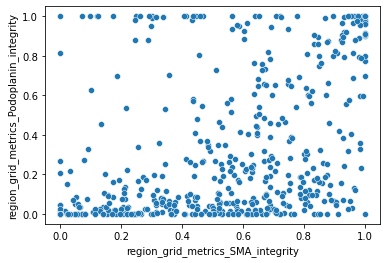

In [63]:
sns.scatterplot(data=f, x='region_grid_metrics_SMA_integrity', y='region_grid_metrics_Podoplanin_integrity')

In [64]:
mask = (f['region_grid_metrics_SMA_integrity'] > .4) | (f['region_grid_metrics_Podoplanin_integrity'] > .4)
f = f[mask]
f

,boundary_area,boundary_bbox-0,boundary_bbox-1,boundary_bbox-2,boundary_bbox-3,boundary_cell_type_CD4 T cell_cell_fraction,boundary_cell_type_CD8 T cell_cell_fraction,boundary_cell_type_Endothelial_cell_fraction,boundary_cell_type_Fibroblast_cell_fraction,boundary_cell_type_Macrophage - M1_cell_fraction,...,region_metacluster_Stroma_cell_fraction,region_metacluster_T cell Enriched_cell_fraction,region_metacluster_Tumor Boundary - M2 Macrophage Enriched_cell_fraction,region_metacluster_Tumor Boundary - Mixed Immune Enriched_cell_fraction,region_metacluster_Tumor Boundary - Mixed_cell_fraction,region_metacluster_Tumor Boundary - Stroma Enriched 1_cell_fraction,region_metacluster_Tumor Boundary - Stroma Enriched 2_cell_fraction,region_metacluster_Tumor_cell_fraction,region_perimeter,sample
HT206B1-H1_2,3584904,0,5869,3535,10328,0.044394,0.057562,0.096689,0.257336,0.118886,...,0.000000,0.0,0.000621,0.000000,0.006209,0.024992,0.013660,0.952189,41180.726733,HT206B1-H1
HT206B1-H1_3,294295,0,10215,922,11262,0.042254,0.000000,0.103286,0.333333,0.140845,...,0.000000,0.0,0.000000,0.000000,0.000000,0.027778,0.009259,0.953704,3535.511252,HT206B1-H1
HT206B1-H1_5,646084,0,10536,1373,12334,0.044118,0.026961,0.068627,0.223039,0.122549,...,0.000000,0.0,0.000000,0.000000,0.000801,0.009608,0.011209,0.977582,7239.408327,HT206B1-H1
HT206B1-H1_14,408958,372,2637,1116,3565,0.164151,0.245283,0.043396,0.158491,0.081132,...,0.000000,0.0,0.119403,0.104478,0.000000,0.000000,0.007463,0.029851,2803.423807,HT206B1-H1
HT206B1-H1_27,1046604,978,9002,2970,10877,0.031397,0.031397,0.056515,0.271586,0.117739,...,0.000000,0.0,0.000000,0.000000,0.000000,0.002182,0.003636,0.945455,10778.111534,HT206B1-H1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HT397B1-H3A1_560,523438,11903,5697,12997,7841,0.024306,0.013889,0.194444,0.184028,0.017361,...,0.000000,0.0,0.000000,0.000000,0.000000,0.002320,0.000000,0.954756,5242.167240,HT397B1-H3A1
HT397B1-H3A1_561,926157,11904,3405,14270,6029,0.031513,0.016807,0.191176,0.205882,0.065126,...,0.000000,0.0,0.001514,0.000000,0.000000,0.000505,0.000000,0.978305,7895.015362,HT397B1-H3A1
HT397B1-H3A1_571,873325,12521,5918,14644,8364,0.018900,0.020619,0.201031,0.211340,0.044674,...,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000693,0.957049,8225.888378,HT397B1-H3A1
HT397B1-H3A1_581,723441,12862,953,14964,2331,0.031250,0.039062,0.160156,0.250000,0.109375,...,0.003128,0.0,0.000000,0.000000,0.000000,0.015641,0.010428,0.823775,5624.210096,HT397B1-H3A1


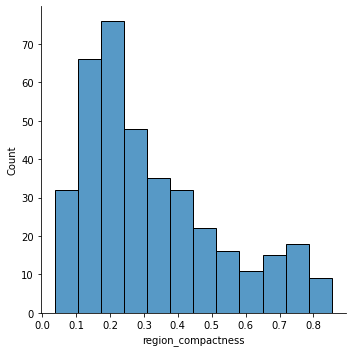

In [65]:
sns.displot(f['region_compactness'])

In [66]:
# f = f[f['region_compactness']>.3]
# f

(1512, 1344, 4)
(2016, 1478, 4)
(1613, 1075, 4)
(1613, 1075, 4)
(1210, 1882, 4)
(1915, 1478, 4)
(2016, 2150, 4)


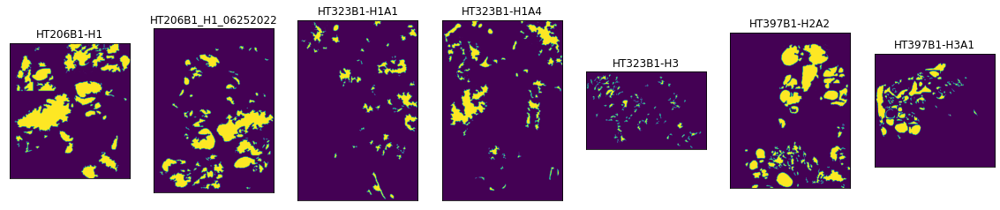

In [67]:
show_regions(f, None)

In [ ]:
for region_id in f.index:
    sid, rid = '_'.join(region_id.split('_')[:-1]), int(region_id.split('_')[-1])
    r1, c1, r2, c2 = region_to_bbox[region_id]
    img = sample_to_pseudo[sid][r1:r2, c1:c2]
    mask = sample_to_imgs[sid]['region']['labeled'][r1:r2, c1:c2]==rid
    
    fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(8, 4))
    axs[0].imshow(img)
    axs[1].imshow(mask)
    axs[0].set_title(region_id)
    plt.show()

In [167]:
pure = {
    'HT206B1-H1': [78, 184, 202, 208, 233, 236, 249],
    'HT206B1_H1_06252022': [95, 147, 153, 210, 230, 334, 368, 427],
    'HT323B1-H1A1': [75, 1938],
    'HT323B1-H1A4': [2, 3, 19, 20, 34, 40, 67, 92, 94, 116, 210, 218, 348, 1642],
    'HT323B1-H3': [207, 235, 260, 535, 700, 833, 938, 1283, 1989, 2049],
    'HT397B1-H2A2': [5, 9, 10, 40, 84, 95, 112, 115, 125, 142, 145, 147, 157, 158, 166, 196, 258, 345, 349, 397, 400, 409, 439, 458, 460, 521],
    'HT397B1-H3A1': [24, 58, 79, 96, 109, 123, 126, 171, 173, 226, 236, 266, 335, 338, 359, 375, 391, 417, 433, 466, 477, 499, 513, 530, 536, 551, 552, 560, 561, 571, 581],
}

pure_dcis_regions = [f'{k}_{v}' for k, vs in pure.items() for v in vs]
len(pure_dcis_regions)

98

In [ ]:
for region_id in pure_dcis_regions:
    sid, rid = '_'.join(region_id.split('_')[:-1]), int(region_id.split('_')[-1])
    r1, c1, r2, c2 = region_to_bbox[region_id]
    img = sample_to_pseudo[sid][r1:r2, c1:c2]
    mask = sample_to_imgs[sid]['region']['labeled'][r1:r2, c1:c2]==rid
    
    fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(8, 4))
    axs[0].imshow(img)
    axs[1].imshow(mask)
    axs[0].set_title(region_id)
    plt.show()

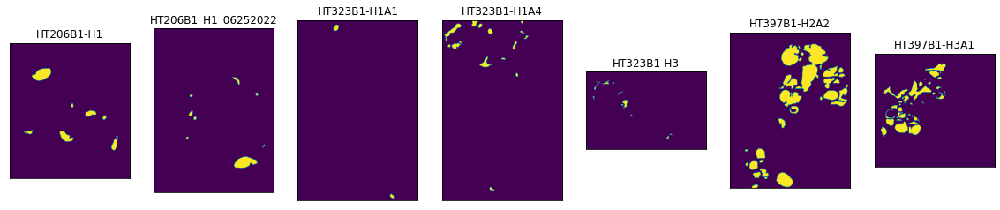

In [48]:
f = combined.loc[pure_dcis_regions]
show_regions(f, None)

<AxesSubplot:xlabel='region_grid_metrics_SMA_integrity', ylabel='region_grid_metrics_Podoplanin_integrity'>

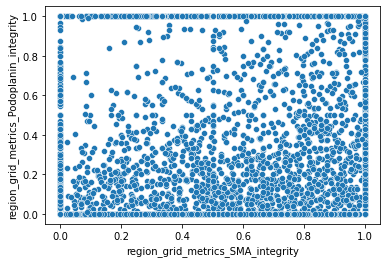

In [168]:
import seaborn as sns
f = combined[combined['region_area']<50000]
sns.scatterplot(data=f, x='region_grid_metrics_SMA_integrity', y='region_grid_metrics_Podoplanin_integrity')

In [169]:
mask = (f['region_grid_metrics_SMA_integrity'] > .9) & (f['region_grid_metrics_Podoplanin_integrity'] > .9)
idxs = f[mask].index.to_list()


In [ ]:
for region_id in idxs:
    sid, rid = '_'.join(region_id.split('_')[:-1]), int(region_id.split('_')[-1])
    r1, c1, r2, c2 = region_to_bbox[region_id]
    img = sample_to_pseudo[sid][r1:r2, c1:c2]
    mask = sample_to_imgs[sid]['region']['labeled'][r1:r2, c1:c2]==rid
    
    fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(8, 4))
    axs[0].imshow(img)
    axs[1].imshow(mask)
    axs[0].set_title(region_id)
    plt.show()

In [171]:
exclude = {
    'HT206B1-H1': [],
    'HT206B1_H1_06252022': [45, 58, 62, 166, 180, 247, 272, 306, 339, 357, 374, 376, 384, 398, 416, 426, 433, 524, 526, 579],
    'HT323B1-H1A4': [12, 38, 39, 74, 79, 80, 82, 98, 106, 111, 112, 140, 162, 200, 212, 280, 417, 488, 489, 580, 584, 618, 632, 699, 739, 911, ],
}

include = {
    'HT323B1-H1A1': [1213, 1308, 1402, 1441, 1583, 1598, 1610, 1643, 1672, 1674, 1699, 1703, 1712, 1748, 1787, 1840, 1859, 1862, 1863, 1869, 1875, 1878, 1882, 1889, 1895, 1912, 1914, 1915, 1916, 1919, 1920, 1921, 1923, 1925, 1926, 1928, 1929, 1930, 1932, ],
    'HT323B1-H3': [41, 63, 57, 107, 108, 109, 114, 118, 195, 269, 290, 333, 402, 610, 777, 880, 1110, 1115, 1148, 1192, 1219, 1226, 1260, 1278, 1416, 1419, 1427, 1454, 1457, 1500],
    'HT397B1-H2A2': [],
    'HT397B1-H3A1': [],
}

norms = [f'{k}_{v}' for k, vs in include.items() for v in vs]
norms += [x for x in idxs
          if '_'.join(x.split('_')[:-1]) in exclude
          if int(x.split('_')[-1]) not in exclude['_'.join(x.split('_')[:-1])]]

len(norms)


299

In [ ]:
for region_id in sorted(norms):
    sid, rid = '_'.join(region_id.split('_')[:-1]), int(region_id.split('_')[-1])
    r1, c1, r2, c2 = region_to_bbox[region_id]
    img = sample_to_pseudo[sid][r1:r2, c1:c2]
    mask = sample_to_imgs[sid]['region']['labeled'][r1:r2, c1:c2]==rid
    
    fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(8, 4))
    axs[0].imshow(img)
    axs[1].imshow(mask)
    axs[0].set_title(region_id)
    plt.show()

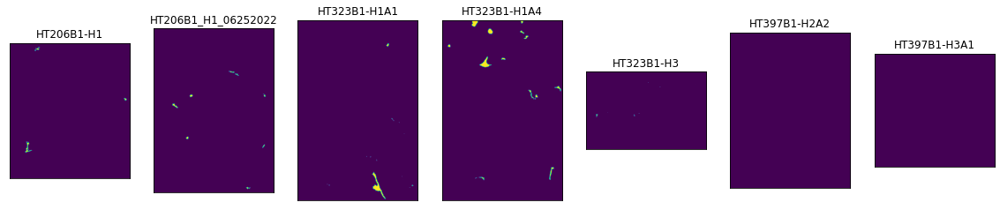

In [53]:
f = combined.loc[normal_regions]
show_regions(f, None)

In [172]:
mask = (combined['region_grid_metrics_SMA_integrity'] < .2) & (combined['region_grid_metrics_Podoplanin_integrity'] < .2)
idxs = combined[mask].index.to_list()


In [ ]:
for region_id in idxs:
    sid, rid = '_'.join(region_id.split('_')[:-1]), int(region_id.split('_')[-1])
    r1, c1, r2, c2 = region_to_bbox[region_id]
    img = sample_to_pseudo[sid][r1:r2, c1:c2]
    mask = sample_to_imgs[sid]['region']['labeled'][r1:r2, c1:c2]==rid
    
    fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(8, 4))
    axs[0].imshow(img)
    axs[1].imshow(mask)
    axs[0].set_title(region_id)
    plt.show()

In [173]:
idc = {
    'HT206B1-H1': [31, 33, 39, 55, 81, 126, 127, 334, 2, 3, 5, 123, 251, 331],
    'HT206B1_H1_06252022': [78, 124, 189, 536, 582, 196, 209, 274, 341, 344, 348, 400, 457, 529],
    'HT323B1-H1A1': [16, 54, 100, 101, 150, 154, 210, 511, 1099, 1143, 1583, 364, 526, 529, 618, 780, 827, 1086, 1558, 1570],
    'HT323B1-H1A4': [394, 443, 521, 539, 670, 712, 785, 966, 993, 1131, 1318, 1478, 8, 93, 193, 198, 360, 484, 683, 910, 1249],
    'HT323B1-H3': [130, 147, 183, 222, 280, 314, 344, 363, 575, 659, 687, 1048, 1353, 25, 43, 53, 168, 211, 296, 315, 364, 609, 766, 836, 1207, 1245, 1408],
    'HT397B1-H2A2': [1, 12, 29, 34, 137, 148, 195, 246, 296, 497, 512, 317, 333, 354, 376, 386, 443, 516],
    'HT397B1-H3A1': [2, 5, 7, 14, 18, 23, 37, 49, 74, 137, 167, 195, 223, 257, 314, 332, 160, 396, 436],
}

pure_idc_regions = [f'{k}_{v}' for k, vs in idc.items() for v in vs]
len(pure_idc_regions)



133

In [ ]:
for region_id in pure_idc_regions:
    sid, rid = '_'.join(region_id.split('_')[:-1]), int(region_id.split('_')[-1])
    r1, c1, r2, c2 = region_to_bbox[region_id]
    img = sample_to_pseudo[sid][r1:r2, c1:c2]
    mask = sample_to_imgs[sid]['region']['labeled'][r1:r2, c1:c2]==rid
    
    fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(8, 4))
    axs[0].imshow(img)
    axs[1].imshow(mask)
    axs[0].set_title(region_id)
    plt.show()

In [174]:
region_to_type = {x: 'normal' for x in norms}
region_to_type.update({x: 'dcis' for x in pure_dcis_regions})
region_to_type.update({x: 'idc' for x in pure_idc_regions})
combined['region_type'] = [region_to_type.get(x, 'unclassified') for x in combined.index]

In [175]:
from collections import Counter
Counter(combined['region_type']).most_common()

[('unclassified', 7824), ('normal', 298), ('idc', 133), ('dcis', 98)]

In [176]:
np.count_nonzero(combined['region_type']!='unclassified')

529

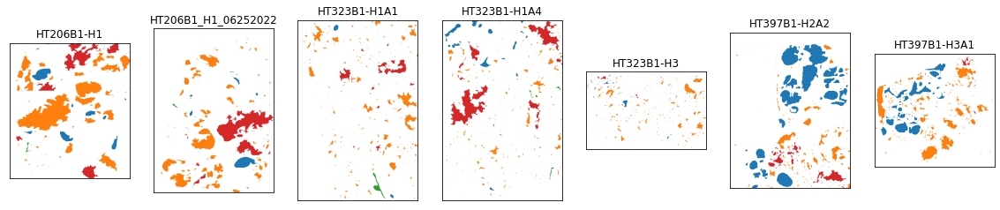

In [58]:
cmap = {x:c for c, x in zip(sns.color_palette('tab10'), set(combined['region_type']))}
show_regions(combined, 'region_type', cmap=cmap)

In [31]:
cmap.keys()

dict_keys(['dcis', 'normal', 'idc', 'unclassified'])

In [32]:
sns.color_palette(cmap.values())

[(0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 (1.0, 0.4980392156862745, 0.054901960784313725),
 (0.17254901960784313, 0.6274509803921569, 0.17254901960784313),
 (0.8392156862745098, 0.15294117647058825, 0.1568627450980392)]

In [177]:
f = combined[combined['region_type']!='unclassified']

<AxesSubplot:xlabel='region_type', ylabel='region_intensity_positive_fraction_MGP'>

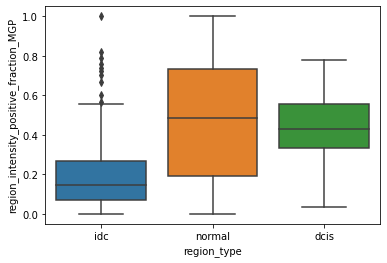

In [178]:
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
sns.boxplot(data=f, x='region_type', y='region_intensity_positive_fraction_MGP')
# plt.savefig('/diskmnt/Projects/Users/estorrs/sandbox/mgp_boxplot.pdf')

<AxesSubplot:xlabel='region_type', ylabel='region_voronoi_entropy'>

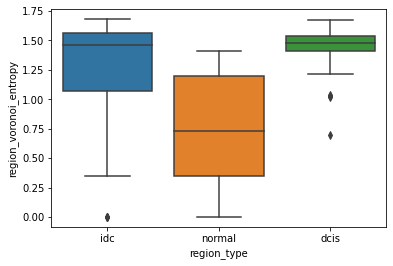

In [179]:
sns.boxplot(data=f, x='region_type', y='region_voronoi_entropy')

In [36]:
list(combined.columns)

['boundary_area',
 'boundary_bbox-0',
 'boundary_bbox-1',
 'boundary_bbox-2',
 'boundary_bbox-3',
 'boundary_cell_type_CD4 T cell_cell_fraction',
 'boundary_cell_type_CD8 T cell_cell_fraction',
 'boundary_cell_type_Endothelial_cell_fraction',
 'boundary_cell_type_Fibroblast_cell_fraction',
 'boundary_cell_type_Macrophage - M1_cell_fraction',
 'boundary_cell_type_Macrophage - M2_cell_fraction',
 'boundary_cell_type_Myoepithelial_cell_fraction',
 'boundary_cell_type_Noise_cell_fraction',
 'boundary_cell_type_Tumor_cell_fraction',
 'boundary_centroid-0',
 'boundary_centroid-1',
 'boundary_compactness',
 'boundary_eccentricity',
 'boundary_extent',
 'boundary_intensity_overlap_E-cadherin_Ki67',
 'boundary_intensity_overlap_E-cadherin_MGP',
 'boundary_intensity_overlap_E-cadherin_Pan-CK',
 'boundary_intensity_overlap_E-cadherin_Podoplanin',
 'boundary_intensity_overlap_E-cadherin_SMA',
 'boundary_intensity_overlap_Ki67_MGP',
 'boundary_intensity_overlap_Ki67_Pan-CK',
 'boundary_intensity_ov

In [37]:
region_to_type

{'HT206B1-H1_14': 'normal',
 'HT206B1-H1_162': 'normal',
 'HT206B1-H1_262': 'normal',
 'HT206B1_H1_06252022_82': 'normal',
 'HT206B1_H1_06252022_87': 'normal',
 'HT206B1_H1_06252022_152': 'normal',
 'HT206B1_H1_06252022_172': 'normal',
 'HT206B1_H1_06252022_583': 'normal',
 'HT323B1-H1A1_277': 'normal',
 'HT323B1-H1A1_1832': 'normal',
 'HT323B1-H1A4_505': 'normal',
 'HT323B1-H1A4_565': 'normal',
 'HT323B1-H1A4_1444': 'normal',
 'HT323B1-H1A4_1573': 'normal',
 'HT323B1-H3_1235': 'normal',
 'HT323B1-H1A1_1213': 'normal',
 'HT323B1-H1A1_1308': 'normal',
 'HT323B1-H1A1_1402': 'normal',
 'HT323B1-H1A1_1441': 'normal',
 'HT323B1-H1A1_1583': 'idc',
 'HT323B1-H1A1_1598': 'normal',
 'HT323B1-H1A1_1610': 'normal',
 'HT323B1-H1A1_1643': 'normal',
 'HT323B1-H1A1_1672': 'normal',
 'HT323B1-H1A1_1660': 'normal',
 'HT323B1-H1A1_1674': 'normal',
 'HT323B1-H1A1_1699': 'normal',
 'HT323B1-H1A1_1703': 'normal',
 'HT323B1-H1A1_1712': 'normal',
 'HT323B1-H1A1_1748': 'normal',
 'HT323B1-H1A1_1787': 'normal'

In [180]:
dataset_dir = '/diskmnt/Projects/Users/estorrs/multiplex_data/analysis/dcis_region_analysis/classifier_v1/data'

In [181]:
from pathlib import Path
Path(dataset_dir).mkdir(parents=True, exist_ok=True)

In [182]:
from skimage.transform import rescale
region_to_cls_imgs = {}
for s in sample_to_imgs.keys():
    print(s)
    img = sample_to_imgs[s]['region']['labeled']
    pseudo = sample_to_pseudo[s]
    
    for region in [r for r in combined.index.to_list() if '_'.join(r.split('_')[:-1])==s]:
        integer_label = int(region.split('_')[-1])
        r1, c1, r2, c2 = region_to_bbox[region]
        mask = img[r1:r2, c1:c2]==integer_label
        rgb = pseudo[r1:r2, c1:c2]
        
        if mask.shape[0] > 0 and mask.shape[1] > 0:
            scale_factor = 256. / max(r2 - r1, c2 - c1)
            resized_mask = rescale(mask, scale_factor)
            resized_rgb = rescale(rgb, scale_factor, multichannel=True, preserve_range=True)

            n = abs(resized_mask.shape[0] - resized_mask.shape[1])
            if resized_mask.shape[0] < resized_mask.shape[1]:
                resized_mask = np.pad(resized_mask, ((n//2, n//2 + (0 if n % 2 == 0 else 1)), (0, 0)))
                resized_rgb = np.pad(resized_rgb, ((n//2, n//2 + (0 if n % 2 == 0 else 1)), (0, 0), (0, 0)))
            else:
                resized_mask = np.pad(resized_mask, ((0, 0), (n//2, n//2 + (0 if n % 2 == 0 else 1))))
                resized_rgb = np.pad(resized_rgb, ((0, 0), (n//2, n//2 + (0 if n % 2 == 0 else 1)), (0, 0)))
            region_to_cls_imgs[region] = {
                'mask': resized_mask,
                'rgb': resized_rgb
            }


HT206B1-H1


/diskmnt/Projects/Users/estorrs/miniconda3/envs/squidpy/lib/python3.7/site-packages/ipykernel_launcher.py:17: FutureWarning: `multichannel` is a deprecated argument name for `rescale`. It will be removed in version 1.0. Please use `channel_axis` instead.
  app.launch_new_instance()


HT206B1_H1_06252022
HT323B1-H1A1
HT323B1-H1A4
HT323B1-H3
HT397B1-H2A2
HT397B1-H3A1


In [184]:
len(region_to_cls_imgs)

8353

In [185]:
region_to_type.keys()

dict_keys(['HT323B1-H1A1_1213', 'HT323B1-H1A1_1308', 'HT323B1-H1A1_1402', 'HT323B1-H1A1_1441', 'HT323B1-H1A1_1583', 'HT323B1-H1A1_1598', 'HT323B1-H1A1_1610', 'HT323B1-H1A1_1643', 'HT323B1-H1A1_1672', 'HT323B1-H1A1_1674', 'HT323B1-H1A1_1699', 'HT323B1-H1A1_1703', 'HT323B1-H1A1_1712', 'HT323B1-H1A1_1748', 'HT323B1-H1A1_1787', 'HT323B1-H1A1_1840', 'HT323B1-H1A1_1859', 'HT323B1-H1A1_1862', 'HT323B1-H1A1_1863', 'HT323B1-H1A1_1869', 'HT323B1-H1A1_1875', 'HT323B1-H1A1_1878', 'HT323B1-H1A1_1882', 'HT323B1-H1A1_1889', 'HT323B1-H1A1_1895', 'HT323B1-H1A1_1912', 'HT323B1-H1A1_1914', 'HT323B1-H1A1_1915', 'HT323B1-H1A1_1916', 'HT323B1-H1A1_1919', 'HT323B1-H1A1_1920', 'HT323B1-H1A1_1921', 'HT323B1-H1A1_1923', 'HT323B1-H1A1_1925', 'HT323B1-H1A1_1926', 'HT323B1-H1A1_1928', 'HT323B1-H1A1_1929', 'HT323B1-H1A1_1930', 'HT323B1-H1A1_1932', 'HT323B1-H3_41', 'HT323B1-H3_63', 'HT323B1-H3_57', 'HT323B1-H3_107', 'HT323B1-H3_108', 'HT323B1-H3_109', 'HT323B1-H3_114', 'HT323B1-H3_118', 'HT323B1-H3_195', 'HT323B1-H3

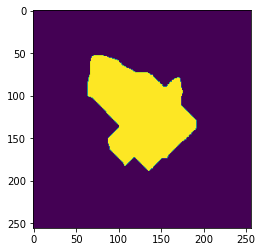

In [186]:
plt.imshow(region_to_cls_imgs['HT206B1-H1_162']['mask'])

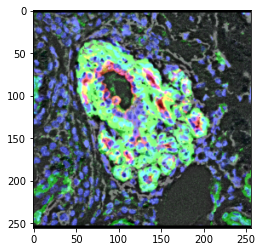

In [187]:
plt.imshow(region_to_cls_imgs['HT206B1-H1_162']['rgb'])

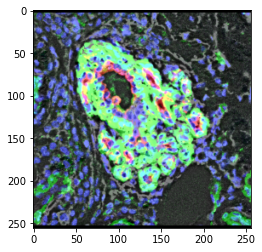

In [188]:
plt.imshow((region_to_cls_imgs['HT206B1-H1_162']['rgb'] * 255.).astype(np.uint8))

In [189]:
# x = np.asarray([d['rgb'] for d in region_to_cls_imgs.values()])
# x.mean(axis=(0, 1, 2)), x.std(axis=(0, 1, 2))

In [190]:
list(combined.columns)

['boundary_area',
 'boundary_bbox-0',
 'boundary_bbox-1',
 'boundary_bbox-2',
 'boundary_bbox-3',
 'boundary_cell_type_CD4 T cell_cell_fraction',
 'boundary_cell_type_CD8 T cell_cell_fraction',
 'boundary_cell_type_Endothelial_cell_fraction',
 'boundary_cell_type_Fibroblast_cell_fraction',
 'boundary_cell_type_Macrophage - M1_cell_fraction',
 'boundary_cell_type_Macrophage - M2_cell_fraction',
 'boundary_cell_type_Myoepithelial_cell_fraction',
 'boundary_cell_type_Noise_cell_fraction',
 'boundary_cell_type_Tumor_cell_fraction',
 'boundary_centroid-0',
 'boundary_centroid-1',
 'boundary_compactness',
 'boundary_eccentricity',
 'boundary_extent',
 'boundary_intensity_overlap_E-cadherin_Ki67',
 'boundary_intensity_overlap_E-cadherin_MGP',
 'boundary_intensity_overlap_E-cadherin_Pan-CK',
 'boundary_intensity_overlap_E-cadherin_Podoplanin',
 'boundary_intensity_overlap_E-cadherin_SMA',
 'boundary_intensity_overlap_Ki67_MGP',
 'boundary_intensity_overlap_Ki67_Pan-CK',
 'boundary_intensity_ov

In [191]:
feats = ['region_compactness', 'region_area',
         'region_grid_metrics_Podoplanin_integrity', 'region_grid_metrics_SMA_integrity',
         'region_grid_metrics_Podoplanin_mean_thickness_nonbreaks', 'region_grid_metrics_SMA_mean_thickness_nonbreaks',
         'myoepi_intensity_overlap_Pan-CK_Podoplanin', 'myoepi_intensity_overlap_Pan-CK_SMA',
         'myoepi_intensity_overlap_Podoplanin_SMA',]

f = combined.loc[list(region_to_cls_imgs.keys()), feats]
f

,region_compactness,region_area,region_grid_metrics_Podoplanin_integrity,region_grid_metrics_SMA_integrity,region_grid_metrics_Podoplanin_mean_thickness_nonbreaks,region_grid_metrics_SMA_mean_thickness_nonbreaks,myoepi_intensity_overlap_Pan-CK_Podoplanin,myoepi_intensity_overlap_Pan-CK_SMA,myoepi_intensity_overlap_Podoplanin_SMA
HT206B1-H1_1,0.267643,189520,0.033613,0.138655,1.000000,2.090909,0.014724,0.009939,0.002432
HT206B1-H1_2,0.042458,5729817,0.084088,0.669752,1.833724,3.537195,0.008388,0.019800,0.010623
HT206B1-H1_3,0.181016,180058,0.195545,0.876238,2.126582,3.638418,0.008840,0.012916,0.035284
HT206B1-H1_4,0.349684,2823,0.434783,0.869565,1.800000,3.300000,0.011819,0.001336,0.055498
HT206B1-H1_5,0.275996,1151063,0.038631,0.578366,2.714286,2.900763,0.008554,0.013814,0.012563
...,...,...,...,...,...,...,...,...,...
HT397B1-H3A1_807,0.802213,58,0.000000,0.000000,0.000000,0.000000,0.000000,0.013684,0.000268
HT397B1-H3A1_808,0.796198,2506,0.000000,0.000000,0.000000,0.000000,0.002655,0.007573,0.000000
HT397B1-H3A1_809,0.756451,194,0.000000,0.000000,0.000000,0.000000,0.000969,0.007888,0.000000
HT397B1-H3A1_810,0.687657,60,0.000000,0.000000,0.000000,0.000000,0.000789,0.005997,0.000000


In [192]:
from sklearn.preprocessing import StandardScaler
f = pd.DataFrame(data=StandardScaler().fit_transform(f.values), index=f.index.to_list(), columns=f.columns)
f

,region_compactness,region_area,region_grid_metrics_Podoplanin_integrity,region_grid_metrics_SMA_integrity,region_grid_metrics_Podoplanin_mean_thickness_nonbreaks,region_grid_metrics_SMA_mean_thickness_nonbreaks,myoepi_intensity_overlap_Pan-CK_Podoplanin,myoepi_intensity_overlap_Pan-CK_SMA,myoepi_intensity_overlap_Podoplanin_SMA
HT206B1-H1_1,-1.188638,0.451413,-0.544258,-0.961646,-0.153933,-0.071999,-0.350554,-0.427871,-0.427364
HT206B1-H1_2,-1.986058,16.841354,-0.401739,0.455851,0.212171,0.691844,-0.479809,-0.124575,-0.335857
HT206B1-H1_3,-1.495398,0.423422,-0.087035,1.006962,0.340771,0.745305,-0.470596,-0.336307,-0.060355
HT206B1-H1_4,-0.898115,-0.100895,0.588470,0.989153,0.197362,0.566572,-0.409816,-0.692486,0.165479
HT206B1-H1_5,-1.159057,3.295960,-0.530090,0.211943,0.598842,0.355719,-0.476427,-0.308698,-0.314182
...,...,...,...,...,...,...,...,...,...
HT397B1-H3A1_807,0.704377,-0.109075,-0.639168,-1.331718,-0.593053,-1.176295,-0.650953,-0.312691,-0.451536
HT397B1-H3A1_808,0.683075,-0.101833,-0.639168,-1.331718,-0.593053,-1.176295,-0.596793,-0.500639,-0.454533
HT397B1-H3A1_809,0.542323,-0.108672,-0.639168,-1.331718,-0.593053,-1.176295,-0.631189,-0.490956,-0.454533
HT397B1-H3A1_810,0.298712,-0.109069,-0.639168,-1.331718,-0.593053,-1.176295,-0.634853,-0.549111,-0.454533


In [193]:
f['label'] = [region_to_type.get(r) for r in f.index.to_list()]

In [194]:
f = f.loc[f[[c for c in f.columns if c != 'label']].dropna().index.to_list()]
f

,region_compactness,region_area,region_grid_metrics_Podoplanin_integrity,region_grid_metrics_SMA_integrity,region_grid_metrics_Podoplanin_mean_thickness_nonbreaks,region_grid_metrics_SMA_mean_thickness_nonbreaks,myoepi_intensity_overlap_Pan-CK_Podoplanin,myoepi_intensity_overlap_Pan-CK_SMA,myoepi_intensity_overlap_Podoplanin_SMA,label
HT206B1-H1_1,-1.188638,0.451413,-0.544258,-0.961646,-0.153933,-0.071999,-0.350554,-0.427871,-0.427364,None
HT206B1-H1_2,-1.986058,16.841354,-0.401739,0.455851,0.212171,0.691844,-0.479809,-0.124575,-0.335857,idc
HT206B1-H1_3,-1.495398,0.423422,-0.087035,1.006962,0.340771,0.745305,-0.470596,-0.336307,-0.060355,idc
HT206B1-H1_4,-0.898115,-0.100895,0.588470,0.989153,0.197362,0.566572,-0.409816,-0.692486,0.165479,None
HT206B1-H1_5,-1.159057,3.295960,-0.530090,0.211943,0.598842,0.355719,-0.476427,-0.308698,-0.314182,idc
...,...,...,...,...,...,...,...,...,...,...
HT397B1-H3A1_807,0.704377,-0.109075,-0.639168,-1.331718,-0.593053,-1.176295,-0.650953,-0.312691,-0.451536,None
HT397B1-H3A1_808,0.683075,-0.101833,-0.639168,-1.331718,-0.593053,-1.176295,-0.596793,-0.500639,-0.454533,None
HT397B1-H3A1_809,0.542323,-0.108672,-0.639168,-1.331718,-0.593053,-1.176295,-0.631189,-0.490956,-0.454533,None
HT397B1-H3A1_810,0.298712,-0.109069,-0.639168,-1.331718,-0.593053,-1.176295,-0.634853,-0.549111,-0.454533,None


In [195]:
np.count_nonzero(pd.isnull(f[[c for c in f.columns if c != 'label']]))

0

In [196]:
import torch

In [197]:
from torch.utils.data import Dataset
from einops import rearrange
import torchvision.transforms.functional as TF
from torchvision.transforms import ColorJitter, Normalize, RandomHorizontalFlip, RandomVerticalFlip, RandomAdjustSharpness, Compose, RandomAffine, RandomResizedCrop

In [198]:
def convert_rgb(img):
    if img.shape[-1] == 3:
        img = rearrange(img, 'h w c -> c h w')
        
    if not isinstance(img, torch.Tensor):
        img = torch.tensor(img)
        
    if torch.max(img)>1.1:
        img = TF.convert_image_dtype(img, dtype=torch.float32)
            
    return img

class RegionImgTransform(object):
    def __init__(self, p=.8, brightness=.1, contrast=.1, saturation=.1, hue=.1, sharpness=.3, normalize=True):
        self.brightness = brightness
        self.contrast = contrast
        self.saturation = saturation
        self.hue = hue
        self.sharpness = sharpness
        
        self.affine_transforms = Compose([
            RandomAffine(180),
            RandomResizedCrop((256, 256), scale=(.6, 1.)),
        ])
        
        if normalize:
            self.normalize = Normalize((0.219, 0.223, 0.250), (0.223, 0.227, 0.251)) # from HT397B1-H2 ffpe H&E image
        else:
            self.normalize = nn.Identity()
 
        self.p = p
    
    def apply_color_transforms(self, x, brightness, contrast, saturation, hue, sharpness):
        x = TF.adjust_brightness(x, brightness)
        x = TF.adjust_contrast(x, contrast)
        x = TF.adjust_saturation(x, saturation)
        x = TF.adjust_hue(x, hue)
        x = TF.adjust_sharpness(x, sharpness)
        return x
        
    def __call__(self, he, mask):
        """
        """
        if isinstance(he, torch.Tensor):
            hes = [he]
            masks = [mask]
            return_type = 'image'
        elif isinstance(he, dict):
            keys = list(he.keys())
            hes = [he[k] for k in keys]
            masks = [mask[k] for k in keys]
            return_type = 'dict'
        else:
            return_type = 'list'
                                
        # we apply transforms with probability p
        if torch.rand(size=(1,)) < self.p:
            brightness, contrast, saturation, hue, sharpness = (
                np.random.uniform(max(0, 1 - self.brightness), 1 + self.brightness, size=1)[0],
                np.random.uniform(max(0, 1 - self.contrast), 1 + self.contrast, size=1)[0],
                np.random.uniform(max(0, 1 - self.saturation), 1 + self.saturation, size=1)[0],
                np.random.uniform(-self.hue, self.hue, size=1)[0],
                np.random.uniform(max(0, 1 - self.sharpness), 1 + self.sharpness, size=1)[0],
            )
            # apply color jitter and sharpness
            hes = [self.apply_color_transforms(x, brightness, contrast, saturation, hue, sharpness)
                   for x in hes]
            xs = [torch.concat((rgb, m.unsqueeze(0)), dim=0) for rgb, m in zip(hes, masks)]
            xs = [self.affine_transforms(x) for x in xs]
            hes, masks = zip(*[(x[:-1], x[-1]) for x in xs])
        
        hes = [self.normalize(x) for x in hes]
                    
        if return_type == 'image':
            return hes[0], masks[0]
        elif return_type == 'dict':
            return {k:v for k, v in zip(keys, hes)}, {k:v for k, v in zip(keys, masks)}
        return hes, masks

In [206]:
class RegionDataset(Dataset):
    def __init__(self, region_to_cls_imgs, feat_df, y_col, transform=None, normalize_feats=True):
        self.region_to_cls_imgs = region_to_cls_imgs
        self.transform = transform
        self.idx_to_region = feat_df.index.to_list()
        
        
        self.X = torch.tensor(feat_df[[c for c in feat_df.columns if c != y_col]].values, dtype=torch.float32)
        
        ys = [val if not pd.isnull(val) else 'unknown' for val in feat_df[y_col]]
        self.idx_to_label = sorted(set(ys))

        self.label_to_idx = {l:i for i, l in enumerate(self.idx_to_label)}

        self.y = torch.nn.functional.one_hot(torch.tensor(
            [self.label_to_idx[l] for l in ys])).to(torch.float32)


    def __len__(self):
        return self.X.shape[0]

    def __getitem__(self, idx):
        region_id = self.idx_to_region[idx]

        rgb = self.region_to_cls_imgs[region_id]['rgb']
        rgb = convert_rgb(rgb)
        mask = self.region_to_cls_imgs[region_id]['mask']
        mask = torch.tensor(mask).to(torch.float32)
        

        if self.transform:
            rgb, mask = self.transform(rgb, mask)

        return {
            'mask': mask.unsqueeze(0),
            'rgb': rgb,
            'y': self.y[idx],
            'X': self.X[idx]
        }

In [200]:
train_transform = RegionImgTransform(p=.95)
val_transform = RegionImgTransform(p=0.)

In [201]:
pool = np.random.permutation(list(region_to_type.keys()))
train_regions = pool[:int(.8 * len(region_to_type))]
val_regions = pool[int(.8 * len(region_to_type)):]
pred_regions = set(region_to_cls_imgs.keys())
train_imgs, train_df = {k:v for k, v in region_to_cls_imgs.items() if k in train_regions}, f.loc[train_regions]
val_imgs, val_df = {k:v for k, v in region_to_cls_imgs.items() if k in val_regions}, f.loc[val_regions]
pred_imgs, pred_df = {k:v for k, v in region_to_cls_imgs.items() if k in pred_regions}, f.loc[[r for r in pred_regions if r in f.index]]

In [202]:
len(train_imgs), train_df.shape

(423, (423, 10))

In [203]:
len(val_imgs), val_df.shape

(106, (106, 10))

In [204]:
len(pred_imgs), pred_df.shape

(8353, (8299, 10))

In [207]:
train_ds = RegionDataset(train_imgs, train_df, 'label', transform=train_transform)
val_ds = RegionDataset(val_imgs, val_df, 'label', transform=val_transform)
pred_ds = RegionDataset(pred_imgs, pred_df, 'label', transform=val_transform)

In [ ]:
for i in range(20):
    d = train_ds[i]
    rgb = rearrange(d['rgb'], 'c h w -> h w c')
    rgb -= rgb.min()
    rgb /= rgb.max()
    plt.imshow(rgb)
    plt.title(d['y'])
    plt.show()

In [ ]:
for i in range(20):
    d = val_ds[i]
    rgb = rearrange(d['rgb'], 'c h w -> h w c')
    rgb -= rgb.min()
    rgb /= rgb.max()
    plt.imshow(rgb)
    plt.title(d['y'])
    plt.show()
    mask = rearrange(d['mask'], 'c h w -> h w c')
    plt.imshow(mask)
    plt.show()

In [209]:
d = train_ds[-5]
d.keys()

dict_keys(['mask', 'rgb', 'y', 'X'])

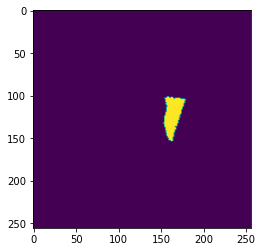

In [210]:
plt.imshow(d['mask'][0])

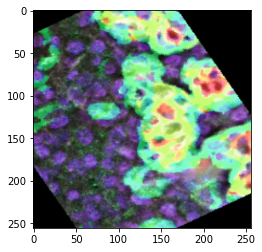

In [211]:
rgb = rearrange(d['rgb'], 'c h w -> h w c')
rgb -= rgb.min()
rgb /= rgb.max()
plt.imshow(rgb)

In [212]:
d['y']

tensor([0., 0., 1.])

In [213]:
d['X']

tensor([-0.3635, -0.1066,  2.1844,  1.3373,  2.9858,  3.2865,  5.0494,  5.6968,
         6.3058])

In [214]:
train_ds.label_to_idx

{'dcis': 0, 'idc': 1, 'normal': 2}

In [ ]:
for i in range(10):
    d = val_ds[i]
    rgb = rearrange(d['rgb'], 'c h w -> h w c')
    rgb -= rgb.min()
    rgb /= rgb.max()
    plt.imshow(rgb)
    plt.title(d['y'])
    plt.show()

In [216]:
torch.save(train_ds, os.path.join(dataset_dir, 'train_ds.pt'))
torch.save(val_ds, os.path.join(dataset_dir, 'val_ds.pt'))
torch.save(pred_ds, os.path.join(dataset_dir, 'pred_ds.pt'))

In [438]:
ds = torch.load(os.path.join(dataset_dir, 'train_ds.pt'))

In [439]:
d = ds[-5]

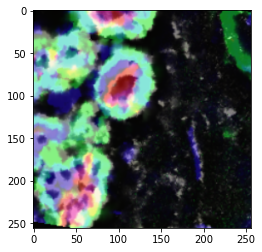

In [440]:
rgb = rearrange(d['rgb'], 'c h w -> h w c')
rgb -= rgb.min()
rgb /= rgb.max()
plt.imshow(rgb)

In [478]:
d['mask'].dtype

torch.float32

#### classifier region analysis

In [297]:
prob_df = pd.read_csv(
    '/diskmnt/Projects/Users/estorrs/multiplex_data/analysis/dcis_region_analysis/classifier_v1/results/probs.txt',
    sep='\t', index_col=0)
cols = prob_df.columns
prob_df.columns = [f'prob_{c}' for c in prob_df.columns]
prob_df['predicted_label'] = [cols[i] for i in np.argmax(prob_df.values, axis=-1)]
prob_df

,prob_dcis,prob_idc,prob_normal,predicted_label
region_id,,,,
HT397B1-H3A1_516,0.000235,0.000154,0.999610,normal
HT206B1-H1_85,0.000054,0.999938,0.000008,idc
HT323B1-H1A4_1341,0.008480,0.988422,0.003098,idc
HT323B1-H1A4_938,0.000278,0.000183,0.999539,normal
HT323B1-H1A1_803,0.050103,0.935101,0.014795,idc
...,...,...,...,...
HT206B1_H1_06252022_317,0.001995,0.997492,0.000512,idc
HT323B1-H1A1_1781,0.003362,0.995733,0.000905,idc
HT323B1-H1A1_1585,0.052838,0.041085,0.906077,normal


In [298]:
combined = combined[[c for c in combined.columns if c not in ['prob_dcis', 'prob_idc', 'prob_normal', 'predicted_label']]]
combined = pd.merge(combined, prob_df, left_index=True, right_index=True, how='left')
combined

,boundary_area,boundary_bbox-0,boundary_bbox-1,boundary_bbox-2,boundary_bbox-3,boundary_cell_type_CD4 T cell_cell_fraction,boundary_cell_type_CD8 T cell_cell_fraction,boundary_cell_type_Endothelial_cell_fraction,boundary_cell_type_Fibroblast_cell_fraction,boundary_cell_type_Macrophage - M1_cell_fraction,...,region_metacluster_Tumor Boundary - Stroma Enriched 2_cell_fraction,region_metacluster_Tumor_cell_fraction,region_perimeter,region_voronoi_entropy,sample,region_type,prob_dcis,prob_idc,prob_normal,predicted_label
HT206B1-H1_1,288848,0,3292,428,4858,0.000000,0.018519,0.018519,0.129630,0.018519,...,0.000000,0.996296,2983.010460,1.422960,HT206B1-H1,unclassified,7.027152e-03,0.990834,2.138557e-03,idc
HT206B1-H1_2,3584904,0,5869,3535,10328,0.044394,0.057562,0.096689,0.257336,0.118886,...,0.013660,0.952189,41180.726733,1.544055,HT206B1-H1,idc,9.232326e-07,0.999999,8.276145e-08,idc
HT206B1-H1_3,294295,0,10215,922,11262,0.042254,0.000000,0.103286,0.333333,0.140845,...,0.009259,0.953704,3535.511252,1.452809,HT206B1-H1,idc,1.381439e-04,0.999838,2.393602e-05,idc
HT206B1-H1_4,35898,0,11124,174,11449,0.000000,0.000000,0.052632,0.315789,0.210526,...,0.428571,0.142857,318.509668,0.000000,HT206B1-H1,unclassified,4.453982e-02,0.434310,5.211499e-01,normal
HT206B1-H1_5,646084,0,10536,1373,12334,0.044118,0.026961,0.068627,0.223039,0.122549,...,0.011209,0.977582,7239.408327,1.538911,HT206B1-H1,idc,1.346348e-04,0.999849,1.599994e-05,idc
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HT397B1-H3A1_807,34432,19286,8942,19515,9160,0.428571,0.267857,0.000000,0.071429,0.053571,...,0.000000,0.000000,30.142136,NaN,HT397B1-H3A1,unclassified,5.887796e-04,0.999287,1.245038e-04,idc
HT397B1-H3A1_808,100067,19336,11047,19698,11420,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,198.877200,NaN,HT397B1-H3A1,unclassified,2.876195e-03,0.996355,7.683965e-04,idc
HT397B1-H3A1_809,78991,19796,2050,20113,2371,0.000000,0.000000,0.222222,0.222222,0.000000,...,0.000000,0.000000,56.769553,NaN,HT397B1-H3A1,unclassified,1.204924e-03,0.998515,2.801900e-04,idc
HT397B1-H3A1_810,74758,19859,10591,20160,10903,0.000000,0.000000,0.200000,0.200000,0.000000,...,0.000000,0.000000,33.112698,NaN,HT397B1-H3A1,unclassified,1.090312e-03,0.998660,2.501746e-04,idc


In [299]:
combined['predicted_label'] = ['unclassified' if pd.isnull(x) else x for x in combined['predicted_label']]

In [300]:
def display_legend(cmap, n=50):
    fig, axs = plt.subplots(nrows=1, ncols=len(cmap))
    for i, (name, c) in enumerate(cmap.items()):
        ax = axs[i]
        rect = np.zeros((n, n, 3), dtype=np.float32)
        print(c)
        rect[:, :] = c
        ax.imshow(rect)
        ax.set_title(name)
        ax.set_xticks([])
        ax.set_yticks([])
        
    

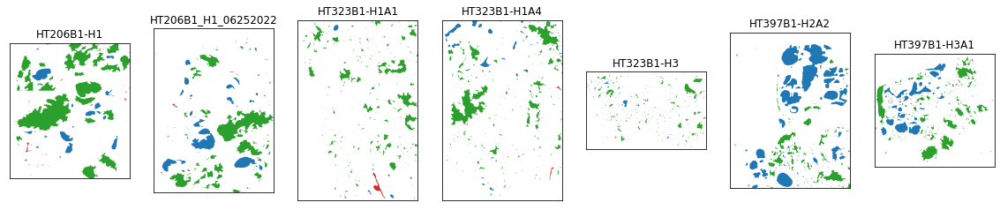

In [301]:
cmap = {x:c for c, x in zip(sns.color_palette('tab10'), set(combined['predicted_label']))}
show_regions(combined, 'predicted_label', cmap=cmap)

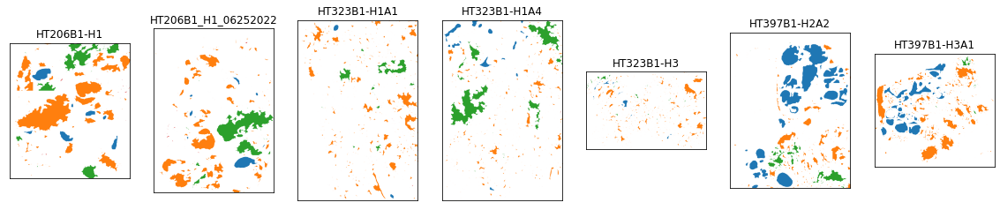

In [246]:
show_regions(combined, 'region_type', cmap=cmap)

(0.12156862745098039, 0.4666666666666667, 0.7058823529411765)
(1.0, 0.4980392156862745, 0.054901960784313725)
(0.17254901960784313, 0.6274509803921569, 0.17254901960784313)
(0.8392156862745098, 0.15294117647058825, 0.1568627450980392)


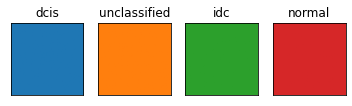

In [243]:
display_legend(cmap)

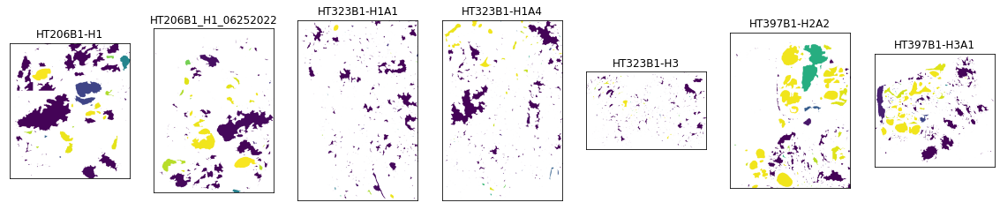

In [302]:
show_regions(combined, 'prob_dcis')

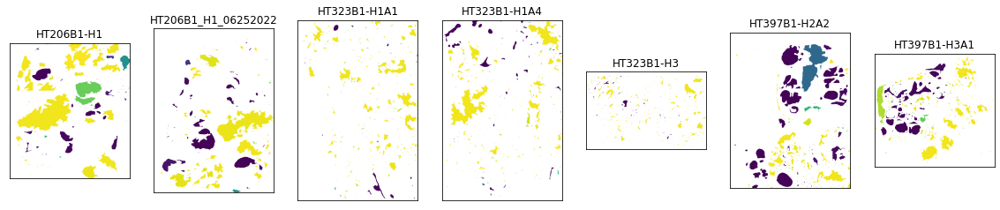

In [303]:
show_regions(combined, 'prob_idc')

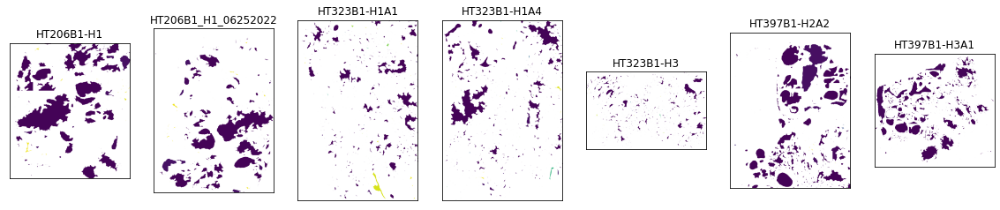

In [304]:
show_regions(combined, 'prob_normal')

In [281]:
cmaps = {}

gradient = np.linspace(0, 1, 256)
gradient = np.vstack((gradient, gradient))
import matplotlib as mpl

def plot_color_gradients(category, cmap_list):
    # Create figure and adjust figure height to number of colormaps
    nrows = len(cmap_list)
    figh = 0.35 + 0.15 + (nrows + (nrows - 1) * 0.1) * 0.22
    fig, axs = plt.subplots(nrows=nrows + 1, figsize=(6.4, figh))
    fig.subplots_adjust(top=1 - 0.35 / figh, bottom=0.15 / figh,
                        left=0.2, right=0.99)
    axs[0].set_title(f'{category} colormaps', fontsize=14)

    for ax, name in zip(axs, cmap_list):
        ax.imshow(gradient, aspect='auto', cmap=mpl.colormaps[name])
        ax.text(-0.01, 0.5, name, va='center', ha='right', fontsize=10,
                transform=ax.transAxes)

    # Turn off *all* ticks & spines, not just the ones with colormaps.
    for ax in axs:
        ax.set_axis_off()

    # Save colormap list for later.
    cmaps[category] = cmap_list

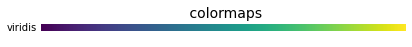

In [282]:
plot_color_gradients('',
                     ['viridis'])

In [310]:
f = combined[combined['region_area']>10000]
f.shape

(1479, 280)

(array([0, 1, 2]),
 [Text(0, 0, 'idc'), Text(1, 0, 'normal'), Text(2, 0, 'dcis')])

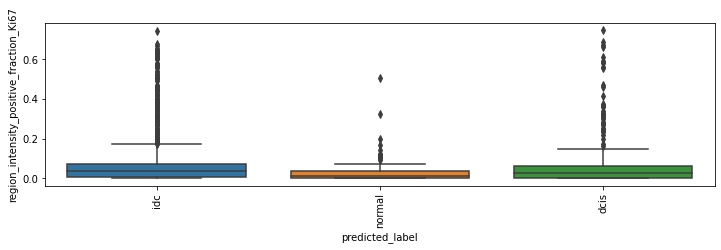

In [311]:
fig, axs = plt.subplots(figsize=(12, 3))
sns.boxplot(data=f, x='predicted_label', y='region_intensity_positive_fraction_Ki67')
plt.xticks(rotation=90)

(array([0, 1, 2]),
 [Text(0, 0, 'idc'), Text(1, 0, 'normal'), Text(2, 0, 'dcis')])

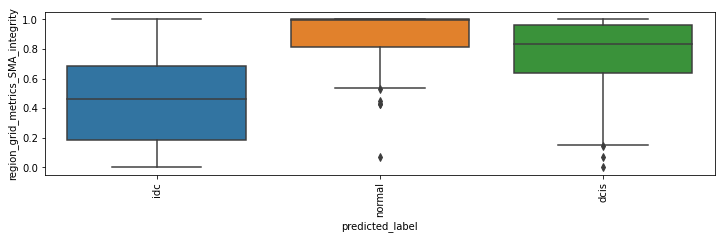

In [312]:
fig, axs = plt.subplots(figsize=(12, 3))
sns.boxplot(data=f, x='predicted_label', y='region_grid_metrics_SMA_integrity')
plt.xticks(rotation=90)

(array([0, 1, 2]),
 [Text(0, 0, 'idc'), Text(1, 0, 'normal'), Text(2, 0, 'dcis')])

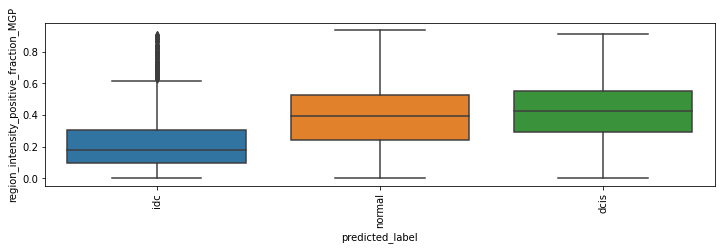

In [313]:
fig, axs = plt.subplots(figsize=(12, 3))
sns.boxplot(data=f, x='predicted_label', y='region_intensity_positive_fraction_MGP')
plt.xticks(rotation=90)

In [314]:
def plot_swarmbox(df, x, y, hue):
    fig, axs = plt.subplots(nrows=2, figsize=(12, 6))
    sns.boxplot(data=df, x=x, y=y, hue=hue, ax=axs[0])
    axs[0].set_xticks([])
    axs[0].set_ylabel('')
    axs[0].set_xlabel('')
    axs[0].legend(bbox_to_anchor=(0, 1), loc='upper left', ncol=1)
    sns.swarmplot(data=df, x=x, y=y, hue=hue, ax=axs[1])
    axs[1].get_legend().remove()
    plt.xticks(rotation=90)

/diskmnt/Projects/Users/estorrs/miniconda3/envs/squidpy/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 31.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/diskmnt/Projects/Users/estorrs/miniconda3/envs/squidpy/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 44.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/diskmnt/Projects/Users/estorrs/miniconda3/envs/squidpy/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 54.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/diskmnt/Projects/Users/estorrs/miniconda3/envs/squidpy/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 58.0% of the points cannot be placed; you may want to decrease the size of the 

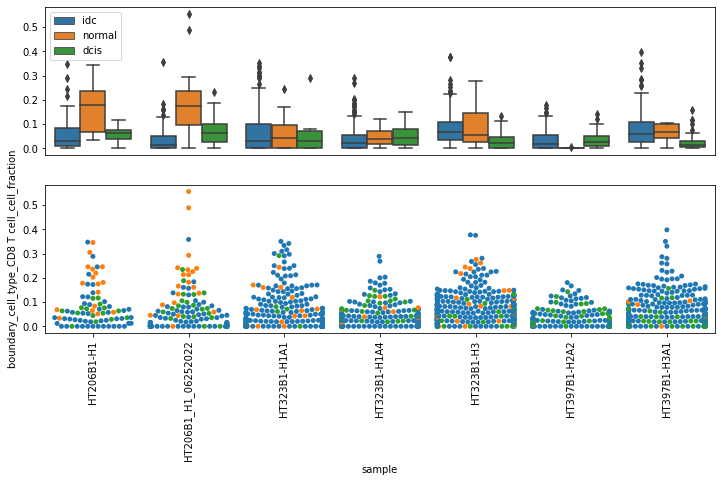

In [315]:
plot_swarmbox(f, 'sample', 'boundary_cell_type_CD8 T cell_cell_fraction', 'predicted_label')

/diskmnt/Projects/Users/estorrs/miniconda3/envs/squidpy/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 7.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/diskmnt/Projects/Users/estorrs/miniconda3/envs/squidpy/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 23.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/diskmnt/Projects/Users/estorrs/miniconda3/envs/squidpy/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 15.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


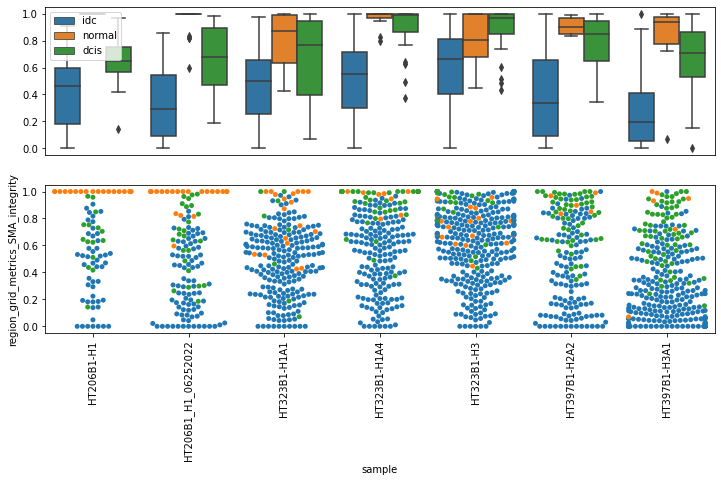

In [316]:
plot_swarmbox(f, 'sample', 'region_grid_metrics_SMA_integrity', 'predicted_label')

/diskmnt/Projects/Users/estorrs/miniconda3/envs/squidpy/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 5.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/diskmnt/Projects/Users/estorrs/miniconda3/envs/squidpy/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 74.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/diskmnt/Projects/Users/estorrs/miniconda3/envs/squidpy/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 71.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/diskmnt/Projects/Users/estorrs/miniconda3/envs/squidpy/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 69.9% of the points cannot be placed; you may want to decrease the size of the m

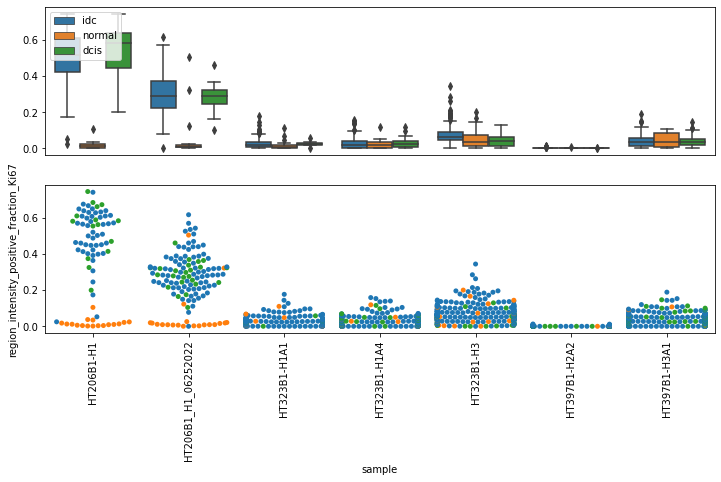

In [317]:
plot_swarmbox(f, 'sample', 'region_intensity_positive_fraction_Ki67', 'predicted_label')

/diskmnt/Projects/Users/estorrs/miniconda3/envs/squidpy/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 10.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/diskmnt/Projects/Users/estorrs/miniconda3/envs/squidpy/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 31.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/diskmnt/Projects/Users/estorrs/miniconda3/envs/squidpy/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 27.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/diskmnt/Projects/Users/estorrs/miniconda3/envs/squidpy/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 40.3% of the points cannot be placed; you may want to decrease the size of the 

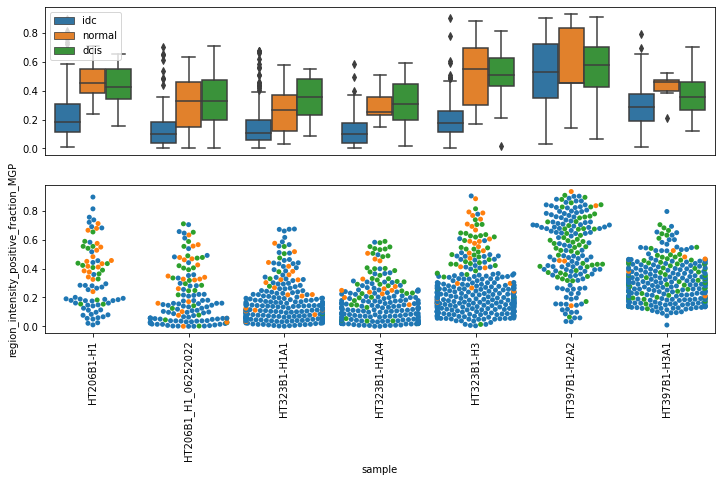

In [318]:
plot_swarmbox(f, 'sample', 'region_intensity_positive_fraction_MGP', 'predicted_label')

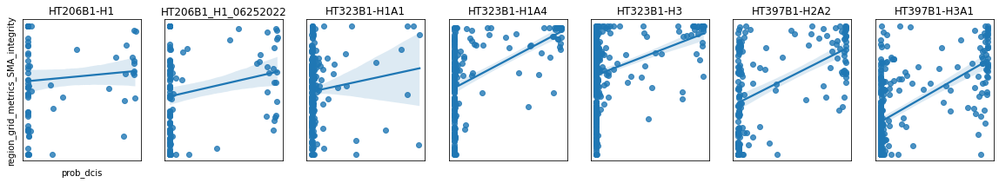

In [319]:
fig, axs = plt.subplots(nrows=1, ncols=len(sample_to_imgs), figsize=(20, 3))
for i, (s, ax) in enumerate(zip(sample_to_imgs, axs)):
    fs = f[f['sample']==s]
    sns.regplot(data=fs, x='prob_dcis', y='region_grid_metrics_SMA_integrity', ax=ax)
    ax.set_title(s)
    
    ax.set_xticks([])
    ax.set_yticks([])
    if i != 0:
        ax.set_ylabel('')
        ax.set_xlabel('')

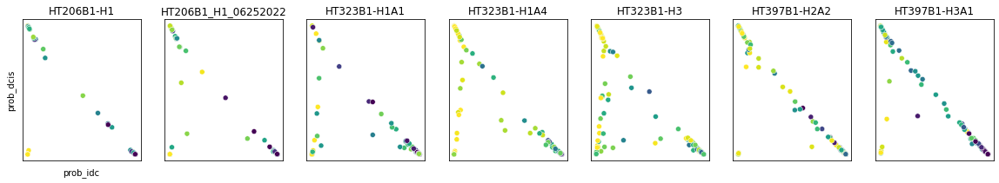

In [320]:
fig, axs = plt.subplots(nrows=1, ncols=len(sample_to_imgs), figsize=(20, 3))
for i, (s, ax) in enumerate(zip(sample_to_imgs, axs)):
    fs = f[f['sample']==s]
    sns.scatterplot(data=fs, x='prob_idc', y='prob_dcis', hue='region_grid_metrics_SMA_integrity', ax=ax, palette='viridis')
    ax.set_title(s)
    
    ax.set_xticks([])
    ax.set_yticks([])
    ax.get_legend().remove()
    
    if i != 0:
        ax.set_ylabel('')
        ax.set_xlabel('')

In [256]:
sorted(f.columns)

['boundary_area',
 'boundary_bbox-0',
 'boundary_bbox-1',
 'boundary_bbox-2',
 'boundary_bbox-3',
 'boundary_cell_type_CD4 T cell_cell_fraction',
 'boundary_cell_type_CD8 T cell_cell_fraction',
 'boundary_cell_type_Endothelial_cell_fraction',
 'boundary_cell_type_Fibroblast_cell_fraction',
 'boundary_cell_type_Macrophage - M1_cell_fraction',
 'boundary_cell_type_Macrophage - M2_cell_fraction',
 'boundary_cell_type_Myoepithelial_cell_fraction',
 'boundary_cell_type_Noise_cell_fraction',
 'boundary_cell_type_Tumor_cell_fraction',
 'boundary_centroid-0',
 'boundary_centroid-1',
 'boundary_compactness',
 'boundary_eccentricity',
 'boundary_extent',
 'boundary_intensity_overlap_E-cadherin_Ki67',
 'boundary_intensity_overlap_E-cadherin_MGP',
 'boundary_intensity_overlap_E-cadherin_Pan-CK',
 'boundary_intensity_overlap_E-cadherin_Podoplanin',
 'boundary_intensity_overlap_E-cadherin_SMA',
 'boundary_intensity_overlap_Ki67_MGP',
 'boundary_intensity_overlap_Ki67_Pan-CK',
 'boundary_intensity_ov

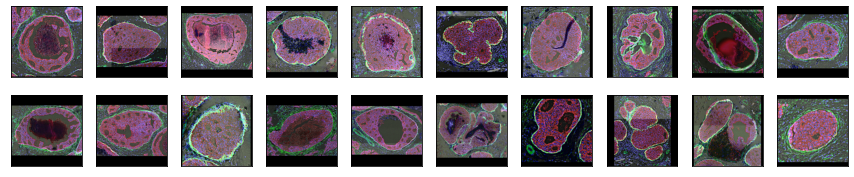

In [329]:
fig, axs = plt.subplots(nrows=2, ncols=10, figsize=(15, 3))
axs = axs.flatten()
for r, ax in zip(combined.sort_values('prob_dcis', ascending=False).index[:20], axs):
    ax.imshow(region_to_cls_imgs[r]['rgb'])
#     ax.set_title(r)
    ax.set_xticks([])
    ax.set_yticks([])

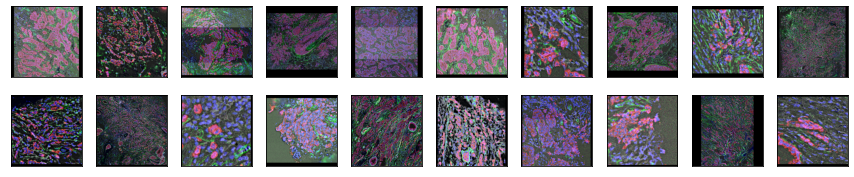

In [330]:
fig, axs = plt.subplots(nrows=2, ncols=10, figsize=(15, 3))
axs = axs.flatten()
for r, ax in zip(combined.sort_values('prob_idc', ascending=False).index[:20], axs):
    ax.imshow(region_to_cls_imgs[r]['rgb'])
#     ax.set_title(r)
    ax.set_xticks([])
    ax.set_yticks([])

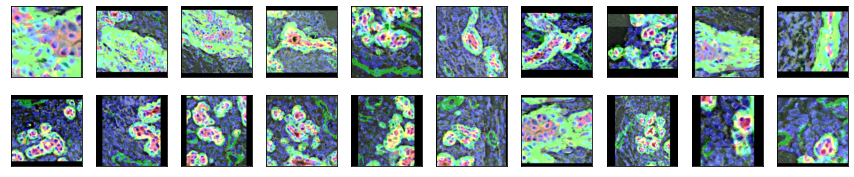

In [331]:
fig, axs = plt.subplots(nrows=2, ncols=10, figsize=(15, 3))
axs = axs.flatten()
for r, ax in zip(combined.sort_values('prob_normal', ascending=False).index[:20], axs):
    ax.imshow(region_to_cls_imgs[r]['rgb'])
#     ax.set_title(r)
    ax.set_xticks([])
    ax.set_yticks([])

In [326]:
axs.flatten()

array([<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:>], dtype=object)

## Angelo

In [3]:
directory = '/diskmnt/Projects/Users/estorrs/multiplex_data/analysis/dcis_region_analysis/angelo_v4'


In [4]:
fps = sorted(listfiles(directory, regex='region_metrics.txt$'))
fps

['/diskmnt/Projects/Users/estorrs/multiplex_data/analysis/dcis_region_analysis/angelo_v4/Point2203/outputs/region_metrics.txt',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/analysis/dcis_region_analysis/angelo_v4/Point2204/outputs/region_metrics.txt',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/analysis/dcis_region_analysis/angelo_v4/Point2206/outputs/region_metrics.txt',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/analysis/dcis_region_analysis/angelo_v4/Point2302/outputs/region_metrics.txt',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/analysis/dcis_region_analysis/angelo_v4/Point2303/outputs/region_metrics.txt',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/analysis/dcis_region_analysis/angelo_v4/Point2304/outputs/region_metrics.txt',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/analysis/dcis_region_analysis/angelo_v4/Point2305/outputs/region_metrics.txt',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/analysis/dcis_region_analysis/angelo_v4/Point2306/outpu

In [5]:
sample_to_df = {}
for fp in fps:
    sample = fp.split('/')[-3]
    df = pd.read_csv(fp, sep='\t', index_col=0)
    df['sample'] = sample
    df.index = [f'{sample}_{i}' for i, s in zip(df.index, df['sample'])]
    
    sample_to_df[sample] = df
    
cols = sorted({c for df in sample_to_df.values() for c in df.columns})
combined = None
for s, df in sample_to_df.items():
    missing = set(cols) - set(df.columns)
    for c in missing:
        df[c] = np.nan
    df = df[cols]
    
    if combined is None:
        combined = df
    else:
        combined = pd.concat((combined, df), axis=0)
        
combined

,boundary_area,boundary_bbox-0,boundary_bbox-1,boundary_bbox-2,boundary_bbox-3,boundary_cell_type_APC_cell_fraction,boundary_cell_type_BCELL_cell_fraction,boundary_cell_type_CAF_cell_fraction,boundary_cell_type_CD4T_cell_fraction,boundary_cell_type_CD8T_cell_fraction,...,region_intensity_overlap_ECAD_PanKRT,region_intensity_overlap_ECAD_SMA,region_intensity_overlap_PanKRT_SMA,region_intensity_positive_fraction_CK5,region_intensity_positive_fraction_CK7,region_intensity_positive_fraction_ECAD,region_intensity_positive_fraction_PanKRT,region_intensity_positive_fraction_SMA,region_perimeter,sample
Point2203_1,175653,0,347,1024,725,0.011111,0.000000,0.111111,0.000000,0.022222,...,0.170728,0.004055,0.005953,0.008499,0.116563,0.195354,0.540976,0.008829,3060.739249,Point2203
Point2204_1,108756,0,392,341,918,0.024390,0.000000,0.000000,0.000000,0.012195,...,0.010678,0.000000,0.000000,0.005981,0.142495,0.014564,0.430695,0.000000,738.014285,Point2204
Point2204_2,73987,424,0,747,279,0.166667,0.000000,0.138889,0.000000,0.097222,...,0.053659,0.000000,0.000000,0.000000,0.219512,0.058537,0.517073,0.000000,59.012193,Point2204
Point2204_3,152823,586,233,1024,813,0.027778,0.000000,0.152778,0.013889,0.013889,...,0.216291,0.000094,0.002199,0.026775,0.372593,0.229137,0.699331,0.003816,1066.246825,Point2204
Point2204_4,43529,806,0,1024,286,0.000000,0.000000,0.000000,0.000000,0.090909,...,0.132171,0.000000,0.000000,0.000000,0.447496,0.137644,0.721265,0.000000,496.066017,Point2204
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Point6204_12,28640,479,419,684,627,0.047619,0.000000,0.047619,0.047619,0.047619,...,0.511111,0.222222,0.288889,0.111111,0.533333,0.555556,0.755556,0.377778,32.727922,Point6204
Point6204_13,89514,567,0,1024,877,0.000000,0.000000,0.111111,0.066667,0.022222,...,0.438646,0.017119,0.022823,0.013710,0.422381,0.461935,0.819972,0.026357,2044.322943,Point6204
Point6204_14,67115,608,539,898,950,0.069767,0.139535,0.000000,0.023256,0.023256,...,0.367853,0.059029,0.062012,0.223468,0.624126,0.403435,0.753291,0.096051,486.132034,Point6204
Point6206_1,198693,0,0,712,871,0.125926,0.007407,0.022222,0.007407,0.007407,...,0.271042,0.005502,0.009618,0.011066,0.370367,0.302771,0.570869,0.010752,2747.366666,Point6206


In [6]:
list(combined.columns)

['boundary_area',
 'boundary_bbox-0',
 'boundary_bbox-1',
 'boundary_bbox-2',
 'boundary_bbox-3',
 'boundary_cell_type_APC_cell_fraction',
 'boundary_cell_type_BCELL_cell_fraction',
 'boundary_cell_type_CAF_cell_fraction',
 'boundary_cell_type_CD4T_cell_fraction',
 'boundary_cell_type_CD8T_cell_fraction',
 'boundary_cell_type_DC_cell_fraction',
 'boundary_cell_type_ENDO_cell_fraction',
 'boundary_cell_type_FIBRO_VIMonly_cell_fraction',
 'boundary_cell_type_IMMUNEOTHER_cell_fraction',
 'boundary_cell_type_MACS_cell_fraction',
 'boundary_cell_type_MAST_cell_fraction',
 'boundary_cell_type_MONODC_cell_fraction',
 'boundary_cell_type_MONO_cell_fraction',
 'boundary_cell_type_MYOEP_cell_fraction',
 'boundary_cell_type_MYOFIBRO_cell_fraction',
 'boundary_cell_type_NEUT_cell_fraction',
 'boundary_cell_type_NORMFIBRO_cell_fraction',
 'boundary_cell_type_OTHER_cell_fraction',
 'boundary_cell_type_TCELL_cell_fraction',
 'boundary_cell_type_TUMOR_CK5_cell_fraction',
 'boundary_cell_type_TUMOR_ECA

In [7]:
{x.split('_')[0] for x in combined.columns}

{'boundary', 'expanded', 'myoepi', 'region', 'sample'}

In [8]:
region_types = ['boundary', 'expanded', 'myoepi', 'region']
weighted_mean = lambda x: np.average(x, weights=df.loc[x.index, "area"])

ignore = ['area', 'bbox', 'centroid', 'perimeter', 'grid_metrics']
# reduce to slide level
reduced = None
for rt in region_types:
    weighted_mean = lambda x: np.average(x, weights=combined.loc[x.index, f"{rt}_area"])
    cols = [c for c in combined.columns if rt == c.split('_')[0]]
    cols = [c for c in cols if not any([x in c for x in ignore])]
    cols.append('sample')
    f = combined[cols]
    f = f.replace(np.nan, 0.) # bug fixed in pipeline soon
    f = f.groupby('sample').agg(weighted_mean)
    
    sums = combined[['sample', f'{rt}_area', f'{rt}_perimeter']]
    sums = sums.groupby('sample').sum()
    f = pd.concat((f, sums), axis=1)
    
    if rt == 'myoepi':
        cols = [c for c in combined.columns if 'grid_metrics' in c]
        cols.append('sample')
        grid = combined[cols]
        grid = grid.replace(np.nan, 0.)
        grid = grid.groupby('sample').agg(weighted_mean)
        f = pd.concat((f, grid), axis=1)

    if reduced is None:
        reduced = f
    else:
        reduced = pd.concat((reduced, f), axis=1)
reduced

,boundary_cell_type_APC_cell_fraction,boundary_cell_type_BCELL_cell_fraction,boundary_cell_type_CAF_cell_fraction,boundary_cell_type_CD4T_cell_fraction,boundary_cell_type_CD8T_cell_fraction,boundary_cell_type_DC_cell_fraction,boundary_cell_type_ENDO_cell_fraction,boundary_cell_type_FIBRO_VIMonly_cell_fraction,boundary_cell_type_IMMUNEOTHER_cell_fraction,boundary_cell_type_MACS_cell_fraction,...,region_intensity_overlap_ECAD_PanKRT,region_intensity_overlap_ECAD_SMA,region_intensity_overlap_PanKRT_SMA,region_intensity_positive_fraction_CK5,region_intensity_positive_fraction_CK7,region_intensity_positive_fraction_ECAD,region_intensity_positive_fraction_PanKRT,region_intensity_positive_fraction_SMA,region_area,region_perimeter
sample,,,,,,,,,,,,,,,,,,,,,
Point2203,0.011111,0.000000,0.111111,0.000000,0.022222,0.000000,0.088889,0.022222,0.000000,0.011111,...,0.170728,0.004055,0.005953,0.008499,0.116563,0.195354,0.540976,0.008829,489966,3060.739249
Point2204,0.050723,0.000000,0.088695,0.005599,0.038511,0.000000,0.091761,0.142025,0.033324,0.013553,...,0.149057,0.000058,0.001355,0.018211,0.313548,0.158617,0.624135,0.002351,103343,2359.339321
Point2206,0.108232,0.000000,0.090643,0.024176,0.014002,0.014755,0.064720,0.017619,0.018026,0.002050,...,0.182674,0.008100,0.003932,0.002846,0.052232,0.331188,0.352941,0.016210,434922,5413.871642
Point2302,0.010101,0.000000,0.000000,0.000000,0.000000,0.000000,0.010101,0.141414,0.060606,0.000000,...,0.030668,0.000110,0.000348,0.000138,0.127431,0.032578,0.505408,0.000477,356037,2506.839754
Point2303,0.023077,0.002564,0.012821,0.356413,0.035898,0.017949,0.028205,0.062677,0.018518,0.023077,...,0.171977,0.032812,0.054172,0.062160,0.365809,0.183250,0.431730,0.073615,406740,4526.970055
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Point6201,0.005646,0.000000,0.004197,0.017450,0.063985,0.001409,0.044288,0.113072,0.003917,0.014640,...,0.186653,0.005309,0.006653,0.033601,0.261771,0.231532,0.492192,0.010674,377101,9271.768717
Point6202,0.035611,0.006153,0.006153,0.000000,0.012305,0.018458,0.041764,0.056309,0.011001,0.222094,...,0.081753,0.000287,0.000752,0.016328,0.004361,0.104453,0.317763,0.004534,682002,6022.634052
Point6203,0.007120,0.000000,0.001861,0.001861,0.000000,0.001861,0.017329,0.055404,0.004012,0.007047,...,0.205664,0.007219,0.006622,0.000157,0.000519,0.408757,0.328426,0.012946,190874,5482.036431


In [9]:
list(reduced.columns)

['boundary_cell_type_APC_cell_fraction',
 'boundary_cell_type_BCELL_cell_fraction',
 'boundary_cell_type_CAF_cell_fraction',
 'boundary_cell_type_CD4T_cell_fraction',
 'boundary_cell_type_CD8T_cell_fraction',
 'boundary_cell_type_DC_cell_fraction',
 'boundary_cell_type_ENDO_cell_fraction',
 'boundary_cell_type_FIBRO_VIMonly_cell_fraction',
 'boundary_cell_type_IMMUNEOTHER_cell_fraction',
 'boundary_cell_type_MACS_cell_fraction',
 'boundary_cell_type_MAST_cell_fraction',
 'boundary_cell_type_MONODC_cell_fraction',
 'boundary_cell_type_MONO_cell_fraction',
 'boundary_cell_type_MYOEP_cell_fraction',
 'boundary_cell_type_MYOFIBRO_cell_fraction',
 'boundary_cell_type_NEUT_cell_fraction',
 'boundary_cell_type_NORMFIBRO_cell_fraction',
 'boundary_cell_type_OTHER_cell_fraction',
 'boundary_cell_type_TCELL_cell_fraction',
 'boundary_cell_type_TUMOR_CK5_cell_fraction',
 'boundary_cell_type_TUMOR_ECADCK_cell_fraction',
 'boundary_cell_type_TUMOR_EMT_cell_fraction',
 'boundary_cell_type_TUMOR_LUMI

In [10]:
meta = pd.read_csv(
    '../../multiplex_data/mibi/angelo/d87vg86zd8-3/Tissue_Feature_Data/Table_S1_Patient_Feature_Table.csv',
    index_col='PointNumber'
)
meta.index = [f'Point{x}' for x in meta.index]
meta


,TMAD_Patient,Patient_ID,LDA_Type,Tissue_Type,Status,RAHBT_Patient_Number,RAHBT_Case_Group,RAHBT_case_identifier,CohortNumber,TMAD_ID,...,Neighborhood_frequency_clust1,Neighborhood_frequency_clust2,Neighborhood_frequency_clust3,Neighborhood_frequency_clust4,Neighborhood_frequency_clust5,Neighborhood_frequency_clust6,Neighborhood_frequency_clust7,Neighborhood_frequency_clust8,Neighborhood_frequency_clust9,Neighborhood_frequency_clust10
Point2203,31606,1072,DCIS,DCIS,nonprogressor,43189A0000_01,43181A0000,43189A0000,3,TA502,...,0.091362,0.470100,0.078073,0.001661,0.034884,0.003322,0.093023,0.127907,0.043189,0.056478
Point2204,31605,1071,DCIS,DCIS,nonprogressor,43906A0000_01,43158A0000,43906A0000,4,TA502,...,0.226879,0.184971,0.001445,0.004335,0.024566,0.083815,0.080925,0.015896,0.000000,0.377168
Point2206,31620,1116,DCIS,DCIS,nonprogressor,43175A0000_01,43141A0000,43175A0000,5,TA502,...,0.022418,0.400320,0.017614,0.005604,0.016013,0.096878,0.181745,0.086469,0.000801,0.172138
Point2302,20671,1046,DCIS,DCIS,nonprogressor,44914D0000_01,43042A0000,44914D0000,7,TA501,...,0.261339,0.352052,0.004320,0.000000,0.000000,0.066955,0.138229,0.028078,0.000000,0.149028
Point2303,20672,1047,DCIS,DCIS,nonprogressor,43080A0000_01,43033A0000,43080A0000,8,TA501,...,0.012245,0.096599,0.231293,0.291156,0.000000,0.061224,0.069388,0.122449,0.024490,0.091156
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Point6201,20597,1027,DCIS,DCIS,progressor,41212A0000_01,41212A0000,41212A0000,156,TA500,...,0.034591,0.108491,0.029874,0.000000,0.006289,0.303459,0.220126,0.103774,0.067610,0.125786
Point6202,20594,1026,DCIS,DCIS,progressor,42271J0000_01,42271J0000,42271J0000,157,TA500,...,0.011765,0.319328,0.000000,0.001681,0.000000,0.179832,0.401681,0.010084,0.010084,0.065546
Point6203,31568,1107,DCIS,DCIS,progressor,43247A0000_01,43247A0000,43247A0000,158,TA502,...,0.036004,0.360036,0.037804,0.000900,0.019802,0.085509,0.308731,0.098110,0.000000,0.053105
Point6204,31580,1145,DCIS,DCIS,progressor,43158A0000_01,43158A0000,43158A0000,159,TA502,...,0.064889,0.367111,0.136000,0.000000,0.047111,0.080889,0.124444,0.057778,0.023111,0.098667


In [11]:
list(meta.columns)

['TMAD_Patient',
 'Patient_ID',
 'LDA_Type',
 'Tissue_Type',
 'Status',
 'RAHBT_Patient_Number',
 'RAHBT_Case_Group',
 'RAHBT_case_identifier',
 'CohortNumber',
 'TMAD_ID',
 'WASHU_ID',
 'Row',
 'Column',
 'Years_Since_First_CIS',
 'First_Event',
 'Days_To_First_Event',
 'Age',
 'SUBTYPE',
 'Full_Point_Name',
 'SHS_sample_ID',
 'SHS_sample_type',
 'Patient_ID_Siri',
 'LCM_Diagnosis',
 'Subtype',
 'Diagnostic_Group',
 'Sample_Type',
 'Months_of_Follow_Up',
 'PAM50',
 'IC10_RNA',
 'DNA_sample',
 'Treatment',
 'DCIS_grade',
 'Necrosis',
 'Comedo_status',
 'Architecture',
 'epi_area',
 'stroma_area',
 'Total_cells',
 'Total_tumor_cells',
 'Total_immune_cells',
 'Total_fibroblast_cells',
 'Total_endothelial_cells',
 'Total_myoep_cells',
 'tumor_shannon',
 'myoep_shannon',
 'fibro_shannon',
 'immune_shannon',
 'Wholeimage_density_log2fc_myeloid_to_lymphoid',
 'Wholeimage_ratio_CD4CD8_corrected',
 'Emask_density_total_tumor',
 'Emask_density_APC',
 'Emask_density_BCELL',
 'Emask_density_CD4T'

#### DCIS vs IDC

###### lda

In [34]:
set(meta['Tissue_Type'])

{'DCIS', 'IDC', 'ILC', 'normal'}

In [35]:
set(meta['LDA_Type'])

{'DCIS', 'IBC', 'normal'}

In [41]:
include = meta[meta['LDA_Type']!='normal'].index.to_list()
len(include)

70

In [40]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.preprocessing import StandardScaler

In [39]:
lda = LinearDiscriminantAnalysis()

In [43]:
X = StandardScaler().fit_transform(reduced.loc[include].values)
y = np.asarray([0 if label == 'DCIS' else 1 for label in meta.loc[include]['LDA_Type']])
X.shape, y.shape

((70, 138), (70,))

In [50]:
lda.fit(X, y)

LinearDiscriminantAnalysis()

In [46]:
lda.coef_

array([[ -5.96520078,   1.21500499,  -4.83606495,  -3.55091017,
         -2.36220177,   0.47050218,  -1.08423789,  -5.8217638 ,
         -0.4935953 ,  -2.5474487 ,  -5.89789639,   4.03957169,
          1.35033761,   3.91787978,   0.55009293,   2.09838633,
          3.23707142,  10.49863175,  -9.54107013,   3.81074302,
         -3.3715123 ,  -0.69270023,   4.71449871,   3.26027096,
         -2.96818629,  -6.1390824 ,   0.17359515,   1.37985447,
          1.75546639,   1.959084  ,   2.22874166,  -1.68282538,
          3.10992641,   7.49569915,   1.76499245,   1.30720603,
          1.83043375,   4.13013027,  -1.30176187,   3.57849763,
         -2.44526077,   0.89131792,   5.54780394,  -4.55374938,
        -11.3316268 ,  -9.56227387,  -5.70383768,  -1.63113189,
          0.35134026,  11.22370702,   4.83832595,   0.68730181,
          1.55687441,  -1.48261134,   4.43482334,  -4.55431877,
         -5.58801881,  -7.02253242,   2.63812892,  -3.59669929,
          0.89140875,   3.83437394,   7.

In [51]:
tups = [(k, v) for k, v in zip(reduced.columns, lda.coef_[0])]
tups = sorted(tups, key=lambda x: x[1])
tups

[('myoepi_cell_type_OTHER_cell_fraction', -11.58589530166785),
 ('expanded_cell_type_MYOEP_cell_fraction', -11.331626801209378),
 ('region_intensity_positive_fraction_PanKRT', -10.646628685886967),
 ('expanded_cell_type_MYOFIBRO_cell_fraction', -9.562273866109706),
 ('boundary_cell_type_TCELL_cell_fraction', -9.541070130993779),
 ('region_compactness', -9.43614758858563),
 ('myoepi_cell_type_CAF_cell_fraction', -8.667398990752034),
 ('expanded_intensity_overlap_PanKRT_SMA', -7.022532417825866),
 ('myoepi_cell_type_NEUT_cell_fraction', -6.657379756643664),
 ('region_cell_type_OTHER_cell_fraction', -6.240124718943152),
 ('boundary_extent', -6.139082403506694),
 ('boundary_cell_type_APC_cell_fraction', -5.965200782546699),
 ('boundary_cell_type_MAST_cell_fraction', -5.897896394620214),
 ('boundary_cell_type_FIBRO_VIMonly_cell_fraction', -5.821763797148442),
 ('expanded_cell_type_NEUT_cell_fraction', -5.703837675376877),
 ('myoepi_cell_type_TUMOR_EMT_cell_fraction', -5.617388639398642),
 (

In [52]:
include = meta[meta['LDA_Type']=='DCIS'].index.to_list()
X = StandardScaler().fit_transform(reduced.loc[include].values)
y = np.asarray([0 if label == 'nonprogressor' else 1 for label in meta.loc[include]['Status']])
X.shape, y.shape

((58, 138), (58,))

In [53]:
lda = LinearDiscriminantAnalysis()
lda.fit(X, y)

LinearDiscriminantAnalysis()

In [54]:
tups = [(k, v) for k, v in zip(reduced.columns, lda.coef_[0])]
tups = sorted(tups, key=lambda x: x[1])
tups

[('region_intensity_positive_fraction_PanKRT', -3.4654925932794525),
 ('region_cell_type_NEUT_cell_fraction', -3.1096609342636357),
 ('expanded_cell_type_OTHER_cell_fraction', -2.824086091809093),
 ('boundary_cell_type_TCELL_cell_fraction', -2.6299139561973566),
 ('region_cell_type_MACS_cell_fraction', -2.4093759832607082),
 ('myoepi_cell_type_NEUT_cell_fraction', -2.392842962916505),
 ('myoepi_cell_type_CAF_cell_fraction', -2.349463087553477),
 ('expanded_cell_type_MYOFIBRO_cell_fraction', -2.157987154408638),
 ('boundary_cell_type_MONODC_cell_fraction', -1.9794869235428345),
 ('boundary_cell_type_MAST_cell_fraction', -1.9154767842663885),
 ('myoepi_cell_type_FIBRO_VIMonly_cell_fraction', -1.8377689570508604),
 ('region_cell_type_NORMFIBRO_cell_fraction', -1.7927868115192098),
 ('region_intensity_positive_fraction_SMA', -1.705708695363521),
 ('myoepi_cell_type_MONODC_cell_fraction', -1.6895975970475345),
 ('expanded_intensity_overlap_PanKRT_SMA', -1.600839497211764),
 ('boundary_cell_

###### OLS

In [85]:
feats = reduced[[c for c in reduced.columns if 'expanded' not in c]]
feats

,boundary_cell_type_APC_cell_fraction,boundary_cell_type_BCELL_cell_fraction,boundary_cell_type_CAF_cell_fraction,boundary_cell_type_CD4T_cell_fraction,boundary_cell_type_CD8T_cell_fraction,boundary_cell_type_DC_cell_fraction,boundary_cell_type_ENDO_cell_fraction,boundary_cell_type_FIBRO_VIMonly_cell_fraction,boundary_cell_type_IMMUNEOTHER_cell_fraction,boundary_cell_type_MACS_cell_fraction,...,region_cell_type_TUMOR_EMT_cell_fraction,region_cell_type_TUMOR_LUMINAL_cell_fraction,region_compactness,region_eccentricity,region_extent,region_intensity_overlap_PanKRT_SMA,region_intensity_positive_fraction_PanKRT,region_intensity_positive_fraction_SMA,region_area,region_perimeter
sample,,,,,,,,,,,,,,,,,,,,,
Point2203,0.009615,0.000000,0.076923,0.000000,0.009615,0.000000,0.057692,0.009615,0.000000,0.009615,...,0.010309,0.706186,0.650469,0.861507,0.827029,0.003893,0.537280,0.006531,476792,3034.981890
Point2204,0.014064,0.000000,0.065052,0.005914,0.009989,0.000000,0.082793,0.118253,0.024053,0.000000,...,0.007341,0.817801,0.678001,0.621868,0.724040,0.000115,0.625909,0.000115,86797,2114.137264
Point2206,0.092103,0.000000,0.080279,0.020193,0.006074,0.013954,0.058120,0.016253,0.014448,0.001970,...,0.001524,0.358215,0.342521,0.800005,0.457435,0.004185,0.347247,0.017416,400715,5211.120379
Point2302,0.010204,0.000000,0.000000,0.000000,0.000000,0.000000,0.010204,0.112245,0.061224,0.000000,...,0.037344,0.535270,0.712636,0.771303,0.780042,0.000000,0.493990,0.000000,344333,2464.111832
Point2303,0.019792,0.004398,0.010995,0.277082,0.026389,0.015393,0.024190,0.053910,0.006597,0.019792,...,0.008332,0.549925,0.262173,0.664054,0.537108,0.045370,0.403146,0.062680,372448,4258.987299
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Point6201,0.004663,0.000000,0.003507,0.014187,0.058018,0.001250,0.034853,0.100002,0.003287,0.012427,...,0.000000,0.697902,0.364054,0.832808,0.457329,0.005151,0.480652,0.008491,295840,8130.444728
Point6202,0.024282,0.004066,0.004066,0.000000,0.008132,0.012198,0.028348,0.040203,0.008018,0.184836,...,0.003099,0.006198,0.563900,0.647578,0.747709,0.000716,0.311841,0.004589,644839,5823.184305
Point6203,0.004612,0.000000,0.002306,0.002306,0.000000,0.002306,0.019117,0.037015,0.004946,0.009893,...,0.017815,0.000000,0.182122,0.896162,0.375184,0.006573,0.326502,0.012468,143169,4518.766266


In [55]:
import statsmodels.api as sm

In [86]:
include = meta[meta['LDA_Type']=='DCIS'].index.to_list()
X = StandardScaler().fit_transform(feats.loc[include].values)
y = np.asarray([0 if label == 'nonprogressor' else 1 for label in meta.loc[include]['Status']])
X.shape, y.shape

((58, 107), (58,))

In [87]:

X_df = pd.DataFrame(data=X, columns=feats.columns)
model = sm.OLS(y, X_df)
results = model.fit()

In [88]:
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                      y   R-squared (uncentered):                   0.759
Model:                            OLS   Adj. R-squared (uncentered):            -13.000
Method:                 Least Squares   F-statistic:                            0.05514
Date:                Thu, 05 Jan 2023   Prob (F-statistic):                        1.00
Time:                        09:47:45   Log-Likelihood:                         0.14193
No. Observations:                  58   AIC:                                      113.7
Df Residuals:                       1   BIC:                                      231.2
Df Model:                          57                                                  
Covariance Type:            nonrobust                                                  
=========================================================================================================================
                                                            coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------------------------
boundary_cell_type_APC_cell_fraction                      0.0227      0.507      0.045      0.971      -6.414       6.460
boundary_cell_type_BCELL_cell_fraction                    0.1047      0.323      0.325      0.800      -3.994       4.203
boundary_cell_type_CAF_cell_fraction                      0.0772      0.504      0.153      0.903      -6.322       6.477
boundary_cell_type_CD4T_cell_fraction                    -0.0540      0.362     -0.149      0.906      -4.654       4.546
boundary_cell_type_CD8T_cell_fraction                    -0.1051      0.468     -0.225      0.859      -6.047       5.837
boundary_cell_type_DC_cell_fraction                      -0.3222      0.602     -0.535      0.687      -7.972       7.327
boundary_cell_type_ENDO_cell_fraction                    -0.1329      0.486     -0.274      0.830      -6.305       6.039
boundary_cell_type_FIBRO_VIMonly_cell_fraction           -0.0065      0.444     -0.015      0.991      -5.652       5.639
boundary_cell_type_IMMUNEOTHER_cell_fraction              0.1416      0.383      0.369      0.775      -4.731       5.014
boundary_cell_type_MACS_cell_fraction                     0.1069      0.348      0.307      0.810      -4.314       4.528
boundary_cell_type_MAST_cell_fraction                     0.1540      0.527      0.292      0.819      -6.543       6.850
boundary_cell_type_MONODC_cell_fraction                  -0.0975      0.370     -0.264      0.836      -4.796       4.601
boundary_cell_type_MONO_cell_fraction                    -0.0538      0.353     -0.152      0.904      -4.539       4.432
boundary_cell_type_MYOEP_cell_fraction                    0.0423      0.566      0.075      0.952      -7.148       7.233
boundary_cell_type_MYOFIBRO_cell_fraction                 0.0767      0.713      0.108      0.932      -8.979       9.133
boundary_cell_type_NEUT_cell_fraction                     0.1162      0.462      0.252      0.843      -5.753       5.986
boundary_cell_type_NORMFIBRO_cell_fraction                0.0211      0.355      0.059      0.962      -4.496       4.538
boundary_cell_type_OTHER_cell_fraction                    0.0162      0.520      0.031      0.980      -6.588       6.620
boundary_cell_type_TCELL_cell_fraction                    0.0821      0.487      0.169      0.894      -6.111       6.275
boundary_cell_type_TUMOR_CK5_cell_fraction               -0.0613      0.545     -0.113      0.929      -6.980       6.858
boundary_cell_type_TUMOR_ECADCK_cell_fraction             0.0175      0.282      0.062      0.961      -3.564       3.599
boundary_cell_type_TUMOR_EMT_cell_fraction              

In [89]:
results.pvalues[np.argsort(results.pvalues)][:10]

boundary_cell_type_DC_cell_fraction             0.687151
region_grid_metrics_combined_integrity          0.709637
region_grid_metrics_SMA_integrity               0.709637
region_perimeter                                0.721655
myoepi_cell_type_MYOEP_cell_fraction            0.724162
myoepi_cell_type_DC_cell_fraction               0.729270
myoepi_cell_type_TUMOR_EMT_cell_fraction        0.743758
boundary_area                                   0.747887
region_cell_type_APC_cell_fraction              0.751471
boundary_cell_type_IMMUNEOTHER_cell_fraction    0.774839
dtype: float64

In [90]:
import seaborn as sns
import matplotlib.pyplot as plt

<AxesSubplot:xlabel='status', ylabel='region_grid_metrics_SMA_integrity'>

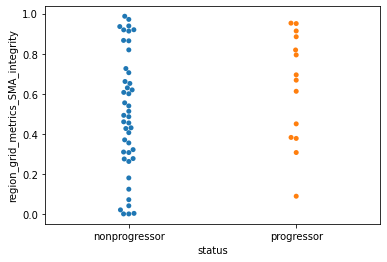

In [91]:
f = reduced.loc[include]
f['status'] = meta.loc[include]['Status']
sns.swarmplot(data=f, x='status', y='region_grid_metrics_SMA_integrity')

<AxesSubplot:xlabel='status', ylabel='boundary_cell_type_DC_cell_fraction'>

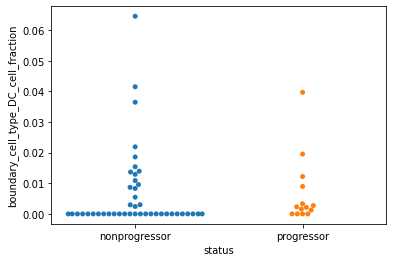

In [95]:
sns.swarmplot(data=f, x='status', y='boundary_cell_type_DC_cell_fraction', )

<AxesSubplot:xlabel='status', ylabel='boundary_cell_type_DC_cell_fraction'>

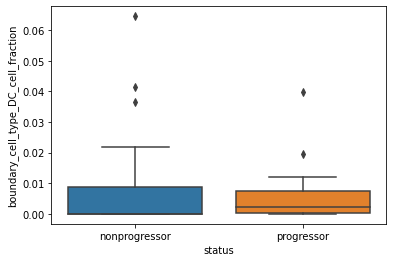

In [94]:
sns.boxplot(data=f, x='status', y='boundary_cell_type_DC_cell_fraction', )

In [99]:
include = meta[meta['LDA_Type']!='normal'].index.to_list()
X = StandardScaler().fit_transform(feats.loc[include].values)
y = np.asarray([0 if label == 'DCIS' else 1 for label in meta.loc[include]['LDA_Type']])
X.shape, y.shape

((70, 107), (70,))

In [100]:
X_df = pd.DataFrame(data=X, columns=feats.columns)
model = sm.OLS(y, X_df)
results = model.fit()

In [101]:
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                      y   R-squared (uncentered):                   0.829
Model:                            OLS   Adj. R-squared (uncentered):            -11.000
Method:                 Least Squares   F-statistic:                            0.07005
Date:                Thu, 05 Jan 2023   Prob (F-statistic):                        1.00
Time:                        09:52:18   Log-Likelihood:                          24.126
No. Observations:                  70   AIC:                                      89.75
Df Residuals:                       1   BIC:                                      244.9
Df Model:                          69                                                  
Covariance Type:            nonrobust                                                  
=========================================================================================================================
                                                            coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------------------------
boundary_cell_type_APC_cell_fraction                      0.0794      0.624      0.127      0.919      -7.845       8.004
boundary_cell_type_BCELL_cell_fraction                   -0.0242      0.440     -0.055      0.965      -5.620       5.571
boundary_cell_type_CAF_cell_fraction                      0.0185      0.476      0.039      0.975      -6.032       6.069
boundary_cell_type_CD4T_cell_fraction                    -0.1485      0.823     -0.180      0.886     -10.605      10.308
boundary_cell_type_CD8T_cell_fraction                     0.0651      0.687      0.095      0.940      -8.669       8.799
boundary_cell_type_DC_cell_fraction                      -0.0908      0.618     -0.147      0.907      -7.938       7.756
boundary_cell_type_ENDO_cell_fraction                    -0.0002      0.416     -0.001      1.000      -5.290       5.290
boundary_cell_type_FIBRO_VIMonly_cell_fraction           -0.0504      0.546     -0.092      0.941      -6.987       6.886
boundary_cell_type_IMMUNEOTHER_cell_fraction              0.0746      0.494      0.151      0.904      -6.198       6.348
boundary_cell_type_MACS_cell_fraction                    -0.0724      0.475     -0.152      0.904      -6.111       5.966
boundary_cell_type_MAST_cell_fraction                     0.0074      0.512      0.014      0.991      -6.496       6.511
boundary_cell_type_MONODC_cell_fraction                  -0.0312      0.578     -0.054      0.966      -7.378       7.316
boundary_cell_type_MONO_cell_fraction                     0.0284      0.522      0.054      0.965      -6.605       6.662
boundary_cell_type_MYOEP_cell_fraction                    0.0022      0.733      0.003      0.998      -9.307       9.312
boundary_cell_type_MYOFIBRO_cell_fraction                -0.0628      0.818     -0.077      0.951     -10.452      10.326
boundary_cell_type_NEUT_cell_fraction                    -0.0185      0.620     -0.030      0.981      -7.895       7.858
boundary_cell_type_NORMFIBRO_cell_fraction               -0.1411      0.613     -0.230      0.856      -7.932       7.650
boundary_cell_type_OTHER_cell_fraction                   -0.1244      0.833     -0.149      0.906     -10.703      10.454
boundary_cell_type_TCELL_cell_fraction                   -0.0461      0.655     -0.070      0.955      -8.364       8.271
boundary_cell_type_TUMOR_CK5_cell_fraction               -0.0532      0.535     -0.099      0.937      -6.856       6.749
boundary_cell_type_TUMOR_ECADCK_cell_fraction             0.0813      0.466      0.175      0.890      -5.835       5.998
boundary_cell_type_TUMOR_EMT_cell_fraction              

In [120]:
summary = results.summary()
result_df = summary.tables[1]
result_df = pd.DataFrame(data=result_df.data[1:], columns=result_df.data[0])
result_df = result_df.set_index('')
result_df

,coef,std err,t,P>|t|,[0.025,0.975]
,,,,,,
boundary_cell_type_APC_cell_fraction,0.0794,0.624,0.127,0.919,-7.845,8.004
boundary_cell_type_BCELL_cell_fraction,-0.0242,0.440,-0.055,0.965,-5.620,5.571
boundary_cell_type_CAF_cell_fraction,0.0185,0.476,0.039,0.975,-6.032,6.069
boundary_cell_type_CD4T_cell_fraction,-0.1485,0.823,-0.180,0.886,-10.605,10.308
boundary_cell_type_CD8T_cell_fraction,0.0651,0.687,0.095,0.940,-8.669,8.799
...,...,...,...,...,...,...
region_intensity_overlap_PanKRT_SMA,-0.0351,0.621,-0.056,0.964,-7.931,7.861
region_intensity_positive_fraction_PanKRT,0.0470,0.604,0.078,0.951,-7.632,7.726
region_intensity_positive_fraction_SMA,-0.0496,0.395,-0.126,0.920,-5.070,4.971


In [121]:
result_df.sort_values('P>|t|')

,coef,std err,t,P>|t|,[0.025,0.975]
,,,,,,
region_perimeter,-0.1631,0.545,-0.299,0.815,-7.090,6.763
region_cell_type_CAF_cell_fraction,0.1649,0.561,0.294,0.818,-6.965,7.295
boundary_perimeter,0.0882,0.309,0.286,0.823,-3.834,4.010
myoepi_compactness,0.1743,0.688,0.253,0.842,-8.570,8.919
myoepi_cell_type_TUMOR_LUMINAL_cell_fraction,-0.1015,0.428,-0.237,0.852,-5.540,5.337
...,...,...,...,...,...,...
region_cell_type_DC_cell_fraction,0.0034,0.628,0.005,0.997,-7.971,7.978
myoepi_cell_type_CD4T_cell_fraction,0.0021,0.772,0.003,0.998,-9.810,9.814
boundary_cell_type_MYOEP_cell_fraction,0.0022,0.733,0.003,0.998,-9.307,9.312


In [122]:
result_df.sort_values('coef')

,coef,std err,t,P>|t|,[0.025,0.975]
,,,,,,
myoepi_cell_type_CD4T_cell_fraction,0.0021,0.772,0.003,0.998,-9.810,9.814
boundary_cell_type_MYOEP_cell_fraction,0.0022,0.733,0.003,0.998,-9.307,9.312
region_cell_type_DC_cell_fraction,0.0034,0.628,0.005,0.997,-7.971,7.978
myoepi_perimeter,0.0056,0.250,0.023,0.986,-3.166,3.177
boundary_cell_type_MAST_cell_fraction,0.0074,0.512,0.014,0.991,-6.496,6.511
...,...,...,...,...,...,...
region_compactness,-0.1167,0.510,-0.229,0.857,-6.599,6.366
boundary_cell_type_OTHER_cell_fraction,-0.1244,0.833,-0.149,0.906,-10.703,10.454
boundary_cell_type_NORMFIBRO_cell_fraction,-0.1411,0.613,-0.230,0.856,-7.932,7.650


<AxesSubplot:xlabel='status', ylabel='region_perimeter'>

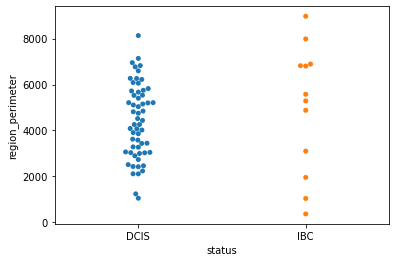

In [104]:
f = reduced.loc[include]
f['status'] = meta.loc[include]['LDA_Type']
sns.swarmplot(data=f, x='status', y='region_perimeter', )

/diskmnt/Projects/Users/estorrs/miniconda3/envs/squidpy/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 50.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


<AxesSubplot:xlabel='status', ylabel='region_cell_type_CAF_cell_fraction'>

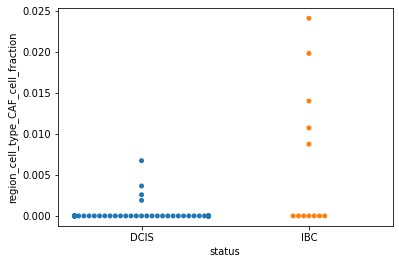

In [105]:
sns.swarmplot(data=f, x='status', y='region_cell_type_CAF_cell_fraction', )

<AxesSubplot:xlabel='status', ylabel='region_grid_metrics_SMA_integrity'>

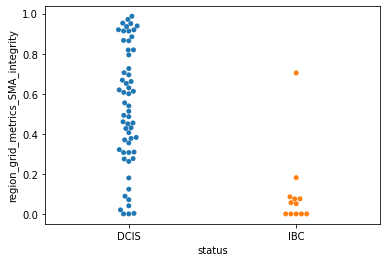

In [106]:
sns.swarmplot(data=f, x='status', y='region_grid_metrics_SMA_integrity', )

In [126]:
include = meta[meta['LDA_Type']!='normal'].index.to_list()
fts = feats[[c for c in feats.columns if 'cell_fraction' not in c]]
X = StandardScaler().fit_transform(fts.loc[include].values)
y = np.asarray([0 if label == 'DCIS' else 1 for label in meta.loc[include]['LDA_Type']])
X.shape, y.shape

((70, 38), (70,))

In [127]:
X_df = pd.DataFrame(data=X, columns=fts.columns)
model = sm.OLS(y, X_df)
results = model.fit()

In [128]:
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                      y   R-squared (uncentered):                   0.709
Model:                            OLS   Adj. R-squared (uncentered):              0.464
Method:                 Least Squares   F-statistic:                              2.894
Date:                Thu, 05 Jan 2023   Prob (F-statistic):                    0.000983
Time:                        10:05:42   Log-Likelihood:                          5.6117
No. Observations:                  70   AIC:                                      52.78
Df Residuals:                      38   BIC:                                      124.7
Df Model:                          32                                                  
Covariance Type:            nonrobust                                                  
=========================================================================================================================
                                                            coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------------------------
boundary_compactness                                     -0.0722      0.312     -0.232      0.818      -0.703       0.559
boundary_eccentricity                                    -0.0871      0.128     -0.682      0.499      -0.346       0.171
boundary_extent                                          -0.1797      0.232     -0.773      0.444      -0.650       0.291
boundary_intensity_overlap_PanKRT_SMA                    -0.8263      0.447     -1.848      0.072      -1.731       0.079
boundary_intensity_positive_fraction_PanKRT              -0.1053      0.238     -0.443      0.660      -0.587       0.376
boundary_intensity_positive_fraction_SMA                  0.0375      0.106      0.356      0.724      -0.176       0.251
boundary_area                                            -0.0893      0.313     -0.286      0.777      -0.722       0.544
boundary_perimeter                                       -0.4757      0.983     -0.484      0.631      -2.465       1.514
myoepi_compactness                                        0.1997      0.358      0.557      0.581      -0.526       0.925
myoepi_eccentricity                                       0.0676      0.108      0.628      0.534      -0.150       0.285
myoepi_extent                                             0.3021      0.346      0.872      0.389      -0.399       1.003
myoepi_intensity_overlap_PanKRT_SMA                       0.8561      0.446      1.920      0.062      -0.047       1.759
myoepi_intensity_positive_fraction_PanKRT                 0.0245      0.141      0.173      0.864      -0.262       0.311
myoepi_intensity_positive_fraction_SMA                   -0.1065      0.220     -0.484      0.631      -0.552       0.339
myoepi_area                                              -0.9392      1.362     -0.690      0.495      -3.696       1.818
myoepi_perimeter                                          1.7878      1.898      0.942      0.352      -2.055       5.631
region_grid_metrics_SMA_fraction_positive                -0.0196      0.085     -0.231      0.818      -0.191       0.152
region_grid_metrics_SMA_integrity                        -0.0287      0.083     -0.345      0.732      -0.198       0.140
region_grid_metrics_SMA_mean_intensity                   -0.0850      0.157     -0.540      0.592      -0.403       0.233
region_grid_metrics_SMA_mean_thickness                    0.0993      0.153      0.650      0.520      -0.210       0.408
region_grid_metrics_SMA_mean_thickness_nonbreaks          0.0102      0.092      0.111      0.912      -0.176       0.197
region_grid_metrics_SMA_num_grids                       

In [135]:
summary = results.summary()
result_df = summary.tables[1]
result_df = pd.DataFrame(data=result_df.data[1:], columns=result_df.data[0])
result_df = result_df.set_index('')
result_df = pd.DataFrame(data=result_df.values.astype(float), columns=result_df.columns, index=result_df.index)
result_df

,coef,std err,t,P>|t|,[0.025,0.975]
,,,,,,
boundary_compactness,-0.0722,0.312,-0.232,0.818,-0.703,0.559
boundary_eccentricity,-0.0871,0.128,-0.682,0.499,-0.346,0.171
boundary_extent,-0.1797,0.232,-0.773,0.444,-0.650,0.291
boundary_intensity_overlap_PanKRT_SMA,-0.8263,0.447,-1.848,0.072,-1.731,0.079
boundary_intensity_positive_fraction_PanKRT,-0.1053,0.238,-0.443,0.660,-0.587,0.376
boundary_intensity_positive_fraction_SMA,0.0375,0.106,0.356,0.724,-0.176,0.251
boundary_area,-0.0893,0.313,-0.286,0.777,-0.722,0.544
boundary_perimeter,-0.4757,0.983,-0.484,0.631,-2.465,1.514
myoepi_compactness,0.1997,0.358,0.557,0.581,-0.526,0.925


In [136]:
result_df.sort_values('coef')

,coef,std err,t,P>|t|,[0.025,0.975]
,,,,,,
myoepi_area,-0.9392,1.362,-0.690,0.495,-3.696,1.818
boundary_intensity_overlap_PanKRT_SMA,-0.8263,0.447,-1.848,0.072,-1.731,0.079
boundary_perimeter,-0.4757,0.983,-0.484,0.631,-2.465,1.514
region_perimeter,-0.2923,0.324,-0.901,0.373,-0.949,0.364
boundary_extent,-0.1797,0.232,-0.773,0.444,-0.650,0.291
region_compactness,-0.1797,0.120,-1.497,0.143,-0.423,0.063
myoepi_intensity_positive_fraction_SMA,-0.1065,0.220,-0.484,0.631,-0.552,0.339
boundary_intensity_positive_fraction_PanKRT,-0.1053,0.238,-0.443,0.660,-0.587,0.376
region_grid_metrics_SMA_total_area,-0.0995,1.356,-0.073,0.942,-2.844,2.645


In [137]:
result_df.sort_values('P>|t|')

,coef,std err,t,P>|t|,[0.025,0.975]
,,,,,,
myoepi_intensity_overlap_PanKRT_SMA,0.8561,0.446,1.920,0.062,-0.047,1.759
boundary_intensity_overlap_PanKRT_SMA,-0.8263,0.447,-1.848,0.072,-1.731,0.079
region_compactness,-0.1797,0.120,-1.497,0.143,-0.423,0.063
myoepi_perimeter,1.7878,1.898,0.942,0.352,-2.055,5.631
region_eccentricity,-0.0603,0.066,-0.914,0.367,-0.194,0.073
region_perimeter,-0.2923,0.324,-0.901,0.373,-0.949,0.364
myoepi_extent,0.3021,0.346,0.872,0.389,-0.399,1.003
region_area,0.1302,0.164,0.795,0.431,-0.201,0.462
boundary_extent,-0.1797,0.232,-0.773,0.444,-0.650,0.291


<AxesSubplot:xlabel='status', ylabel='myoepi_intensity_overlap_PanKRT_SMA'>

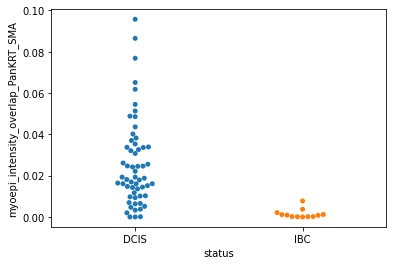

In [138]:
f = reduced.loc[include]
f['status'] = meta.loc[include]['LDA_Type']
sns.swarmplot(data=f, x='status', y='myoepi_intensity_overlap_PanKRT_SMA', )

<AxesSubplot:xlabel='status', ylabel='boundary_intensity_overlap_PanKRT_SMA'>

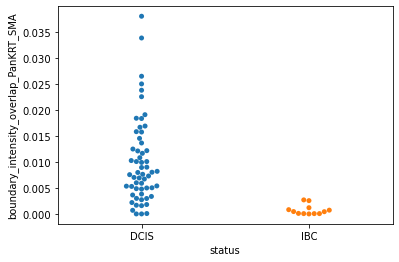

In [139]:
sns.swarmplot(data=f, x='status', y='boundary_intensity_overlap_PanKRT_SMA', )

###### xgboost

In [13]:
import xgboost
import shap
from sklearn.preprocessing import StandardScaler

# # train an XGBoost model
# X, y = shap.datasets.boston()
# model = xgboost.XGBRegressor().fit(X, y)

# # explain the model's predictions using SHAP
# # (same syntax works for LightGBM, CatBoost, scikit-learn, transformers, Spark, etc.)
# explainer = shap.Explainer(model)
# shap_values = explainer(X)

# # visualize the first prediction's explanation
# shap.plots.waterfall(shap_values[0])

In [26]:
feats = reduced[[c for c in reduced.columns if 'expanded' not in c]]
feats = reduced[[c for c in feats.columns if 'cell_fraction' not in c]]
feats

,boundary_compactness,boundary_eccentricity,boundary_extent,boundary_intensity_overlap_PanKRT_SMA,boundary_intensity_positive_fraction_PanKRT,boundary_intensity_positive_fraction_SMA,boundary_area,boundary_perimeter,myoepi_compactness,myoepi_eccentricity,...,region_grid_metrics_combined_num_pieces,region_grid_metrics_combined_overlap_fraction,region_compactness,region_eccentricity,region_extent,region_intensity_overlap_PanKRT_SMA,region_intensity_positive_fraction_PanKRT,region_intensity_positive_fraction_SMA,region_area,region_perimeter
sample,,,,,,,,,,,,,,,,,,,,,
Point2203,0.277972,0.965336,0.455393,0.026516,0.099580,0.084875,176270,2822.885569,0.108389,0.974883,...,5.000000,0.239316,0.650469,0.861507,0.827029,0.003893,0.537280,0.006531,476792,3034.981890
Point2204,0.402218,0.758392,0.641015,0.002990,0.072686,0.019496,294678,5106.384269,0.208029,0.684528,...,2.124916,0.017807,0.678001,0.621868,0.724040,0.000115,0.625909,0.000115,86797,2114.137264
Point2206,0.189497,0.850813,0.365237,0.001808,0.080982,0.050722,434725,7591.922866,0.079803,0.819741,...,4.504258,0.045329,0.342521,0.800005,0.457435,0.004185,0.347247,0.017416,400715,5211.120379
Point2302,0.282516,0.970342,0.270690,0.005998,0.090414,0.045631,180558,2833.946535,0.115744,0.976709,...,9.000000,0.125000,0.712636,0.771303,0.780042,0.000000,0.493990,0.000000,344333,2464.111832
Point2303,0.202730,0.640258,0.440927,0.038071,0.104816,0.089877,415355,7255.639462,0.103002,0.607301,...,6.484103,0.383698,0.262173,0.664054,0.537108,0.045370,0.403146,0.062680,372448,4258.987299
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Point6201,0.196555,0.788382,0.479038,0.010276,0.139685,0.032262,714585,20070.661279,0.137661,0.775588,...,5.529777,0.089601,0.364054,0.832808,0.457329,0.005151,0.480652,0.008491,295840,8130.444728
Point6202,0.160422,0.778136,0.326770,0.001673,0.099858,0.033596,346713,8262.403964,0.102009,0.704348,...,7.816754,0.048746,0.563900,0.647578,0.747709,0.000716,0.311841,0.004589,644839,5823.184305
Point6203,0.143987,0.657321,0.536223,0.007031,0.106647,0.063803,409058,10016.700787,0.098643,0.752549,...,10.444314,0.101850,0.182122,0.896162,0.375184,0.006573,0.326502,0.012468,143169,4518.766266


In [37]:
include = meta[meta['LDA_Type']=='DCIS'].index.to_list()
include = np.random.permutation(include)
X = StandardScaler().fit_transform(feats.loc[include].values)
y = np.asarray([0 if label == 'nonprogressor' else 1 for label in meta.loc[include]['Status']])
X.shape, y.shape

((58, 38), (58,))

In [38]:
X_df = pd.DataFrame(data=X, columns=feats.columns)

In [39]:
model = xgboost.XGBClassifier().fit(X_df, y)
explainer = shap.Explainer(model)
shap_values = explainer(X_df)

[13:59:31] WARNING: /tmp/abs_40obctay9q/croots/recipe/xgboost-split_1659548945886/work/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
ntree_limit is deprecated, use `iteration_range` or model slicing instead.


In [40]:
shap.initjs()

In [41]:
shap.plots.force(shap_values[0])

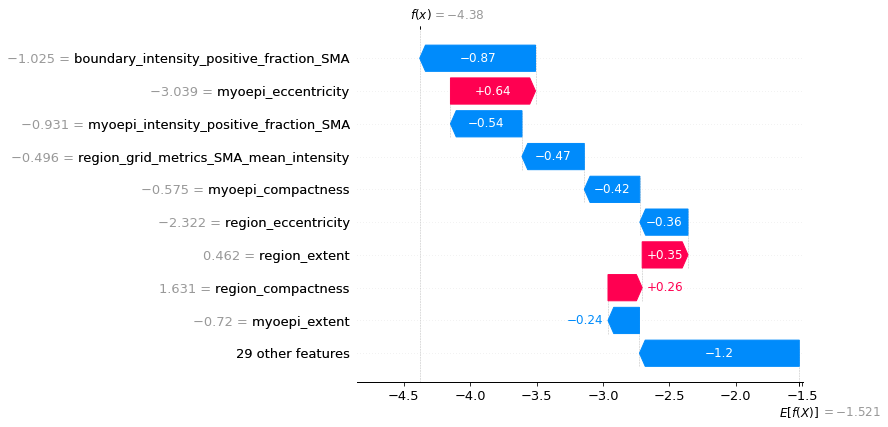

In [42]:
shap.waterfall_plot(shap_values[0])

In [43]:
shap.plots.force(shap_values)

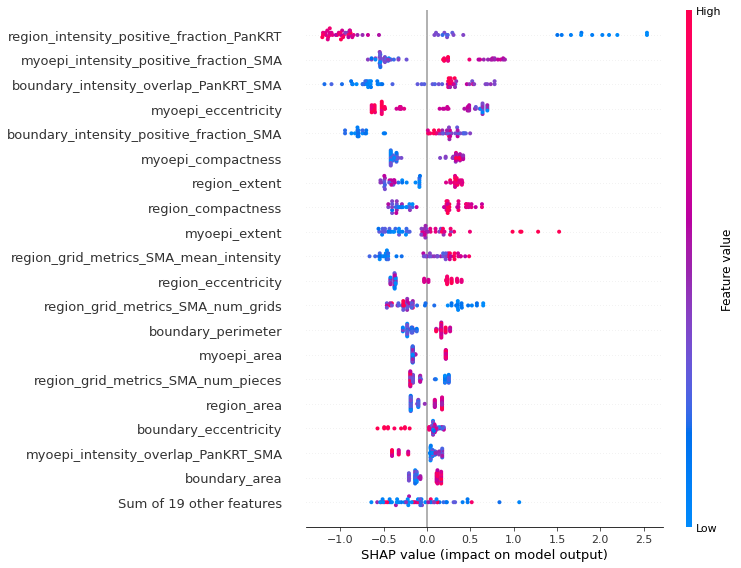

In [44]:
shap.plots.beeswarm(shap_values, max_display=20)

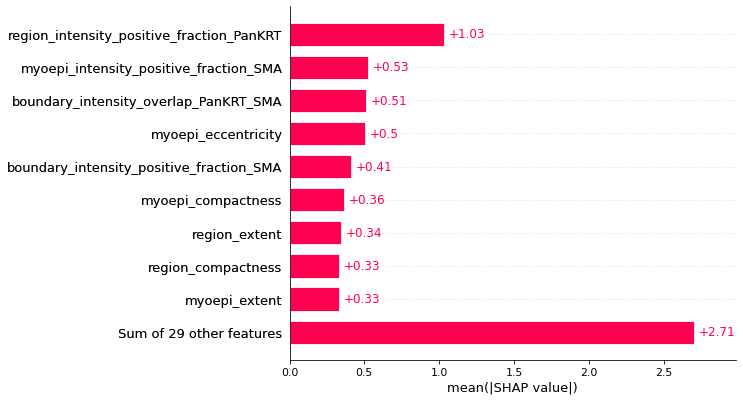

In [45]:
shap.plots.bar(shap_values)

###### t test

In [12]:
from statsmodels.stats.weightstats import ttest_ind
from collections import Counter
Counter(meta['LDA_Type']).most_common()

[('DCIS', 58), ('IBC', 12), ('normal', 9)]

In [13]:
feats = reduced[[c for c in reduced.columns if 'expanded' not in c]].copy()
include = meta.index.to_list()
feats = feats.loc[include]
labels = meta.loc[include]['LDA_Type']

In [14]:
from scipy.stats import wilcoxon

In [15]:
cats = sorted(set(labels))
grid = np.meshgrid(cats, cats)
tups = [tuple(sorted([x, y])) for x, y in zip(grid[0].flatten(), grid[1].flatten()) if x!=y]
combos = sorted(set(tups))

data = []
for c in feats.columns:
    for x, y in combos:
        stat, p_value, _ = ttest_ind(feats[c][labels==x], feats[c][labels==y])
#         stat, p_value = wilcoxon(feats[c][labels==x], feats[c][labels==y])
        data.append([c, x, y, stat, p_value])
df = pd.DataFrame(data=data, columns=['feature', 'class_1', 'class_2', 'statistic', 'p-value'])
df

,feature,class_1,class_2,statistic,p-value
0,boundary_cell_type_APC_cell_fraction,DCIS,IBC,-0.243107,0.808654
1,boundary_cell_type_APC_cell_fraction,DCIS,normal,1.286490,0.202836
2,boundary_cell_type_APC_cell_fraction,IBC,normal,1.822573,0.084146
3,boundary_cell_type_BCELL_cell_fraction,DCIS,IBC,0.757427,0.451411
4,boundary_cell_type_BCELL_cell_fraction,DCIS,normal,-0.700309,0.486233
...,...,...,...,...,...
520,region_area,DCIS,normal,3.861326,0.000262
521,region_area,IBC,normal,1.944252,0.066822
522,region_perimeter,DCIS,IBC,-2.185762,0.032280
523,region_perimeter,DCIS,normal,0.401912,0.689068


In [16]:
f = df[[False if 'cell_fraction' in feat else True for feat in df['feature']]]
f

,feature,class_1,class_2,statistic,p-value
69,boundary_compactness,DCIS,IBC,-1.058632,0.293513
70,boundary_compactness,DCIS,normal,-1.764952,0.082269
71,boundary_compactness,IBC,normal,-0.336610,0.740100
72,boundary_eccentricity,DCIS,IBC,3.517392,0.000781
73,boundary_eccentricity,DCIS,normal,2.100812,0.039540
...,...,...,...,...,...
520,region_area,DCIS,normal,3.861326,0.000262
521,region_area,IBC,normal,1.944252,0.066822
522,region_perimeter,DCIS,IBC,-2.185762,0.032280
523,region_perimeter,DCIS,normal,0.401912,0.689068


In [17]:
f.sort_values('p-value').iloc[:20]

,feature,class_1,class_2,statistic,p-value
359,region_grid_metrics_SMA_integrity,IBC,normal,-12.161292,2.067151e-10
517,region_intensity_positive_fraction_SMA,DCIS,normal,-6.539318,1.121021e-08
499,region_intensity_overlap_ECAD_SMA,DCIS,normal,-6.299818,2.933976e-08
251,myoepi_intensity_positive_fraction_SMA,IBC,normal,-8.448605,7.383549e-08
205,myoepi_extent,DCIS,normal,-5.747390,2.619570e-07
365,region_grid_metrics_SMA_mean_thickness,IBC,normal,-7.031249,1.078032e-06
356,region_grid_metrics_SMA_fraction_positive,IBC,normal,-6.938632,1.296566e-06
357,region_grid_metrics_SMA_integrity,DCIS,IBC,5.203005,1.968209e-06
472,region_extent,DCIS,normal,5.168005,2.446353e-06
362,region_grid_metrics_SMA_mean_intensity,IBC,normal,-6.524685,3.000596e-06


In [19]:
import seaborn as sns

<AxesSubplot:xlabel='LDA_Type', ylabel='region_grid_metrics_SMA_integrity'>

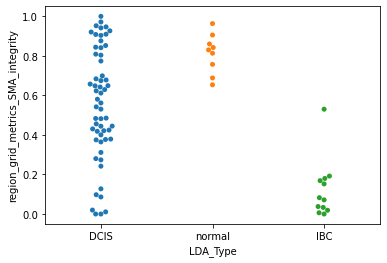

In [20]:
sns.swarmplot(data=feats, x=labels, y='region_grid_metrics_SMA_integrity')

<AxesSubplot:xlabel='LDA_Type', ylabel='myoepi_intensity_overlap_ECAD_SMA'>

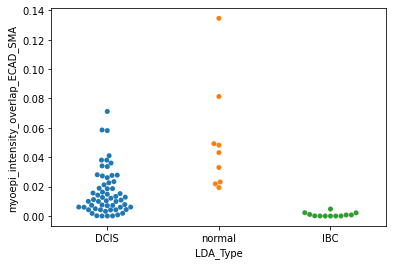

In [24]:
sns.swarmplot(data=feats, x=labels, y='myoepi_intensity_overlap_ECAD_SMA')

<AxesSubplot:xlabel='LDA_Type', ylabel='region_grid_metrics_SMA_integrity'>

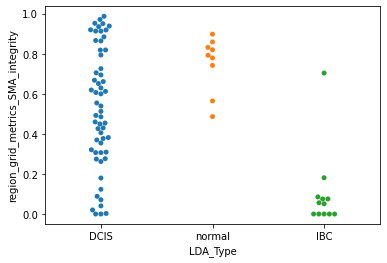

In [110]:
sns.swarmplot(data=feats, x=labels, y='region_grid_metrics_SMA_integrity')

<AxesSubplot:xlabel='LDA_Type', ylabel='myoepi_intensity_overlap_PanKRT_SMA'>

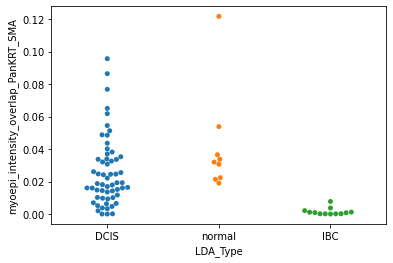

In [111]:
sns.swarmplot(data=feats, x=labels, y='myoepi_intensity_overlap_PanKRT_SMA')

<AxesSubplot:xlabel='LDA_Type', ylabel='region_area'>

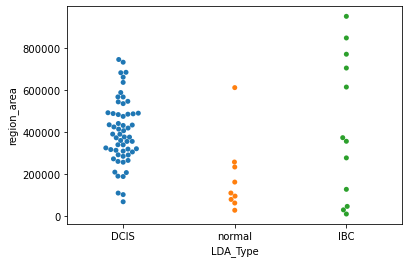

In [25]:
sns.swarmplot(data=feats, x=labels, y='region_area')

In [26]:
df = feats.copy()
df['status'] = meta.loc[df.index]['LDA_Type']
df = df.groupby('status').mean()
df

,boundary_cell_type_APC_cell_fraction,boundary_cell_type_BCELL_cell_fraction,boundary_cell_type_CAF_cell_fraction,boundary_cell_type_CD4T_cell_fraction,boundary_cell_type_CD8T_cell_fraction,boundary_cell_type_DC_cell_fraction,boundary_cell_type_ENDO_cell_fraction,boundary_cell_type_FIBRO_VIMonly_cell_fraction,boundary_cell_type_IMMUNEOTHER_cell_fraction,boundary_cell_type_MACS_cell_fraction,...,region_intensity_overlap_ECAD_PanKRT,region_intensity_overlap_ECAD_SMA,region_intensity_overlap_PanKRT_SMA,region_intensity_positive_fraction_CK5,region_intensity_positive_fraction_CK7,region_intensity_positive_fraction_ECAD,region_intensity_positive_fraction_PanKRT,region_intensity_positive_fraction_SMA,region_area,region_perimeter
status,,,,,,,,,,,,,,,,,,,,,
DCIS,0.056363,0.007141,0.042858,0.030953,0.015327,0.007681,0.071173,0.101480,0.020027,0.015434,...,0.181855,0.004122,0.007017,0.020666,0.230971,0.216168,0.546252,0.011544,399510.793103,4699.695648
IBC,0.062113,0.001815,0.061776,0.008715,0.019771,0.010401,0.034489,0.043751,0.021362,0.037857,...,0.105315,0.001119,0.003206,0.081958,0.189028,0.138755,0.436899,0.012613,425902.583333,6057.214375
normal,0.022215,0.013555,0.004714,0.013397,0.011659,0.001014,0.033598,0.151278,0.015812,0.004541,...,0.194298,0.031368,0.043159,0.023830,0.345915,0.226522,0.531374,0.070161,182956.888889,4442.233523


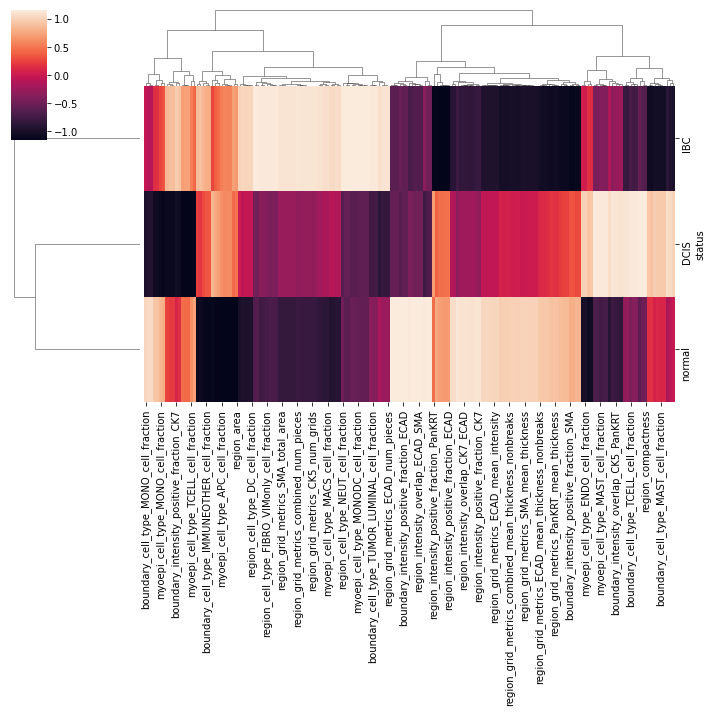

In [27]:
sns.clustermap(df, z_score=True)

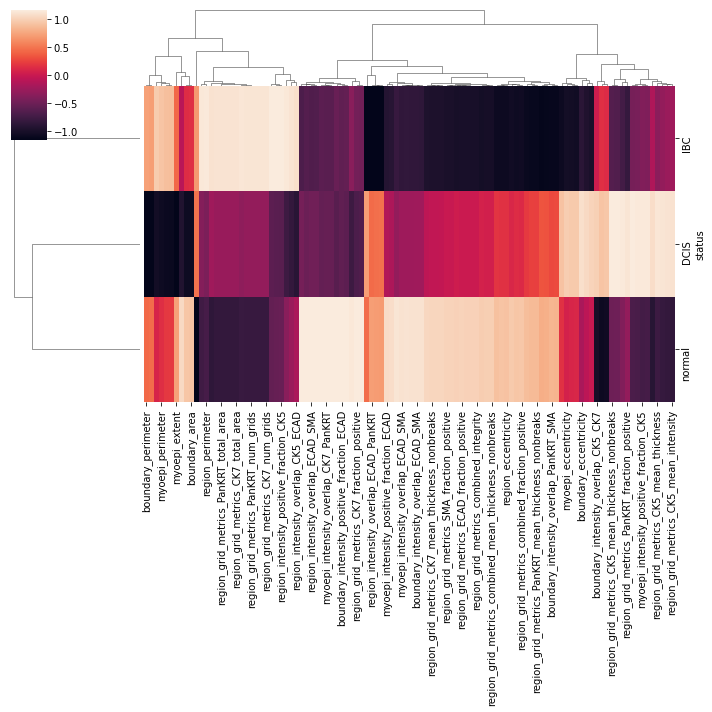

In [28]:
sns.clustermap(df[[c for c in df.columns if 'cell_fraction' not in c]], z_score=True)

In [29]:
Counter(meta['Status']).most_common()

[('nonprogressor', 44),
 ('progressor', 14),
 ('IBC_recurrence', 12),
 ('normal', 9)]

In [30]:
feats = reduced[[c for c in reduced.columns if 'expanded' not in c]].copy()
include = meta[meta['LDA_Type']=='DCIS'].index.to_list()
feats = feats.loc[include]
status = np.asarray([False if label == 'nonprogressor' else True
                     for label in meta.loc[include]['Status']])
feats

,boundary_cell_type_APC_cell_fraction,boundary_cell_type_BCELL_cell_fraction,boundary_cell_type_CAF_cell_fraction,boundary_cell_type_CD4T_cell_fraction,boundary_cell_type_CD8T_cell_fraction,boundary_cell_type_DC_cell_fraction,boundary_cell_type_ENDO_cell_fraction,boundary_cell_type_FIBRO_VIMonly_cell_fraction,boundary_cell_type_IMMUNEOTHER_cell_fraction,boundary_cell_type_MACS_cell_fraction,...,region_intensity_overlap_ECAD_PanKRT,region_intensity_overlap_ECAD_SMA,region_intensity_overlap_PanKRT_SMA,region_intensity_positive_fraction_CK5,region_intensity_positive_fraction_CK7,region_intensity_positive_fraction_ECAD,region_intensity_positive_fraction_PanKRT,region_intensity_positive_fraction_SMA,region_area,region_perimeter
sample,,,,,,,,,,,,,,,,,,,,,
Point2203,0.011111,0.000000,0.111111,0.000000,0.022222,0.000000,0.088889,0.022222,0.000000,0.011111,...,0.170728,0.004055,0.005953,0.008499,0.116563,0.195354,0.540976,0.008829,489966,3060.739249
Point2204,0.050723,0.000000,0.088695,0.005599,0.038511,0.000000,0.091761,0.142025,0.033324,0.013553,...,0.149057,0.000058,0.001355,0.018211,0.313548,0.158617,0.624135,0.002351,103343,2359.339321
Point2206,0.108232,0.000000,0.090643,0.024176,0.014002,0.014755,0.064720,0.017619,0.018026,0.002050,...,0.182674,0.008100,0.003932,0.002846,0.052232,0.331188,0.352941,0.016210,434922,5413.871642
Point2302,0.010101,0.000000,0.000000,0.000000,0.000000,0.000000,0.010101,0.141414,0.060606,0.000000,...,0.030668,0.000110,0.000348,0.000138,0.127431,0.032578,0.505408,0.000477,356037,2506.839754
Point2303,0.023077,0.002564,0.012821,0.356413,0.035898,0.017949,0.028205,0.062677,0.018518,0.023077,...,0.171977,0.032812,0.054172,0.062160,0.365809,0.183250,0.431730,0.073615,406740,4526.970055
Point2304,0.028261,0.012778,0.000000,0.022783,0.016851,0.005258,0.043129,0.244746,0.049796,0.005258,...,0.117150,0.000481,0.001287,0.005551,0.589916,0.134626,0.707056,0.003553,313811,4502.224889
Point2306,0.134265,0.000000,0.133691,0.035887,0.010845,0.003352,0.040423,0.091263,0.018338,0.006704,...,0.114360,0.003536,0.016488,0.073796,0.484459,0.128861,0.713710,0.030277,636103,7063.904397
Point2309,0.019139,0.000000,0.004785,0.000000,0.000000,0.000000,0.033493,0.124402,0.000000,0.000000,...,0.017313,0.000123,0.000000,0.000000,0.000134,0.063169,0.058394,0.009207,260902,2558.025612
Point2310,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.017037,0.016099,0.005635,0.010595,...,0.101234,0.000470,0.001004,0.007279,0.063516,0.228668,0.412132,0.001100,189165,3243.728281


In [31]:
Counter(meta.loc[include]['Status']).most_common()

[('nonprogressor', 44), ('progressor', 14)]

In [32]:
xs = feats['region_grid_metrics_SMA_integrity']
stat, p_val, _ = ttest_ind(xs[status], xs[~status])
stat, p_val

(2.0433706384672097, 0.04573151885528907)

In [33]:
features = feats.columns
scores = [ttest_ind(feats[c][status], feats[c][~status]) for c in feats.columns]

In [34]:
data = []
for (stat, p, _), c in zip(scores, feats.columns):
    data.append([c, stat, p])
df = pd.DataFrame(data=data, columns=['feature', 'statistic', 'p-value'])
df

,feature,statistic,p-value
0,boundary_cell_type_APC_cell_fraction,-0.573928,0.568315
1,boundary_cell_type_BCELL_cell_fraction,1.515118,0.135367
2,boundary_cell_type_CAF_cell_fraction,-1.001821,0.320739
3,boundary_cell_type_CD4T_cell_fraction,0.368704,0.713738
4,boundary_cell_type_CD8T_cell_fraction,0.491026,0.625327
...,...,...,...
170,region_intensity_positive_fraction_ECAD,0.872615,0.386599
171,region_intensity_positive_fraction_PanKRT,-1.106835,0.273097
172,region_intensity_positive_fraction_SMA,-0.343228,0.732712
173,region_area,0.486845,0.628268


In [35]:
df.sort_values('p-value')

,feature,statistic,p-value
106,region_grid_metrics_ECAD_mean_thickness_nonbreaks,4.187979,0.000101
105,region_grid_metrics_ECAD_mean_thickness,3.503468,0.000911
102,region_grid_metrics_ECAD_fraction_positive,3.342659,0.001484
104,region_grid_metrics_ECAD_mean_intensity,3.227745,0.002087
81,myoepi_intensity_positive_fraction_ECAD,3.204571,0.002234
...,...,...,...
16,boundary_cell_type_NORMFIBRO_cell_fraction,-0.081948,0.934981
27,boundary_intensity_overlap_CK5_ECAD,-0.068379,0.945728
37,boundary_intensity_positive_fraction_CK7,-0.039955,0.968271
32,boundary_intensity_overlap_CK7_SMA,0.032791,0.973958


In [36]:
df.sort_values('p-value').iloc[:20]

,feature,statistic,p-value
106,region_grid_metrics_ECAD_mean_thickness_nonbreaks,4.187979,0.000101
105,region_grid_metrics_ECAD_mean_thickness,3.503468,0.000911
102,region_grid_metrics_ECAD_fraction_positive,3.342659,0.001484
104,region_grid_metrics_ECAD_mean_intensity,3.227745,0.002087
81,myoepi_intensity_positive_fraction_ECAD,3.204571,0.002234
38,boundary_intensity_positive_fraction_ECAD,3.119320,0.002863
34,boundary_intensity_overlap_ECAD_SMA,3.058644,0.003407
42,boundary_perimeter,2.607173,0.011679
77,myoepi_intensity_overlap_ECAD_SMA,2.475818,0.016343
85,myoepi_perimeter,2.425020,0.018558


<AxesSubplot:xlabel='status', ylabel='region_grid_metrics_ECAD_mean_thickness_nonbreaks'>

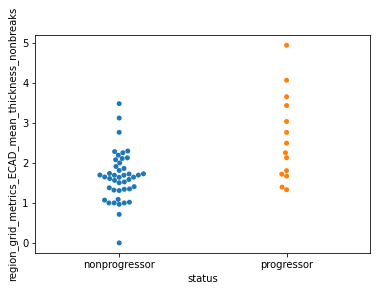

In [37]:
f = feats.copy()
f['status'] = meta.loc[f.index]['Status']
sns.swarmplot(data=f, x='status', y='region_grid_metrics_ECAD_mean_thickness_nonbreaks')

<AxesSubplot:xlabel='status', ylabel='region_grid_metrics_ECAD_integrity'>

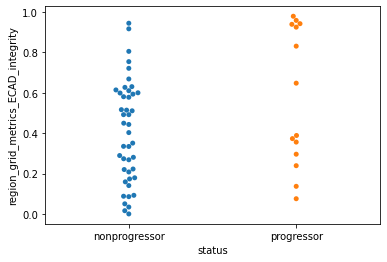

In [38]:
f = feats.copy()
f['status'] = meta.loc[f.index]['Status']
sns.swarmplot(data=f, x='status', y='region_grid_metrics_ECAD_integrity')

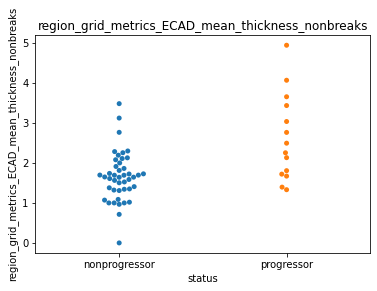

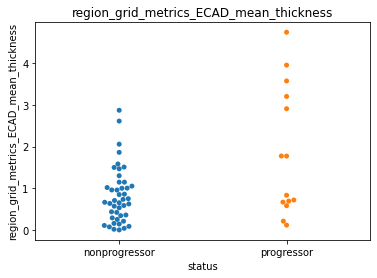

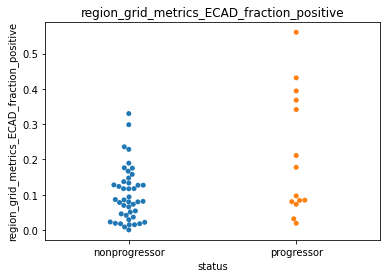

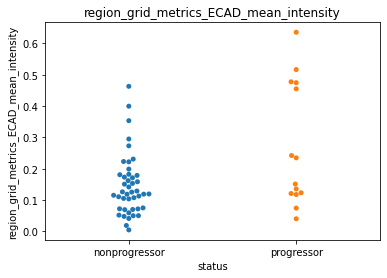

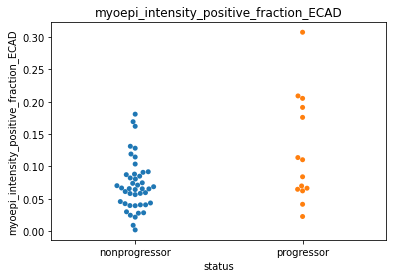

...

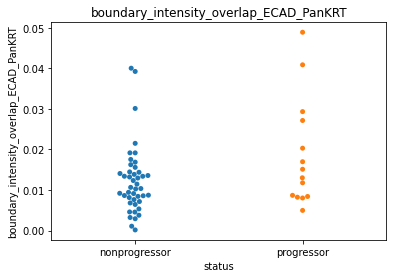

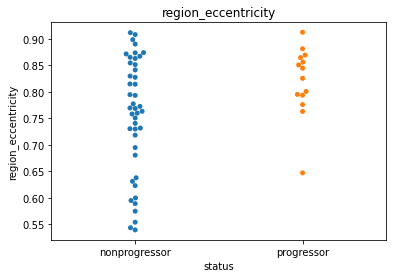

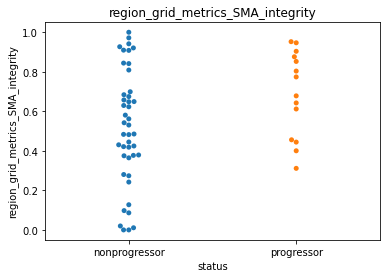

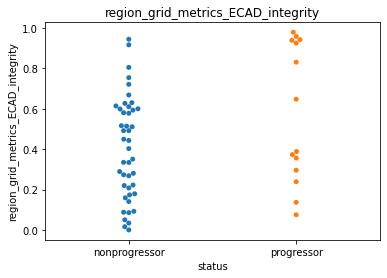

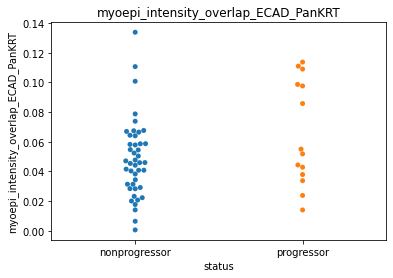

In [39]:
cols = df.sort_values('p-value')['feature'][:20]
for c in cols:
    sns.swarmplot(data=f, x='status', y=c)
    plt.title(c)
    plt.show()
    

In [40]:
list(feats.columns)

['boundary_cell_type_APC_cell_fraction',
 'boundary_cell_type_BCELL_cell_fraction',
 'boundary_cell_type_CAF_cell_fraction',
 'boundary_cell_type_CD4T_cell_fraction',
 'boundary_cell_type_CD8T_cell_fraction',
 'boundary_cell_type_DC_cell_fraction',
 'boundary_cell_type_ENDO_cell_fraction',
 'boundary_cell_type_FIBRO_VIMonly_cell_fraction',
 'boundary_cell_type_IMMUNEOTHER_cell_fraction',
 'boundary_cell_type_MACS_cell_fraction',
 'boundary_cell_type_MAST_cell_fraction',
 'boundary_cell_type_MONODC_cell_fraction',
 'boundary_cell_type_MONO_cell_fraction',
 'boundary_cell_type_MYOEP_cell_fraction',
 'boundary_cell_type_MYOFIBRO_cell_fraction',
 'boundary_cell_type_NEUT_cell_fraction',
 'boundary_cell_type_NORMFIBRO_cell_fraction',
 'boundary_cell_type_OTHER_cell_fraction',
 'boundary_cell_type_TCELL_cell_fraction',
 'boundary_cell_type_TUMOR_CK5_cell_fraction',
 'boundary_cell_type_TUMOR_ECADCK_cell_fraction',
 'boundary_cell_type_TUMOR_EMT_cell_fraction',
 'boundary_cell_type_TUMOR_LUMI

Text(0.5, 1.0, 'myoepi_intensity_overlap_CK5_SMA')

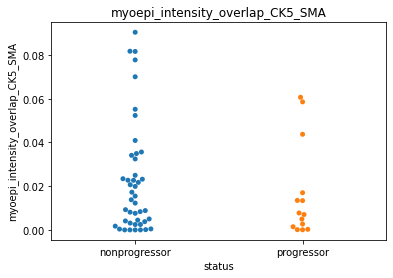

In [49]:
sns.swarmplot(data=f, x='status', y='myoepi_intensity_overlap_CK5_SMA')
plt.title('myoepi_intensity_overlap_CK5_SMA')

Text(0.5, 1.0, 'myoepi_intensity_overlap_CK5_SMA')

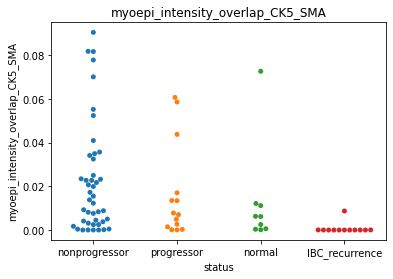

In [52]:
f = reduced.copy()
f['status'] = meta.loc[f.index]['Status']
order = ['nonprogressor', 'progressor', 'normal', 'IBC_recurrence']
sns.swarmplot(data=f, x='status', y='myoepi_intensity_overlap_CK5_SMA', order=order)
plt.title('myoepi_intensity_overlap_CK5_SMA')

Text(0.5, 1.0, 'myoepi_intensity_overlap_ECAD_SMA')

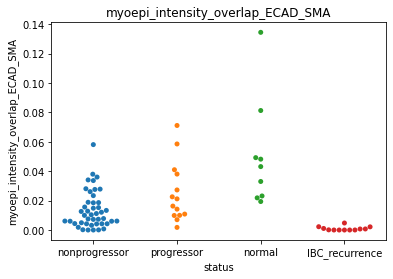

In [54]:
sns.swarmplot(data=f, x='status', y='myoepi_intensity_overlap_ECAD_SMA', order=order)
plt.title('myoepi_intensity_overlap_ECAD_SMA')

Text(0.5, 1.0, 'region_grid_metrics_SMA_integrity')

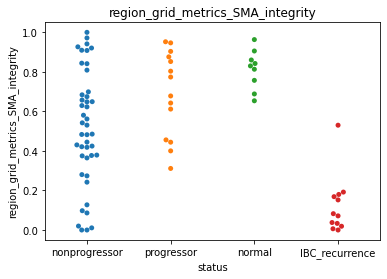

In [55]:
sns.swarmplot(data=f, x='status', y='region_grid_metrics_SMA_integrity', order=order)
plt.title('region_grid_metrics_SMA_integrity')

In [45]:
df = reduced.copy()
df['status'] = meta.loc[df.index]['Status']
df = df.groupby('status').mean()
df

,boundary_cell_type_APC_cell_fraction,boundary_cell_type_BCELL_cell_fraction,boundary_cell_type_CAF_cell_fraction,boundary_cell_type_CD4T_cell_fraction,boundary_cell_type_CD8T_cell_fraction,boundary_cell_type_DC_cell_fraction,boundary_cell_type_ENDO_cell_fraction,boundary_cell_type_FIBRO_VIMonly_cell_fraction,boundary_cell_type_IMMUNEOTHER_cell_fraction,boundary_cell_type_MACS_cell_fraction,...,region_intensity_overlap_ECAD_PanKRT,region_intensity_overlap_ECAD_SMA,region_intensity_overlap_PanKRT_SMA,region_intensity_positive_fraction_CK5,region_intensity_positive_fraction_CK7,region_intensity_positive_fraction_ECAD,region_intensity_positive_fraction_PanKRT,region_intensity_positive_fraction_SMA,region_area,region_perimeter
status,,,,,,,,,,,,,,,,,,,,,
IBC_recurrence,0.062113,0.001815,0.061776,0.008715,0.019771,0.010401,0.034489,0.043751,0.021362,0.037857,...,0.105315,0.001119,0.003206,0.081958,0.189028,0.138755,0.436899,0.012613,425902.583333,6057.214375
nonprogressor,0.059685,0.004460,0.047810,0.029034,0.014595,0.007416,0.074996,0.103824,0.020007,0.009850,...,0.180370,0.004192,0.007308,0.021655,0.244419,0.208043,0.558371,0.011900,393945.772727,4403.544588
normal,0.022215,0.013555,0.004714,0.013397,0.011659,0.001014,0.033598,0.151278,0.015812,0.004541,...,0.194298,0.031368,0.043159,0.023830,0.345915,0.226522,0.531374,0.070161,182956.888889,4442.233523
progressor,0.045920,0.015564,0.027293,0.036983,0.017630,0.008515,0.059155,0.094112,0.020090,0.032981,...,0.186522,0.003900,0.006101,0.017557,0.188708,0.241704,0.508164,0.010425,417000.857143,5630.456122


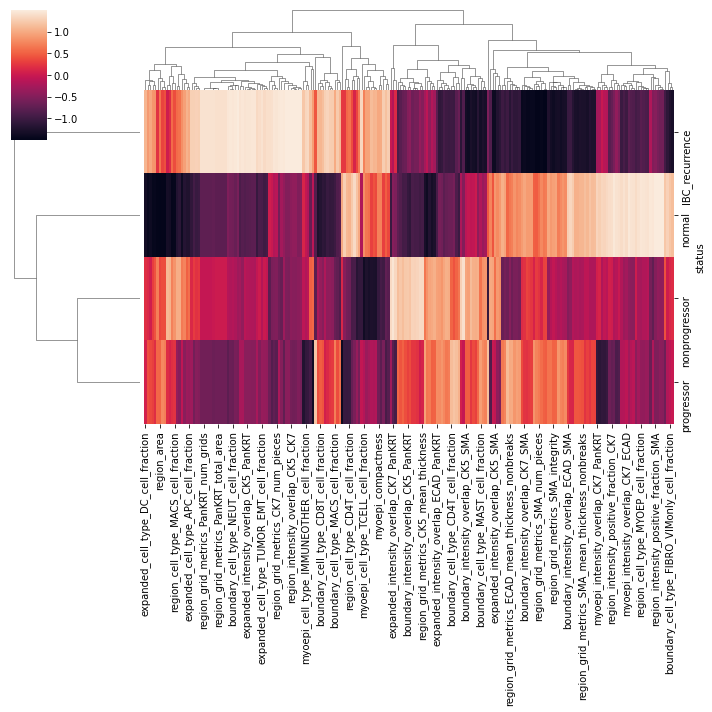

In [46]:
sns.clustermap(df, z_score=True)

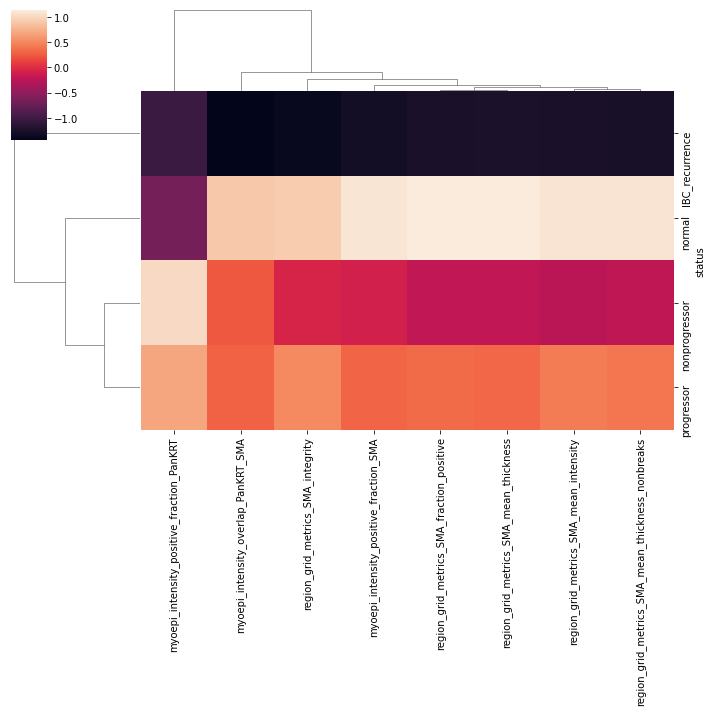

In [47]:
cols = ['region_grid_metrics_SMA_fraction_positive',
 'region_grid_metrics_SMA_integrity',
 'region_grid_metrics_SMA_mean_intensity',
 'region_grid_metrics_SMA_mean_thickness',
 'region_grid_metrics_SMA_mean_thickness_nonbreaks',
 'myoepi_intensity_overlap_PanKRT_SMA',
 'myoepi_intensity_positive_fraction_PanKRT',
 'myoepi_intensity_positive_fraction_SMA',
]
sns.clustermap(df[cols], z_score=True)

In [56]:
fps = sorted(listfiles(directory, regex='/regions.npy$'))
fps

['/diskmnt/Projects/Users/estorrs/multiplex_data/analysis/dcis_region_analysis/angelo_v4/Point2203/outputs/regions.npy',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/analysis/dcis_region_analysis/angelo_v4/Point2204/outputs/regions.npy',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/analysis/dcis_region_analysis/angelo_v4/Point2206/outputs/regions.npy',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/analysis/dcis_region_analysis/angelo_v4/Point2302/outputs/regions.npy',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/analysis/dcis_region_analysis/angelo_v4/Point2303/outputs/regions.npy',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/analysis/dcis_region_analysis/angelo_v4/Point2304/outputs/regions.npy',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/analysis/dcis_region_analysis/angelo_v4/Point2305/outputs/regions.npy',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/analysis/dcis_region_analysis/angelo_v4/Point2306/outputs/regions.npy',
 '/diskmnt/Projects/Users/estorr

In [57]:
sample_to_imgs = {}
for fp in fps:
    sample = fp.split('/')[-3]
    d = np.load(fp, allow_pickle=True)[()]
    sample_to_imgs[sample] = d
    

In [58]:
fps = sorted(listfiles(directory, regex='/grid_regions.npy$'))
fps

['/diskmnt/Projects/Users/estorrs/multiplex_data/analysis/dcis_region_analysis/angelo_v4/Point2203/outputs/grid_regions.npy',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/analysis/dcis_region_analysis/angelo_v4/Point2204/outputs/grid_regions.npy',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/analysis/dcis_region_analysis/angelo_v4/Point2206/outputs/grid_regions.npy',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/analysis/dcis_region_analysis/angelo_v4/Point2302/outputs/grid_regions.npy',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/analysis/dcis_region_analysis/angelo_v4/Point2303/outputs/grid_regions.npy',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/analysis/dcis_region_analysis/angelo_v4/Point2304/outputs/grid_regions.npy',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/analysis/dcis_region_analysis/angelo_v4/Point2305/outputs/grid_regions.npy',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/analysis/dcis_region_analysis/angelo_v4/Point2306/outputs/grid_region

In [59]:
sample_to_grid_imgs = {}
for fp in fps:
    sample = fp.split('/')[-3]
    d = np.load(fp, allow_pickle=True)[()]
    sample_to_grid_imgs[sample] = d

In [60]:
fps = sorted(listfiles(directory, regex='/grid_polygons.json$'))
fps

['/diskmnt/Projects/Users/estorrs/multiplex_data/analysis/dcis_region_analysis/angelo_v4/Point2203/outputs/grid_polygons.json',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/analysis/dcis_region_analysis/angelo_v4/Point2204/outputs/grid_polygons.json',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/analysis/dcis_region_analysis/angelo_v4/Point2206/outputs/grid_polygons.json',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/analysis/dcis_region_analysis/angelo_v4/Point2302/outputs/grid_polygons.json',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/analysis/dcis_region_analysis/angelo_v4/Point2303/outputs/grid_polygons.json',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/analysis/dcis_region_analysis/angelo_v4/Point2304/outputs/grid_polygons.json',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/analysis/dcis_region_analysis/angelo_v4/Point2305/outputs/grid_polygons.json',
 '/diskmnt/Projects/Users/estorrs/multiplex_data/analysis/dcis_region_analysis/angelo_v4/Point2306/outpu

In [61]:
sample_to_polys = {}
for fp in fps:
    sample = fp.split('/')[-3]
    d = json.load(open(fp))
    sample_to_polys[sample] = d

In [63]:
len(sample_to_imgs)

79

In [65]:
status_to_samples = {s:meta[meta['Status']==s].index.to_list() for s in set(meta['Status'])}
status_to_samples

{'progressor': ['Point2306',
  'Point2310',
  'Point2312',
  'Point2322',
  'Point3105',
  'Point3123',
  'Point5303',
  'Point5310',
  'Point6102',
  'Point6103',
  'Point6201',
  'Point6202',
  'Point6203',
  'Point6204'],
 'nonprogressor': ['Point2203',
  'Point2204',
  'Point2206',
  'Point2302',
  'Point2303',
  'Point2304',
  'Point2309',
  'Point2311',
  'Point2313',
  'Point2318',
  'Point2319',
  'Point2320',
  'Point2321',
  'Point2325',
  'Point2326',
  'Point2327',
  'Point2328',
  'Point2331',
  'Point3102',
  'Point3104',
  'Point3107',
  'Point3108',
  'Point3110',
  'Point3111',
  'Point3112',
  'Point3114',
  'Point3115',
  'Point3117',
  'Point3119',
  'Point3120',
  'Point3121',
  'Point3125',
  'Point3128',
  'Point3129',
  'Point4410',
  'Point4411',
  'Point5202',
  'Point5302',
  'Point5304',
  'Point5305',
  'Point5306',
  'Point5308',
  'Point5309',
  'Point6206'],
 'IBC_recurrence': ['Point4103',
  'Point4106',
  'Point4115',
  'Point4116',
  'Point4117',
  'P

In [66]:
for k, v in status_to_samples.items(): print(k, len(v))

progressor 14
nonprogressor 44
IBC_recurrence 12
normal 9


In [88]:
axs

array([<AxesSubplot:title={'center':'Point2306'}>,
       <AxesSubplot:title={'center':'Point2310'}>,
       <AxesSubplot:title={'center':'Point2312'}>,
       <AxesSubplot:title={'center':'Point2322'}>,
       <AxesSubplot:title={'center':'Point3105'}>,
       <AxesSubplot:title={'center':'Point3123'}>,
       <AxesSubplot:title={'center':'Point5303'}>,
       <AxesSubplot:title={'center':'Point5310'}>,
       <AxesSubplot:title={'center':'Point6102'}>,
       <AxesSubplot:title={'center':'Point6103'}>,
       <AxesSubplot:title={'center':'Point6201'}>,
       <AxesSubplot:title={'center':'Point6202'}>,
       <AxesSubplot:title={'center':'Point6203'}>,
       <AxesSubplot:title={'center':'Point6204'}>, <AxesSubplot:>],
      dtype=object)

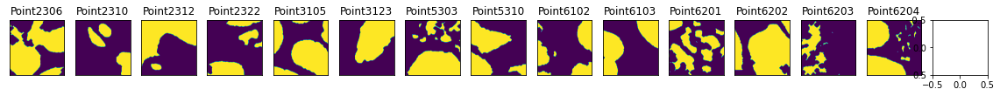

In [92]:
status = 'progressor'
fig, axs = plt.subplots(nrows=1, ncols=15, figsize=(20, 5))
axs = axs.flatten()
for (s, d), ax in list(zip({k:v for k, v in sample_to_imgs.items() if k in status_to_samples[status]}.items(), axs)):
    img = d['region']['mask']
    ax.imshow(img)
    ax.set_title(s)
    ax.set_xticks([])
    ax.set_yticks([])
axs[-1].imshow(np.ones((1,1,3)))

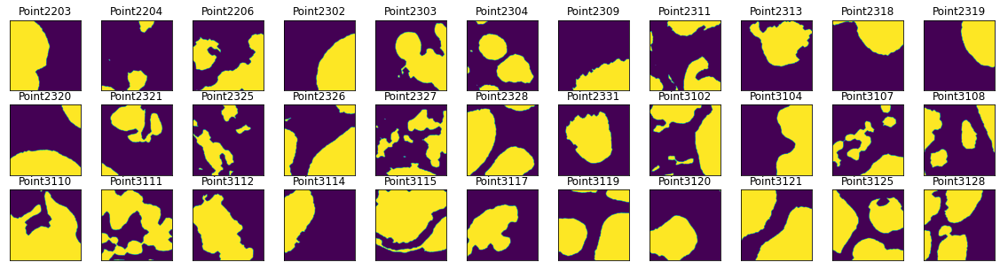

In [73]:
status = 'nonprogressor'
fig, axs = plt.subplots(nrows=3, ncols=11, figsize=(20, 5))
axs = axs.flatten()
for (s, d), ax in list(zip({k:v for k, v in sample_to_imgs.items() if k in status_to_samples[status]}.items(), axs)):
    img = d['region']['mask']
    ax.imshow(img)
    ax.set_title(s)
    ax.set_xticks([])
    ax.set_yticks([])

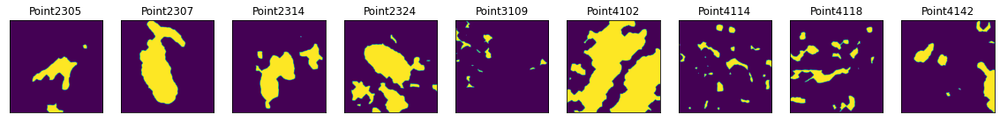

In [74]:
status = 'normal'
fig, axs = plt.subplots(nrows=1, ncols=9, figsize=(20, 5))
axs = axs.flatten()
for (s, d), ax in list(zip({k:v for k, v in sample_to_imgs.items() if k in status_to_samples[status]}.items(), axs)):
    img = d['region']['mask']
    ax.imshow(img)
    ax.set_title(s)
    ax.set_xticks([])
    ax.set_yticks([])

In [83]:
region_to_bbox = {reg:(r1, c1, r2, c2) for reg, r1, c1, r2, c2 in zip(
                    combined.index.to_list(),
                    combined['boundary_bbox-0'], combined['boundary_bbox-1'],
                    combined['boundary_bbox-2'], combined['boundary_bbox-3'])}

In [110]:
def get_display_image(s, labeled, region_to_bbox,
                      color='region_grid_metrics_SMA_integrity', cmap='viridis', df=None,
                      vmin=None, vmax=None):
    if df is None:
        df = combined

    f = df[df['sample']==s]
    f.index = [x.split('_')[-1] for x in f.index]
    rbbox = {reg.split('_')[-1]:tup for reg, tup in region_to_bbox.items() if s in reg} if region_to_bbox is not None else None
    region_to_val = {reg:v
                     for reg, v in zip(f.index, f[color])}
    rgba = display_region(labeled, region_to_val, rbbox, cmap=cmap, vmin=vmin, vmax=vmax)
    return rgba

In [112]:
def plot_feature_wrapper(feat):
    df = combined.copy()
    
    vmin, vmax = df[feat].min(), df[feat].max()
    df['status'] = [meta.loc[x, 'Status'] for x in df['sample']]
    for status in ['progressor', 'nonprogressor', 'normal']:
        print(status)
        f = df[df['status']==status]
        s2i = {k:v for k, v in sample_to_imgs.items() if k in status_to_samples[status]}
        nrows = (len(s2i) // 15) + 1
        fig, axs = plt.subplots(nrows=nrows, ncols=15, figsize=(20, nrows * 1.5))
        axs = axs.flatten()
        for (s, d), ax in zip(s2i.items(), axs):
            labeled = s2i[s]['region']['labeled']
            img = get_display_image(s, labeled, None, color=feat, df=f, vmin=vmin, vmax=vmax)
            ax.imshow(img)
            ax.set_title(s)

        for ax in axs[len(s2i):]:
            ax.imshow(np.ones((1,1,3)))

        for ax in axs:
            ax.set_xticks([])
            ax.set_yticks([])

        plt.show()
    
    

progressor


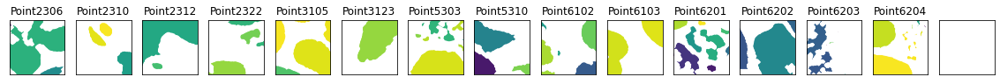

nonprogressor


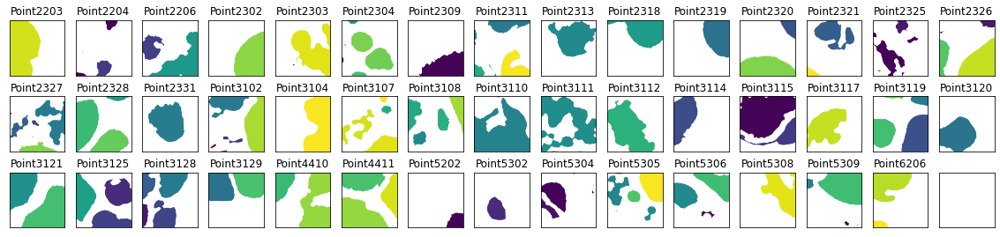

normal


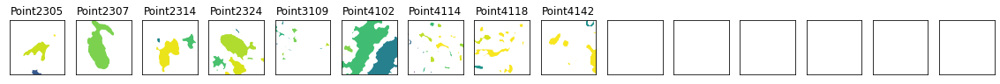

In [113]:
plot_feature_wrapper('region_grid_metrics_SMA_integrity')

progressor


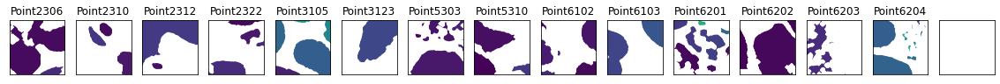

nonprogressor


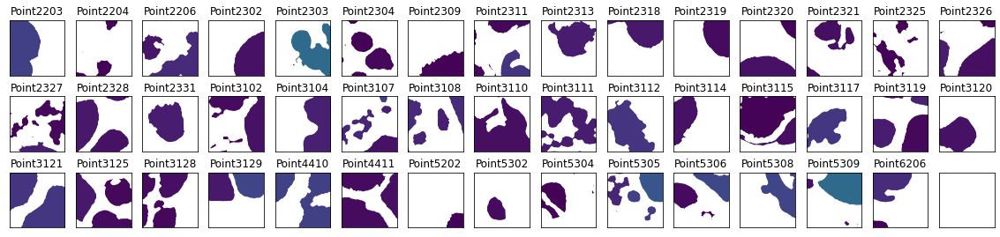

normal


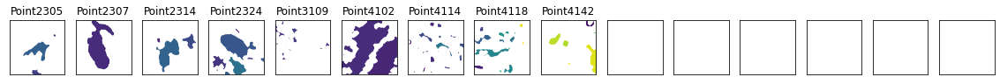

In [150]:
plot_feature_wrapper('myoepi_intensity_overlap_ECAD_SMA')

In [129]:
sns.color_palette('tab10')[0]

(0.12156862745098039, 0.4666666666666667, 0.7058823529411765)

In [140]:
np.expand_dims(sns.color_palette('tab10')[0], 0)

array([[0.12156863, 0.46666667, 0.70588235]])

In [229]:
from skimage.exposure import rescale_intensity
def make_pseudo(channel_to_img, cmap=None, contrast_pct=95.):
    cmap = sns.color_palette('tab10') if cmap is None else cmap
    
    new = np.zeros_like(next(iter(channel_to_img.values())))
    img_stack = []
    for i, (channel, img) in enumerate(channel_to_img.items()):
        color = cmap[i] if not isinstance(cmap, dict) else cmap[channel]
        new = img.copy().astype(np.float32)
        new -= new.min()
        new /= new.max()
        
        try:
            vmax = np.percentile(new[new>0], (contrast_pct)) if np.count_nonzero(new) else 1.
            new = rescale_intensity(new, in_range=(0., vmax))
        except IndexError:
            pass

        new = np.repeat(np.expand_dims(new, -1), 3, axis=-1)
        new *= color
        img_stack.append(new)
    stack = np.mean(np.asarray(img_stack), axis=0)
    stack -= stack.min()
    stack /= stack.max()
    return stack


In [219]:
channel_to_img = extract_ome_tiff(
    '../../multiplex_data/analysis/dcis_region_analysis/angelo_v4/Point2320/inputs/2320.ome.tiff',
    channels=['SMA', 'Nuc', 'ECAD'])
channel_to_img.keys()

dict_keys(['ECAD', 'Nuc', 'SMA'])

In [220]:
cmap = {
    'Nuc': (0., 0., 1.),
    'ECAD': (1., 0., 0.),
    'SMA': (0., 1., 0.)
}

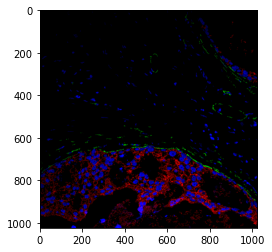

In [223]:
pseudo = make_pseudo(channel_to_img, cmap)
plt.imshow(pseudo)

In [114]:
channel_to_img = extract_ome_tiff('../../multiplex_data/analysis/dcis_region_analysis/angelo_v4/Point2320/inputs/2320.ome.tiff')
channel_to_img.keys()

dict_keys(['AR', 'Au', 'Aumaskf', 'Background', 'C', 'CD11c', 'CD14', 'CD20', 'CD3', 'CD31', 'CD36', 'CD4', 'CD44', 'CD45', 'CD56', 'CD68', 'CD8', 'CK5', 'CK7', 'COLI', 'COX2', 'Ca40', 'ECAD', 'ER', 'FAP', 'FOXP3', 'GLUT1', 'GZMB', 'HER2', 'HH3', 'HIF1a', 'HLADRDPDQ', 'IDO1', 'Ki67', 'MMP9', 'MPO', 'Nuc', 'P', 'P63', 'PD1', 'PDL1', 'PanKRT', 'SMA', 'Tryptase', 'VIM', 'pS6'])

In [224]:
fps = sorted(listfiles('../../multiplex_data/analysis/dcis_region_analysis/angelo_v4/', regex=r'ome.tiff'))
fps

['../../multiplex_data/analysis/dcis_region_analysis/angelo_v4/Point2203/inputs/2203.ome.tiff',
 '../../multiplex_data/analysis/dcis_region_analysis/angelo_v4/Point2204/inputs/2204.ome.tiff',
 '../../multiplex_data/analysis/dcis_region_analysis/angelo_v4/Point2206/inputs/2206.ome.tiff',
 '../../multiplex_data/analysis/dcis_region_analysis/angelo_v4/Point2302/inputs/2302.ome.tiff',
 '../../multiplex_data/analysis/dcis_region_analysis/angelo_v4/Point2303/inputs/2303.ome.tiff',
 '../../multiplex_data/analysis/dcis_region_analysis/angelo_v4/Point2304/inputs/2304.ome.tiff',
 '../../multiplex_data/analysis/dcis_region_analysis/angelo_v4/Point2305/inputs/2305.ome.tiff',
 '../../multiplex_data/analysis/dcis_region_analysis/angelo_v4/Point2306/inputs/2306.ome.tiff',
 '../../multiplex_data/analysis/dcis_region_analysis/angelo_v4/Point2307/inputs/2307.ome.tiff',
 '../../multiplex_data/analysis/dcis_region_analysis/angelo_v4/Point2309/inputs/2309.ome.tiff',
 '../../multiplex_data/analysis/dcis_reg

In [236]:
cmap = {
    'Nuc': (0., 0., 1.),
    'ECAD': (1., 0., 0.),
    'SMA': (0., 1., 0.)
}
sample_to_pseudo = {}
for fp in fps:
    sid = fp.split('/')[-3]
    c2i = extract_ome_tiff(fp, channels=['SMA', 'Nuc', 'ECAD'])
    pseudo = make_pseudo(c2i, cmap, contrast_pct=10.)
    sample_to_pseudo[sid] = pseudo

/diskmnt/Projects/Users/estorrs/miniconda3/envs/squidpy/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in true_divide
  # This is added back by InteractiveShellApp.init_path()


progressor


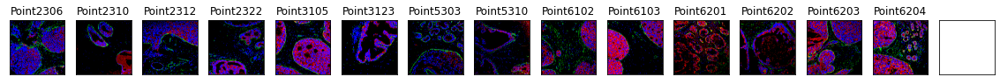

nonprogressor


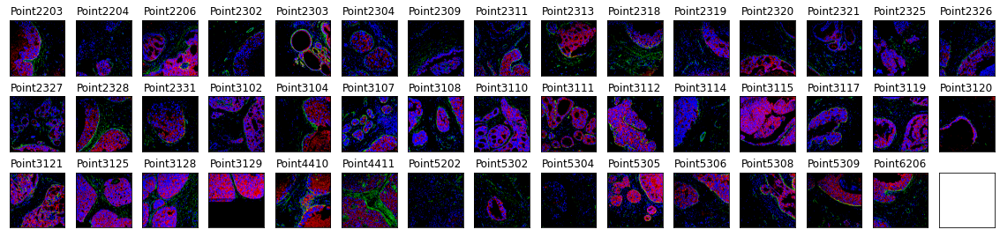

normal


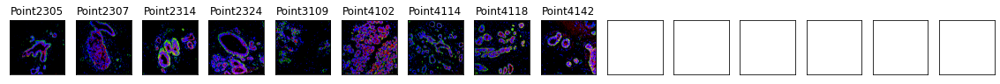

In [237]:
df = combined.copy()
df['status'] = [meta.loc[x, 'Status'] for x in df['sample']]
for status in ['progressor', 'nonprogressor', 'normal']:
    print(status)
    f = df[df['status']==status]
    s2i = {k:v for k, v in sample_to_pseudo.items() if k in status_to_samples[status]}
    nrows = (len(s2i) // 15) + 1
    fig, axs = plt.subplots(nrows=nrows, ncols=15, figsize=(20, nrows * 1.5))
    axs = axs.flatten()
    for (s, d), ax in zip(s2i.items(), axs):
        ax.imshow(d)
        ax.set_title(s)
    
    for ax in axs[len(s2i):]:
        ax.imshow(np.ones((1,1,3)))
        
    for ax in axs:
        ax.set_xticks([])
        ax.set_yticks([])
        
    plt.show()
    
    

progressor


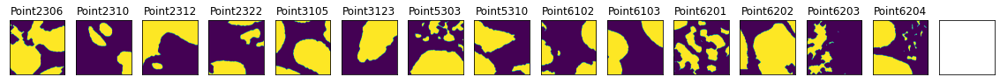

nonprogressor


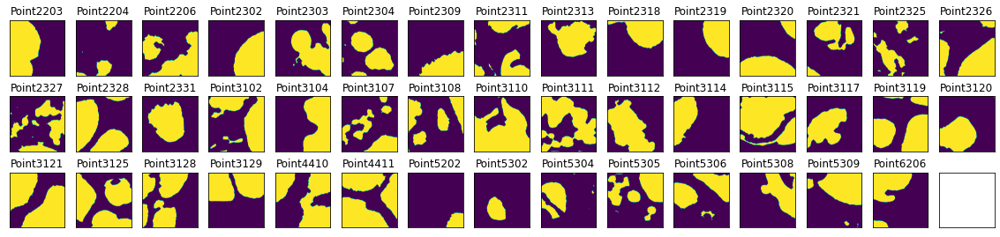

normal


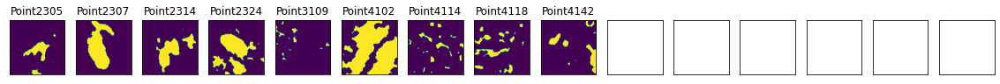

In [98]:
df = combined.copy()
df['status'] = [meta.loc[x, 'Status'] for x in df['sample']]
for status in ['progressor', 'nonprogressor', 'normal']:
    print(status)
    f = df[df['status']==status]
    s2i = {k:v for k, v in sample_to_imgs.items() if k in status_to_samples[status]}
    nrows = (len(s2i) // 15) + 1
    fig, axs = plt.subplots(nrows=nrows, ncols=15, figsize=(20, nrows * 1.5))
    axs = axs.flatten()
    for (s, d), ax in zip(s2i.items(), axs):
        labeled = s2i[s]['region']['labeled']
#         img = get_display_image(s, labeled, region_to_bbox,
#                                 color='region_grid_metrics_SMA_integrity', df=f)
#         ax.imshow(img)
        ax.imshow(labeled>0)
        ax.set_title(s)
    
    for ax in axs[len(s2i):]:
        ax.imshow(np.ones((1,1,3)))
        
    for ax in axs:
        ax.set_xticks([])
        ax.set_yticks([])
        
    plt.show()
    
    

In [79]:
sid = 'Point2206'

In [80]:
'/diskmnt/Projects/Users/estorrs/multiplex_data/analysis/dcis_region_analysis/angelo_v4/Point2206/inputs/2206.ome.tiff'

'/diskmnt/Projects/Users/estorrs/multiplex_data/analysis/dcis_region_analysis/angelo_v4/Point2206/inputs/2206.ome.tiff'

In [81]:
tifffile.imsave(f'/diskmnt/Projects/Users/estorrs/sandbox/{sid}_region.tif', sample_to_imgs[sid]['region']['mask'])

In [82]:
tifffile.imsave(f'/diskmnt/Projects/Users/estorrs/sandbox/{sid}_myoepi.tif', sample_to_imgs[sid]['myoepi']['mask'])